In [54]:
import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.optimize as sco
import os
import plotly.graph_objects as go
from itertools import combinations
from sklearn.preprocessing import StandardScaler
from pathlib import Path

scaler = StandardScaler()

desired_path="/K_medoids_cluster_analysis/Results_with_sentiment/cluster_df_cl3/"

qtfilename="_qt_result.csv"

path = Path(os.getcwd())

dir1=path.parent.parent.parent.parent

final_path=str(dir1)+desired_path

## Efficient Frontier portfolio allocation technique.

In [55]:
def portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len):
    returns = np.sum(mean_returns*weights ) * df_len
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(df_len)
    return std, returns

def random_portfolios(num_portfolios, mean_returns, cov_matrix, risk_free_rate, stocks_len, df_len):
    results = np.zeros((3,num_portfolios))
    weights_record = []
    for i in range(num_portfolios):
        weights = np.random.random(stocks_len)
        weights /= np.sum(weights)
        weights_record.append(weights)
        portfolio_std_dev, portfolio_return_var = portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)
        results[0,i] = portfolio_std_dev
        results[1,i] = portfolio_return_var
        results[2,i] = (portfolio_return_var - risk_free_rate) / portfolio_std_dev
        
    #max_sharpe = max(results[2])
    #for i in range(len(results[2])):
        #if results[2, i] == max_sharpe:
            #print("index {} and weights are {} max sharpe value {}".format(i, weights_record[i], max_sharpe))
            
    return results, weights_record

def pos_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate, df_len):
    p_var, p_ret = portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)
    return (p_ret - risk_free_rate) / p_var

def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate, df_len):
    p_var, p_ret = portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)
    return -(p_ret - risk_free_rate) / p_var

def max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate, df_len):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, risk_free_rate, df_len)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(neg_sharpe_ratio, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)
    return result

def portfolio_volatility(weights, mean_returns, cov_matrix, df_len): 
    return portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)[0]

def min_variance(mean_returns, cov_matrix, df_len):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, df_len)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))

    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)

    return result

def efficient_return(mean_returns, cov_matrix, target, df_len):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, df_len)
    
    def portfolio_return(weights, df_len):
        return portfolio_annualised_performance(weights, mean_returns, cov_matrix, df_len)[1]

    constraints = ({'type': 'eq', 'fun': lambda x: portfolio_return(x, df_len) - target},
                   {'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bounds = tuple((0,1) for asset in range(num_assets))
    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args, method='SLSQP', bounds=bounds, constraints=constraints)
    return result


def efficient_frontier(mean_returns, cov_matrix, returns_range, df_len):
    efficients = []
    for ret in returns_range:
        efficients.append(efficient_return(mean_returns, cov_matrix, ret, df_len))
    return efficients


def display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate, table, stocks_len, df_len):
    results, _ = random_portfolios(num_portfolios,mean_returns, cov_matrix, risk_free_rate, stocks_len, df_len)
    #print("results == \n", max(results[2]))
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate, df_len) 
    pos_sharpe = pos_sharpe_ratio(max_sharpe['x'], mean_returns, cov_matrix, risk_free_rate, df_len)
    #print("pos_sharpe == \n", pos_sharpe)
    
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix, df_len)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    max_sharpe_allocation

    min_vol = min_variance(mean_returns, cov_matrix, df_len)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix, df_len)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    print("-"*80)
    print( "Maximum Sharpe Ratio Portfolio Allocation\n")
    print( "Annualised Return:", round(rp,2))
    print( "Annualised Volatility:", round(sdp,2))
    print ("\n")
    print (max_sharpe_allocation)
    print( "-"*80)
    print ("Minimum Volatility Portfolio Allocation\n")
    print( "Annualised Return:", round(rp_min,2))
    print( "Annualised Volatility:", round(sdp_min,2))
    print ("\n")
    print (min_vol_allocation)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='YlGnBu', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.32, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target, df_len)
    plt.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    plt.title('Calculated Portfolio Optimization based on Efficient Frontier')
    plt.xlabel('annualised volatility')
    plt.ylabel('annualised returns')
    plt.legend(labelspacing=0.8)
    plt.show()
    return (pos_sharpe, round(rp,2), round(sdp,2), max_sharpe_allocation.values)


def display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate,table, df_len):
    returns = table.pct_change()
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate, df_len)
    #print("Max Sharpe ==\n", max_sharpe)
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix, df_len)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    max_sharpe_allocation
    

    min_vol = min_variance(mean_returns, cov_matrix, df_len)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix, df_len)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    an_vol = np.std(returns) * np.sqrt(df_len)
    an_rt = mean_returns * df_len
    
    print ("-"*80)
    print ("Individual Stock Returns and Volatility\n")
    for i, txt in enumerate(table.columns):
        print (txt,":","annuaised return",round(an_rt[i],2),", annualised volatility:",round(an_vol[i],2))
    print ("-"*80)
    
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.scatter(an_vol,an_rt,marker='o',s=200)

    for i, txt in enumerate(table.columns):
        ax.annotate(txt, (an_vol[i],an_rt[i]), xytext=(10,0), textcoords='offset points')
    ax.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    ax.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.34, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target, df_len)
    ax.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    ax.set_title('Portfolio Optimization with Individual Stocks')
    ax.set_xlabel('annualised volatility')
    ax.set_ylabel('annualised returns')
    ax.legend(labelspacing=0.8)
    plt.show()

# display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate)
# call this for different portfolios
# display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate)
# call this for the companies selected for the portfolio

def efficient_frontier_stock_portfolio(stocks, stocks_len, risk_free_rate_in, start_date, end_date):
    data_temp = pd.read_csv('../../../../../Data-Acquisition/ohlcv-data/ohlcv.csv') 
    #print(data_temp)
    data_temp["time"] = pd.to_datetime(data_temp.time, format='%d/%m/%Y')
    start_date = pd.to_datetime(start_date)
    end_date = pd.to_datetime(end_date)
    data = data_temp[(data_temp["time"] >= start_date) & (data_temp["time"]< end_date)]
    #print(data)
    data["time"] = pd.to_datetime(data.time, format='%d/%m/%Y')
    data = data[['time','adjusted_close', 'symbol']]
    data = data.rename(columns={'time': 'date', 'adjusted_close': 'adj_close', 'symbol': 'ticker'})
    data = data[data['ticker'].isin(stocks)]
    #print(data)
    df_len = len(data.groupby("date"))
    #print("\nShape of the df {}, df len {}".format(df_len,data.shape))

    df = data.set_index('date')
    table = df.pivot(columns='ticker')
    # By specifying col[1] in below list comprehension
    # You can select the stock names under multi-level column
    table.columns = [col[1] for col in table.columns]
    table.head()

    plt.figure(figsize=(16, 9))
    for c in table.columns.values:
        plt.plot(table.index, table[c], lw=2, alpha=0.8,label=c)
    plt.legend(loc='upper right', fontsize=12)
    plt.ylabel('price in $')
    plt.title('Stocks Closing price in $')
    plt.show()

    returns = table.pct_change()
    plt.figure(figsize=(14, 7))
    for c in returns.columns.values:
        plt.plot(returns.index, returns[c], lw=3, alpha=0.8,label=c)
    plt.legend(loc='upper left', fontsize=12)
    plt.ylabel('daily returns')
    plt.title('Stocks Closing daily returns variation')
    plt.show()
    
    returns = table.pct_change()
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    num_portfolios = 25000
    risk_free_rate = 0.0095
    

    pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate, table, stocks_len, df_len)
    display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate, table, df_len)
    
    return (pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights)

In [56]:
def check_cor_cov_relation(covariance, correlation, mean_covariance, stocks):
    paired_stocks = np.zeros(covariance.shape)

    for i in range(len(stocks)):
        for j in range(len(stocks)-i):
            if(covariance[i,j] > mean_covariance[i] or covariance[i,j] > mean_covariance[j] or correlation[i][j]>0.5):
                paired_stocks[i,j] = 0
            else:
                paired_stocks[i,j] = 1

    return paired_stocks

In [57]:
def stocks_pair_lookup(stockspair, stocks_range_values, paired_stocks):
    nostockspair = []
    for i in stocks_range_values:
        if(i not in stockspair):
            nostockspair.append(i)
        else:
            continue
            
    for stock_ticker in nostockspair:
        cummulative_stockpair = len(stockspair)
        for i in stockspair:
            if(paired_stocks[stock_ticker,i]!=1 or paired_stocks[i,stock_ticker]!=1):
                cummulative_stockpair -= 1
        if(float(cummulative_stockpair)/len(stockspair) > 0.5):
            stockspair.add(stock_ticker)              
    return stockspair

In [58]:
def make_company_portfolios(stocks_combination, stocks_range, paired_stocks, portfolio_collection):  
    stockpair = set(stocks_combination)
    stockpair = stocks_pair_lookup(stockpair, stocks_range, paired_stocks)
    if stockpair not in portfolio_collection:
        portfolio_collection.append(stockpair)
    return portfolio_collection

In [59]:
def generate_portfolio_pairs(stocks):
    print(stocks)
    data = pd.read_csv('../../../../../Data-Acquisition/ohlcv-data/ohlcv.csv')  
    data["time"] = pd.to_datetime(data.time, format='%d/%m/%Y')
    data = data[['time','adjusted_close', 'symbol']]
    data = data.rename(columns={'time': 'date', 'adjusted_close': 'adj_close', 'symbol': 'ticker'})
    data = data[data['ticker'].isin(stocks)]

    df = data.set_index('date')
    table = df.pivot(columns='ticker')
    # By specifying col[1] in below list comprehension
    # You can select the stock names under multi-level column
    table.columns = [col[1] for col in table.columns]
    
    returns = table.pct_change()
    mean_returns = returns.mean()
    cov_matrix = returns.cov()
    correlation_matrix = returns.corr()
    np.round(correlation_matrix,3)
    mean_covariance = cov_matrix.mean()

    paired_stocks = check_cor_cov_relation(np.array(cov_matrix), np.array(correlation_matrix), mean_covariance, stocks)
    
    return paired_stocks

In [60]:
def get_portfolio_pairs(stocks):
    paired_stocks = generate_portfolio_pairs(stocks)
    stocks_range_values = range(len(stocks))
    count=0
    port_list = list(combinations(stocks_range_values,2))
    portfolio_collection = []
    for stocks_combination in port_list:
        count +=1
        if(paired_stocks[stocks_combination[0],stocks_combination[1]]!=1 or paired_stocks[stocks_combination[1],stocks_combination[0]]!=1):
            continue
        else:
            portfolio_collection = make_company_portfolios(stocks_combination, stocks_range_values, paired_stocks, portfolio_collection)

    company_name = []
    for i in portfolio_collection:
        company_name_list =[]
        for j in i:
            company_name_list.append(stocks[j])
        company_name.append(company_name_list)
    
        #print(company_name)
    
    return company_name

In [61]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_roc = df_read.groupby("label")["EMA"].max().reset_index()
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='EMA', right_on='EMA').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset1.csv")

In [62]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_roc = df_read.groupby("label")["ROC"].max().reset_index()
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='ROC', right_on='ROC').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset2.csv")

In [63]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_read = df_read[(df_read["RSI"] >= 30) | (df_read["RSI"] <= 70)]
        df_read = df_read[df_read["ROC"] > 0]
        df_roc = df_read.groupby("label")["ROC"].max().reset_index()
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='ROC', right_on='ROC').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset3.csv")

In [64]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_read = df_read[(df_read["RSI"] >= 30) | (df_read["RSI"] <= 70)]
        df_read = df_read[df_read["ROC"] > 0]
        df_roc = df_read.groupby("label")["EMA"].max().reset_index()
        #Inner join on the values to identify the stock with max EMA for the cluster.
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='EMA', right_on='EMA').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset4.csv")

In [65]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for i in range (1,9):
        df_read = pd.read_csv(final_path+str(i)+qtfilename)
        df_read = df_read[(df_read["RSI"] >= 30) | (df_read["RSI"] <= 70)]
        #having a +ve ROC ensures "risk" of losing out on profit is taken into consideration.
        df_read = df_read[df_read["ROC"] > 0]
        #higher value of ATR says that the volitility is more.
        #high value of the ATR and positive ROC indicates that the stock is on increasing trend and also return can be higher.
        df_roc = df_read.groupby("label")["ATR"].max().reset_index()
        #Inner join on the values to identify the stock with max EMA for the cluster.
        df_companies = pd.merge(left=df_roc, right=df_read, left_on='ATR', right_on='ATR').drop(["label_x"], axis=1)
        potential_comp = df_companies[["symbol", "start_date", "sector"]]
        new_df = new_df.append(potential_comp, ignore_index="true")

new_df.sort_values("start_date").to_csv("ohlcnews_stocks_subset5.csv")

In [66]:
new_df = pd.DataFrame(columns=["symbol", "start_date", "sector"])
for filename in os.listdir():
    if filename.startswith("ohlcnews_stocks"):
        df_read = pd.read_csv(filename)
        #combine all the stocks taken into a dataframe and take the unique set from it to arrive 
        #at your stock portfolio.
        new_df = new_df.append(df_read, ignore_index="true")
        
portfolio_list = new_df["symbol"].unique()
print("These are the best stocks to be from among the 200 companies for the 2 year period data")
print("using the linear methods of stock portfolio creation:")
print(portfolio_list)

These are the best stocks to be from among the 200 companies for the 2 year period data
using the linear methods of stock portfolio creation:
['EQIX' 'AMZN' 'GOOGL' 'CMG' 'AZO' 'NEE' 'BKNG' 'AJG' 'EFX' 'BLK' 'BIIB'
 'AAPL' 'CBS' 'AMD' 'AON' 'DHI' 'CXO' 'NEM' 'CMCSA' 'BAC' 'COTY' 'KMI'
 'HP' 'BMY' 'APC' 'EMR' 'MLM' 'AOS' 'CTXS' 'BA' 'ADBE']


In [67]:
quarter_list=["2018-04-01", "2018-07-01", "2018-10-01", "2019-01-01", "2019-04-01", "2019-07-01", "2019-10-01", "2020-01-01", "2020-04-01"]

for idx in range(1, len(quarter_list)):
    df_quarter_data = new_df[(new_df["start_date"] >= quarter_list[idx-1]) & (new_df["start_date"]< quarter_list[idx])]
    print("Companies listed in quarter {} which is between {} and {}".format(idx, quarter_list[idx-1], quarter_list[idx]))
    list_of_companies = df_quarter_data["symbol"].unique()
    df_read = pd.read_csv(final_path+str(idx)+qtfilename)
    df_unscaled = df_read.copy()
    df_unscaled_required = df_unscaled[["RSI", "ROC", "ADOSC", "ATR", "EMA", "Sharpe_ratio", "wtd_sentiment"]]
    df_read_scaled = pd.DataFrame(scaler.fit_transform(df_unscaled_required))
    df_read_scaled.columns = list(df_unscaled_required)
    df_read_scaled["symbol"] = df_unscaled["symbol"]
    rsi_list = []
    roc_list = []
    adosc_list = []
    atr_list = []
    ema_list = []
    sharpe_list = []
    avgret_list = []
    wt_senti_list = []
    for comp in list_of_companies:
        df_comp = df_read_scaled[df_read_scaled["symbol"] == comp]
        rsi_list.append(df_comp["RSI"].values[0])
        roc_list.append(df_comp["ROC"].values[0])
        adosc_list.append(df_comp["ADOSC"].values[0])
        atr_list.append(df_comp["ATR"].values[0])
        ema_list.append(df_comp["EMA"].values[0])
        sharpe_list.append(df_comp["Sharpe_ratio"].values[0])
        wt_senti_list.append(df_comp["wtd_sentiment"].values[0])
    
    fig = go.Figure(data=[
        go.Bar(name='RSI', x=list_of_companies, y=rsi_list),
        go.Bar(name='ROC', x=list_of_companies, y=roc_list),
        go.Bar(name='ADOSC', x=list_of_companies, y=adosc_list),
        go.Bar(name='ATR', x=list_of_companies, y=atr_list),
        go.Bar(name='EMA', x=list_of_companies, y=ema_list),
        go.Bar(name='Sharpe_ratio', x=list_of_companies, y=sharpe_list),
        go.Bar(name='wtd_sentiment', x=list_of_companies, y=wt_senti_list)
    ])
    fig.update_layout(
    barmode='group',
    title="Feature distribution for the comapnies selected in the quarter",
    xaxis_title="Company names",
    yaxis_title="Scaled values of the features",
    font=dict(
        family="Courier New, monospace",
        size=12,
        color="#7f7f7f"
    ))
        
    fig.show()

Companies listed in quarter 1 which is between 2018-04-01 and 2018-07-01


Companies listed in quarter 2 which is between 2018-07-01 and 2018-10-01


Companies listed in quarter 3 which is between 2018-10-01 and 2019-01-01


Companies listed in quarter 4 which is between 2019-01-01 and 2019-04-01


Companies listed in quarter 5 which is between 2019-04-01 and 2019-07-01


Companies listed in quarter 6 which is between 2019-07-01 and 2019-10-01


Companies listed in quarter 7 which is between 2019-10-01 and 2020-01-01


Companies listed in quarter 8 which is between 2020-01-01 and 2020-04-01


Companies listed in quarter 1 which is between 2018-04-01 and 2018-07-01
['EQIX' 'AMZN' 'CBS' 'AMD' 'AON' 'BKNG' 'BLK']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'CBS']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



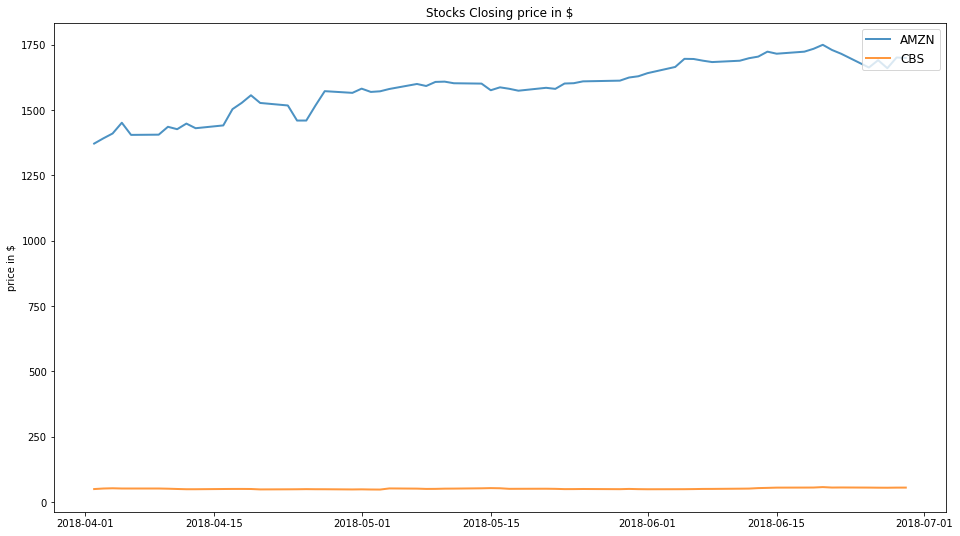

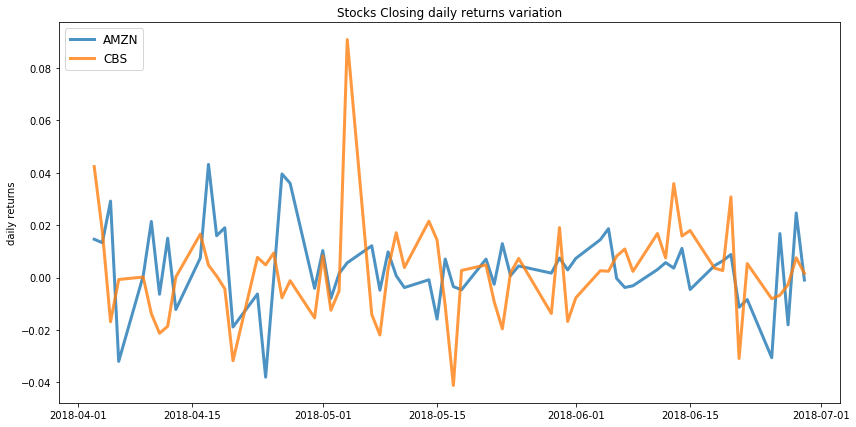

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.2
Annualised Volatility: 0.1


             AMZN    CBS
allocation  79.54  20.46
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.19
Annualised Volatility: 0.1


             AMZN    CBS
allocation  63.04  36.96


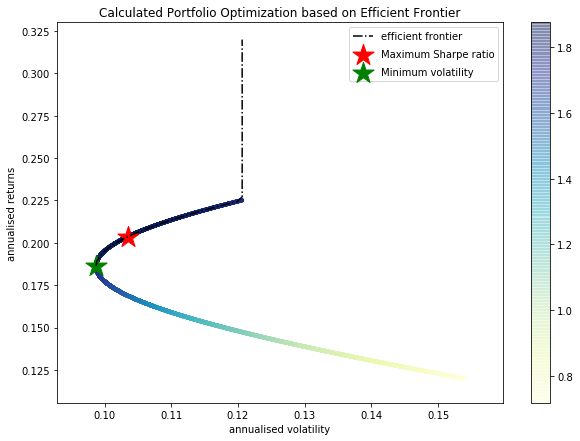

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.23 , annualised volatility: 0.12
CBS : annuaised return 0.12 , annualised volatility: 0.15
--------------------------------------------------------------------------------


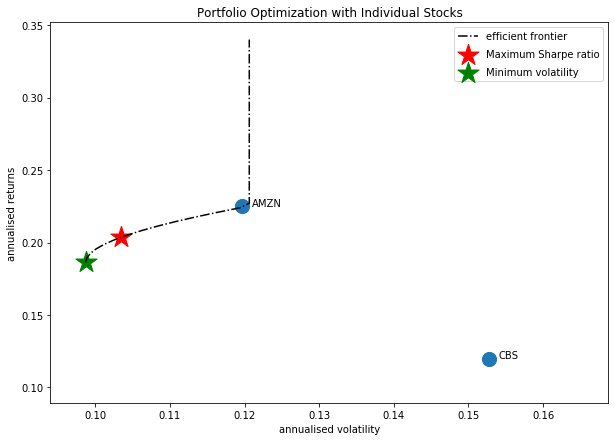

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'BKNG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



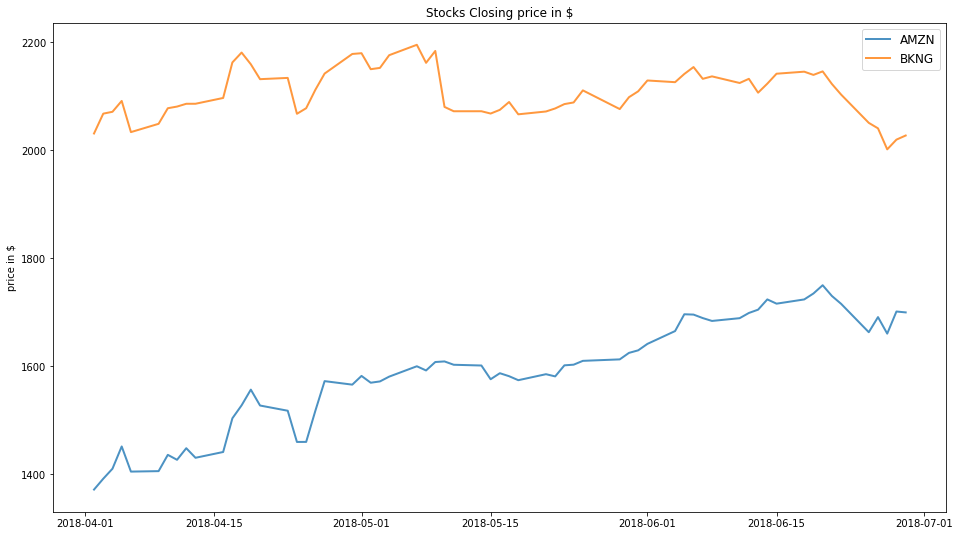

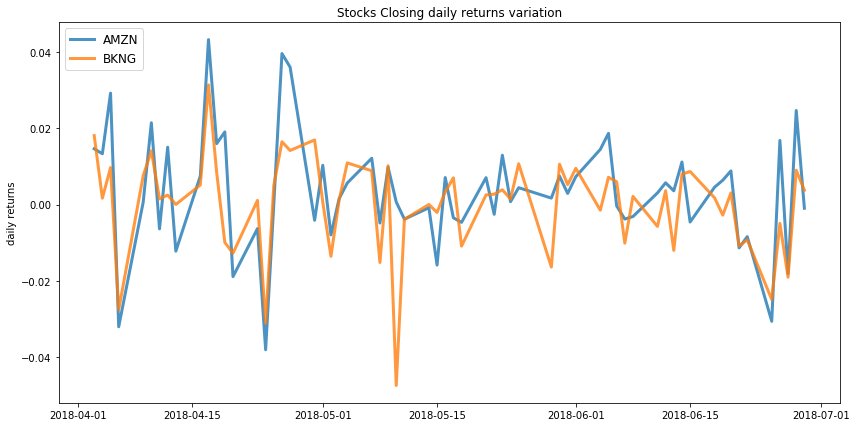

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.23
Annualised Volatility: 0.12


             AMZN  BKNG
allocation  100.0  0.0 
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.06
Annualised Volatility: 0.1


             AMZN   BKNG
allocation  26.51  73.49


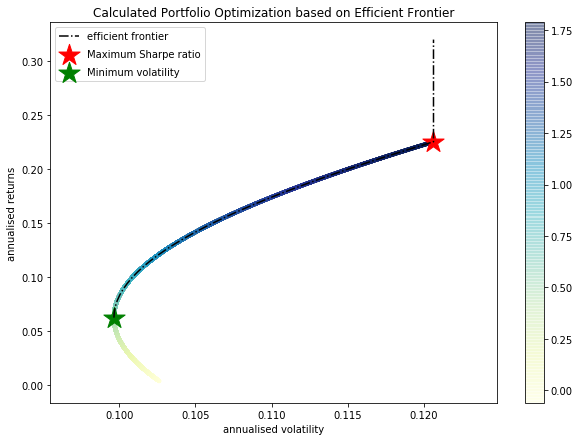

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.23 , annualised volatility: 0.12
BKNG : annuaised return 0.0 , annualised volatility: 0.1
--------------------------------------------------------------------------------


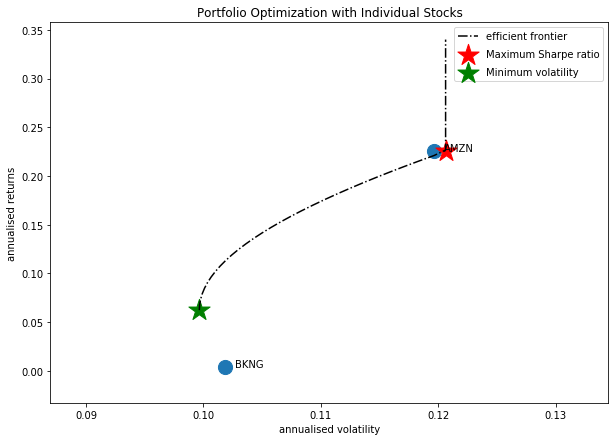

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CBS', 'AMD']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



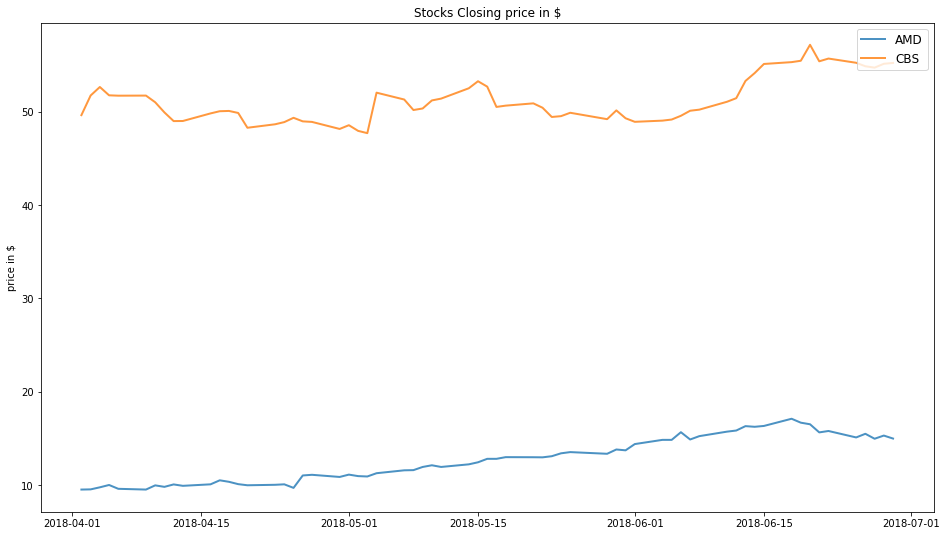

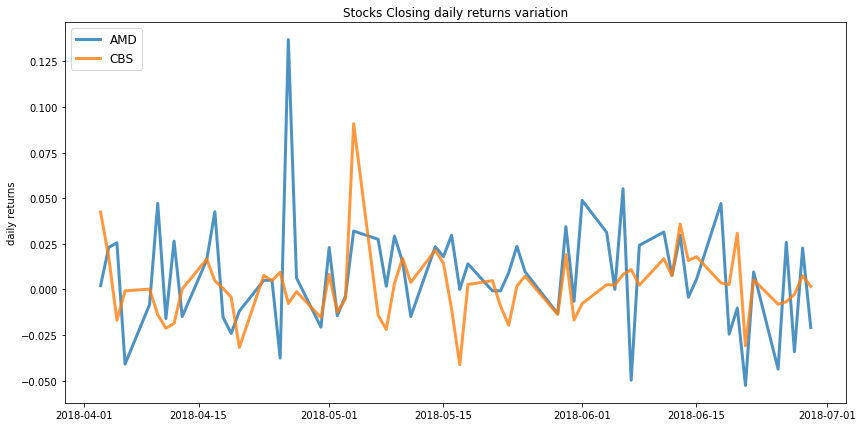

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.4
Annualised Volatility: 0.19


              AMD    CBS
allocation  75.79  24.21
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.21
Annualised Volatility: 0.14


              AMD    CBS
allocation  25.19  74.81


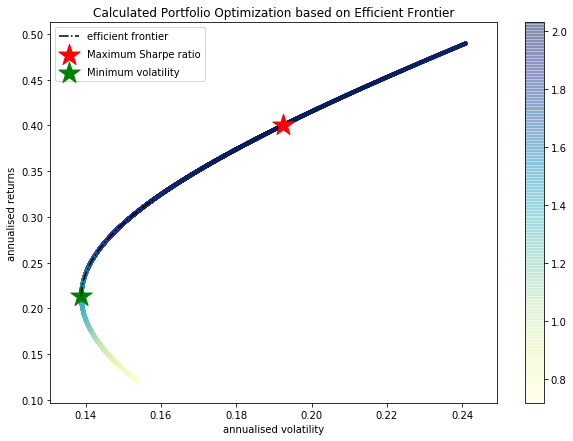

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMD : annuaised return 0.49 , annualised volatility: 0.24
CBS : annuaised return 0.12 , annualised volatility: 0.15
--------------------------------------------------------------------------------


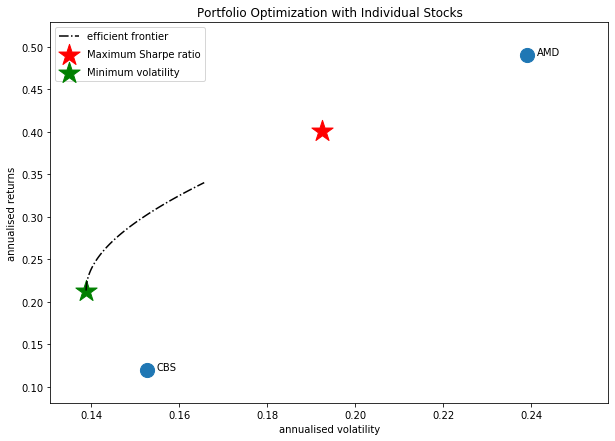

Companies listed in quarter 2 which is between 2018-07-01 and 2018-10-01
['GOOGL' 'CMG' 'AMZN' 'AMD' 'DHI' 'CXO' 'BKNG']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'AMD']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



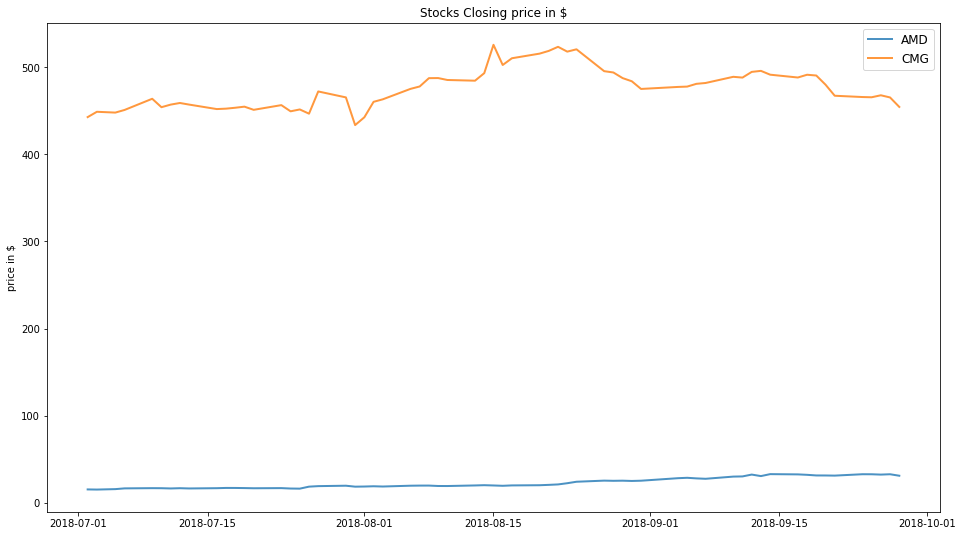

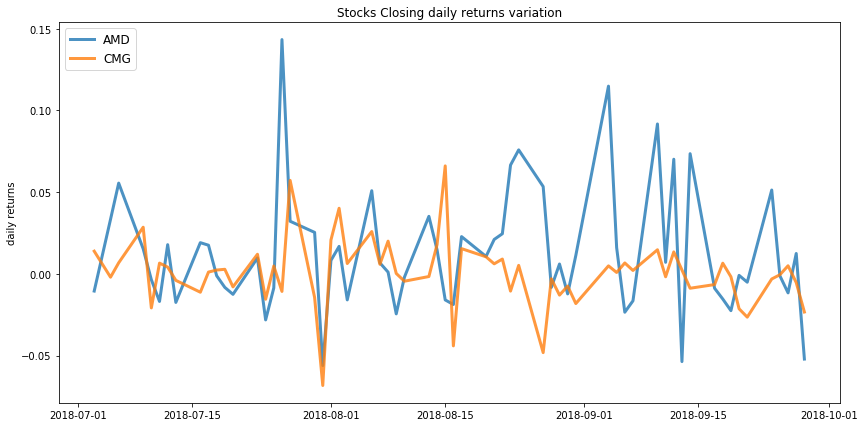

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.77
Annualised Volatility: 0.3


              AMD  CMG
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.18
Annualised Volatility: 0.15


              AMD    CMG
allocation  19.22  80.78


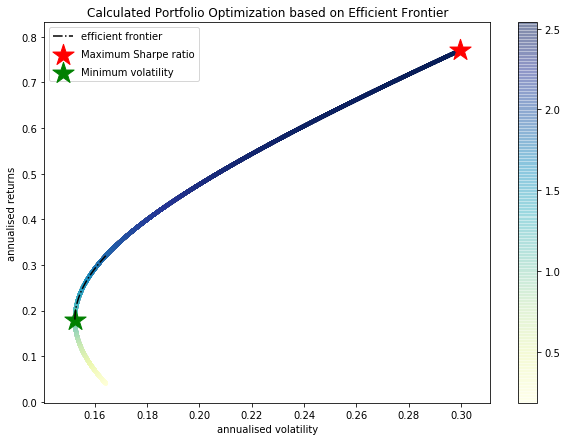

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMD : annuaised return 0.77 , annualised volatility: 0.3
CMG : annuaised return 0.04 , annualised volatility: 0.16
--------------------------------------------------------------------------------


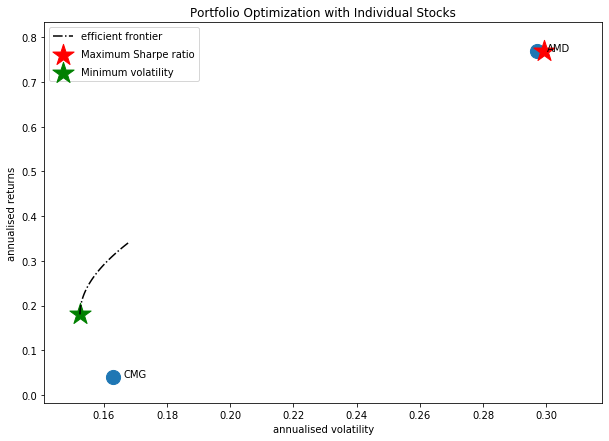

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'DHI']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



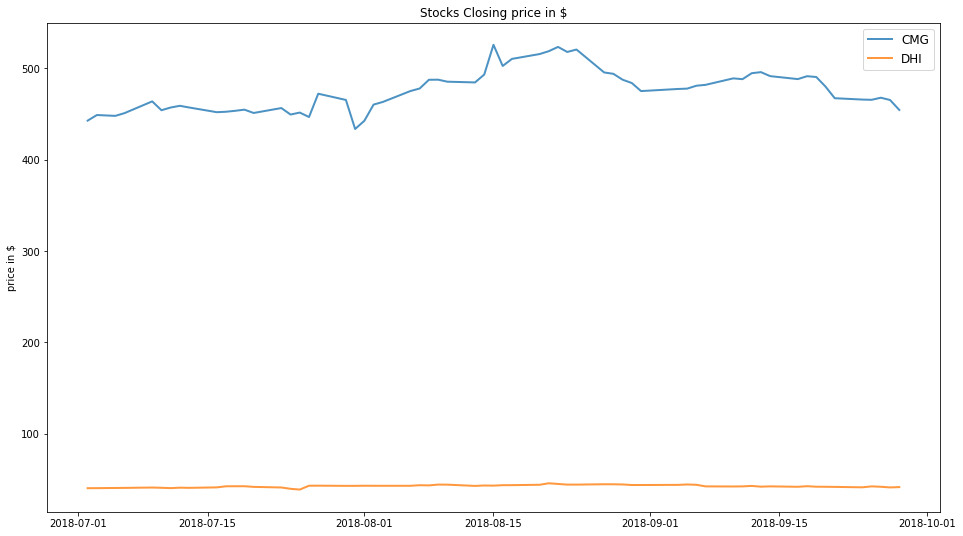

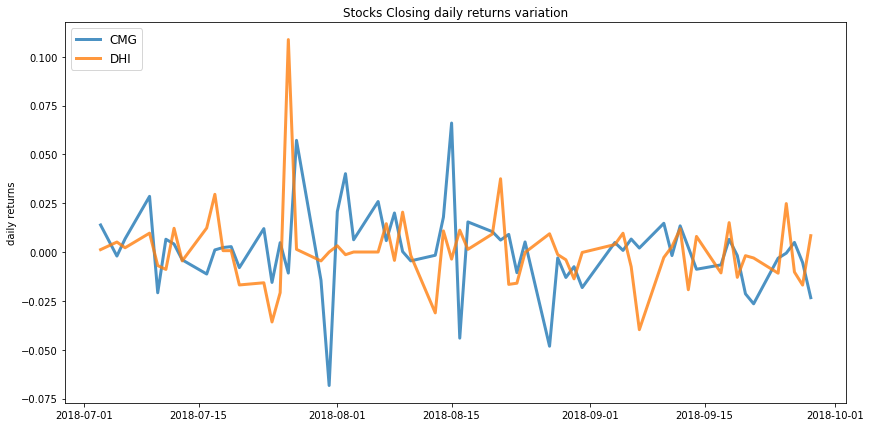

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.04
Annualised Volatility: 0.11


              CMG    DHI
allocation  46.25  53.75
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.04
Annualised Volatility: 0.11


              CMG    DHI
allocation  47.67  52.33


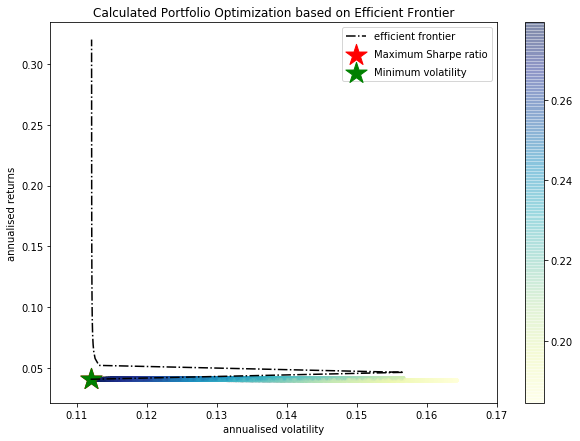

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CMG : annuaised return 0.04 , annualised volatility: 0.16
DHI : annuaised return 0.04 , annualised volatility: 0.16
--------------------------------------------------------------------------------


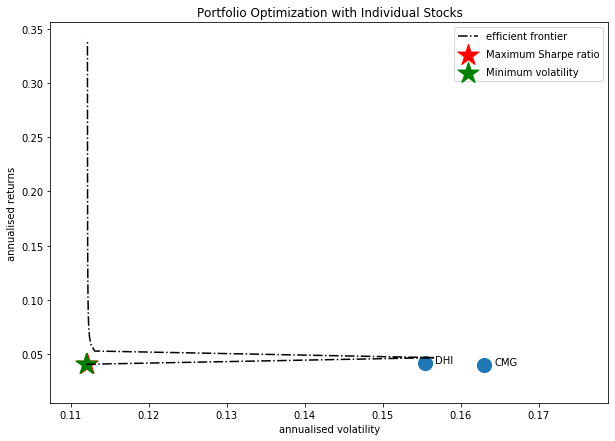

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMG', 'CXO']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



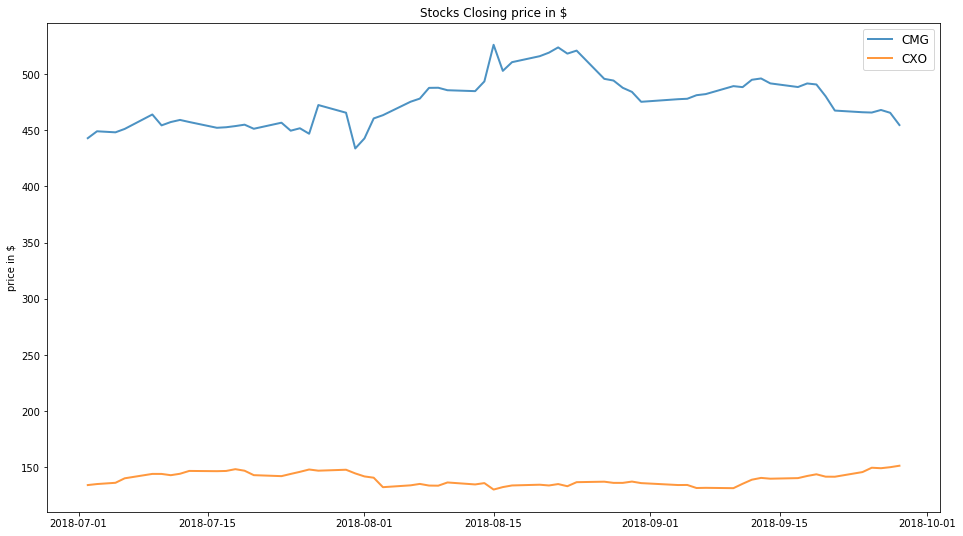

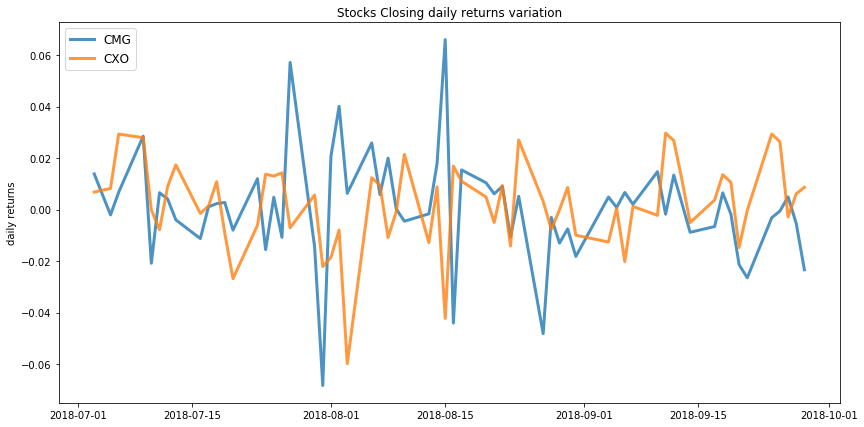

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.11
Annualised Volatility: 0.11


              CMG    CXO
allocation  18.72  81.28
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.09
Annualised Volatility: 0.1


              CMG    CXO
allocation  40.41  59.59


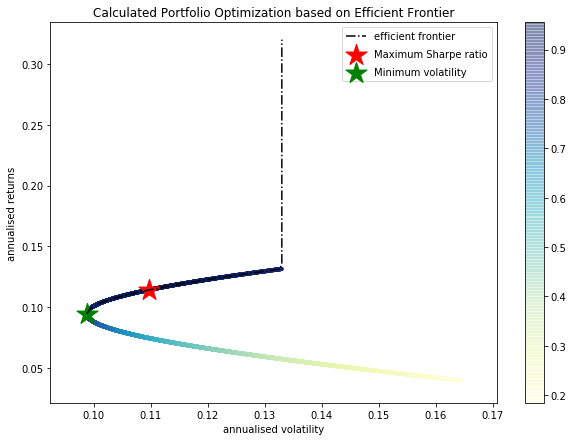

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CMG : annuaised return 0.04 , annualised volatility: 0.16
CXO : annuaised return 0.13 , annualised volatility: 0.13
--------------------------------------------------------------------------------


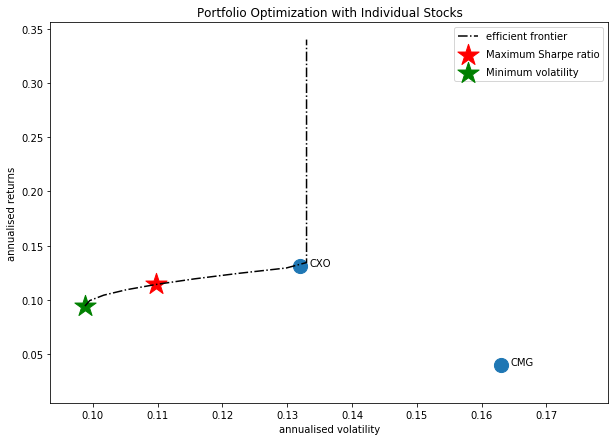

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'AMD']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



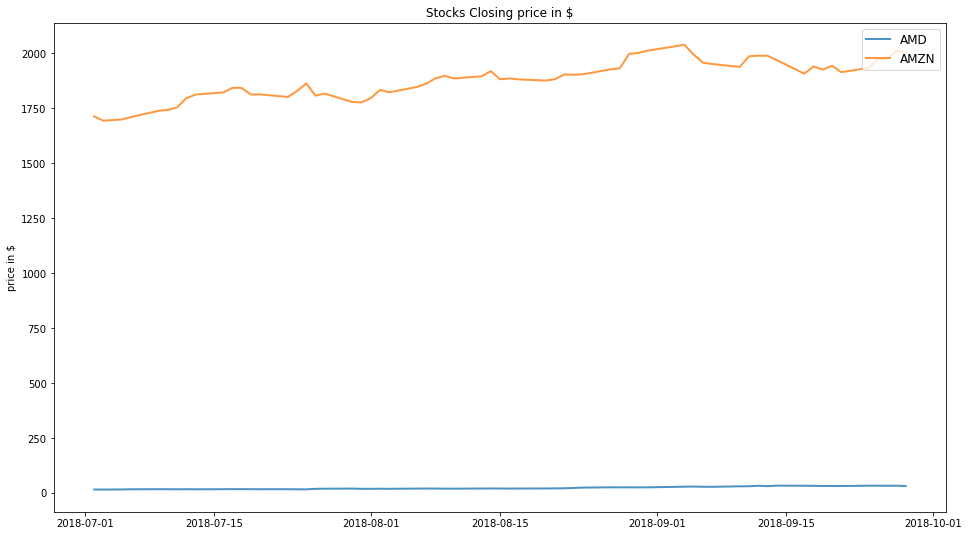

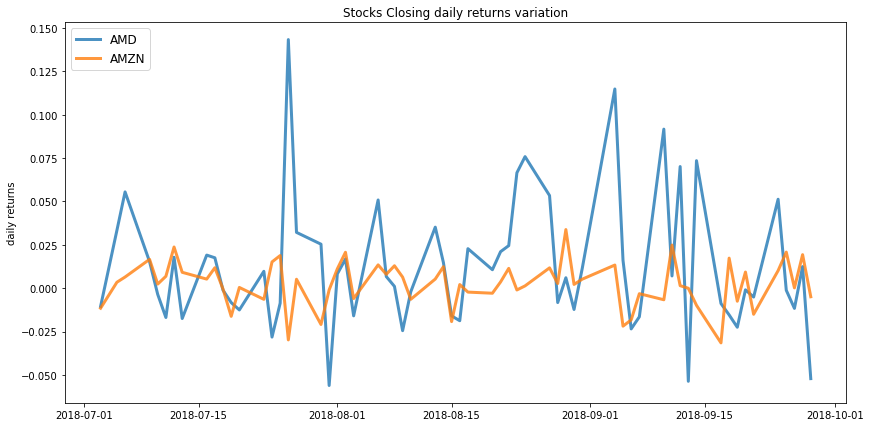

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.39
Annualised Volatility: 0.13


             AMD  AMZN
allocation  36.7  63.3
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.24
Annualised Volatility: 0.1


              AMD   AMZN
allocation  11.72  88.28


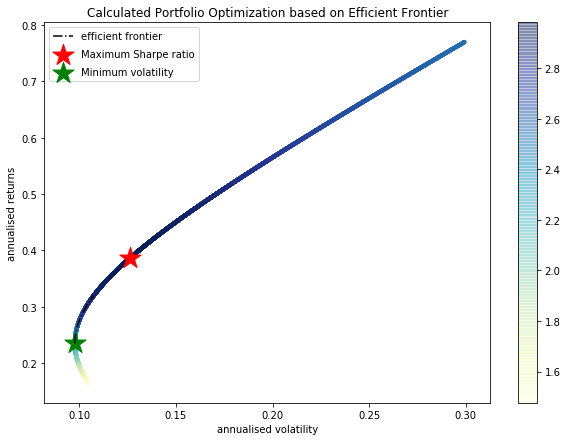

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMD : annuaised return 0.77 , annualised volatility: 0.3
AMZN : annuaised return 0.16 , annualised volatility: 0.1
--------------------------------------------------------------------------------


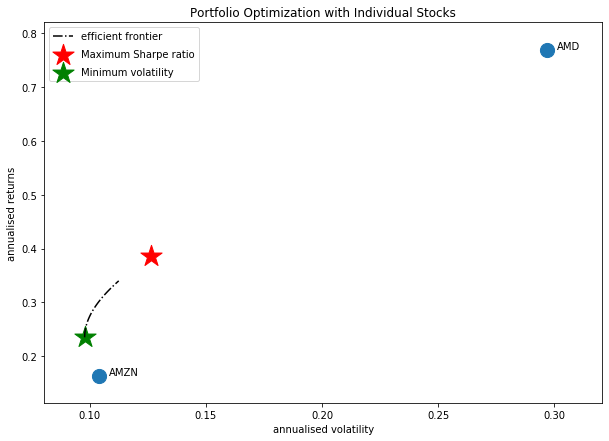

Companies listed in quarter 3 which is between 2018-10-01 and 2019-01-01
['AZO' 'NEM' 'CMCSA' 'BAC' 'BKNG' 'EQIX']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'CMCSA']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



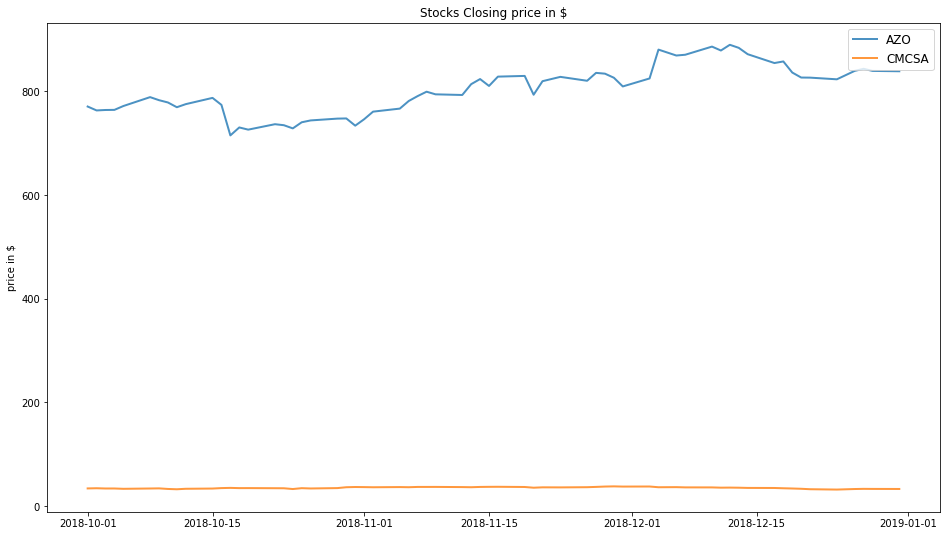

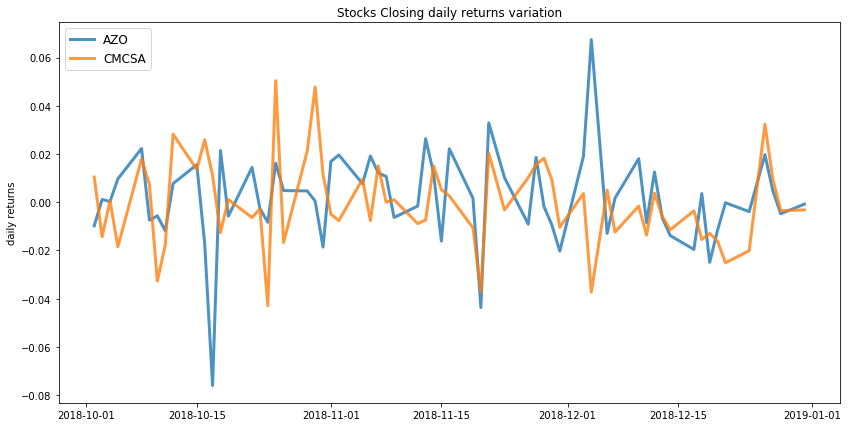

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.15


              AZO  CMCSA
allocation  100.0  0.0  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.03
Annualised Volatility: 0.11


              AZO  CMCSA
allocation  46.69  53.31


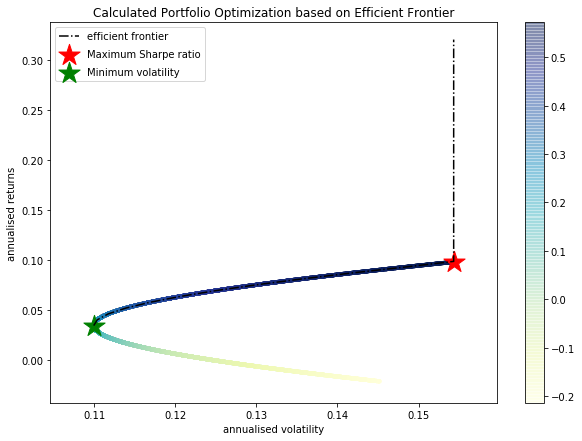

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.1 , annualised volatility: 0.15
CMCSA : annuaised return -0.02 , annualised volatility: 0.14
--------------------------------------------------------------------------------


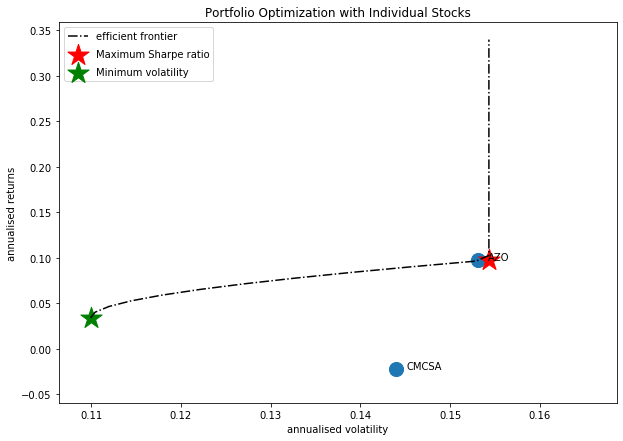

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'BAC']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



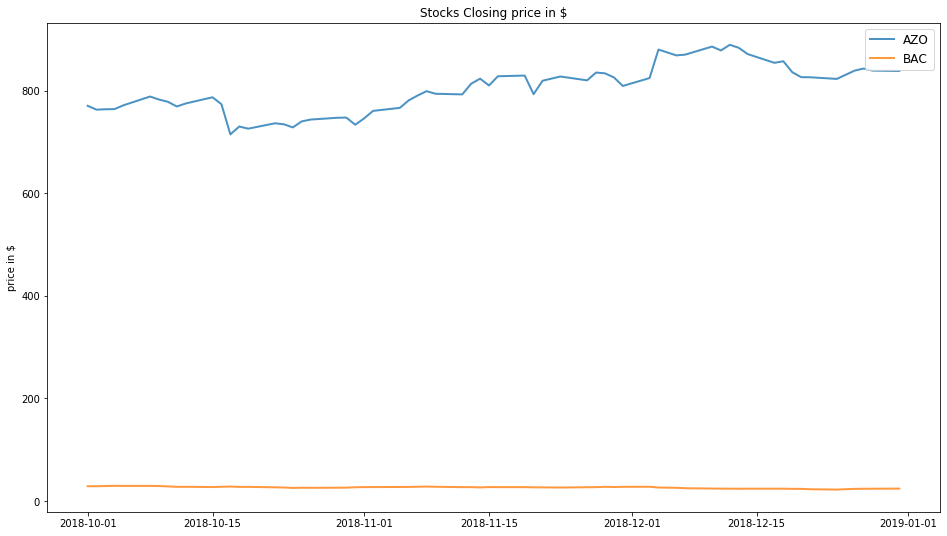

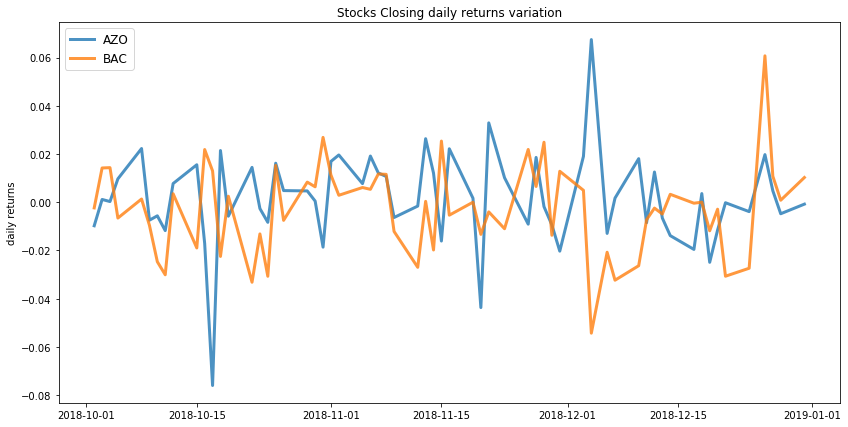

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.15


              AZO  BAC
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.04
Annualised Volatility: 0.1


              AZO    BAC
allocation  48.68  51.32


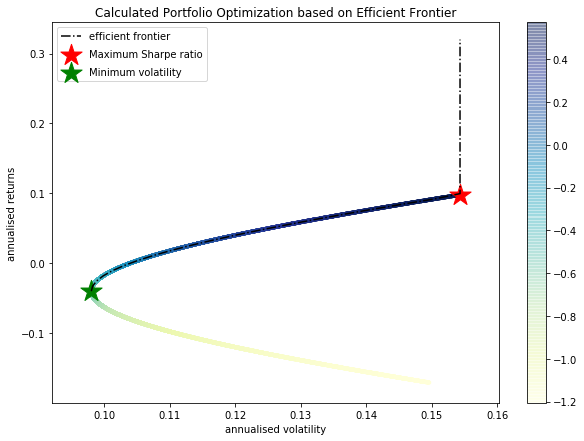

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.1 , annualised volatility: 0.15
BAC : annuaised return -0.17 , annualised volatility: 0.15
--------------------------------------------------------------------------------


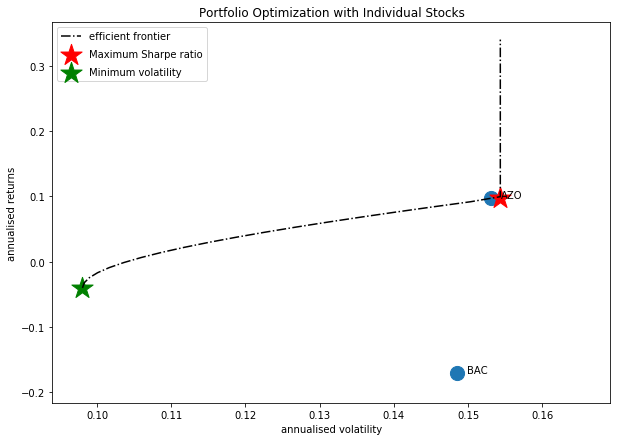

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'BKNG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



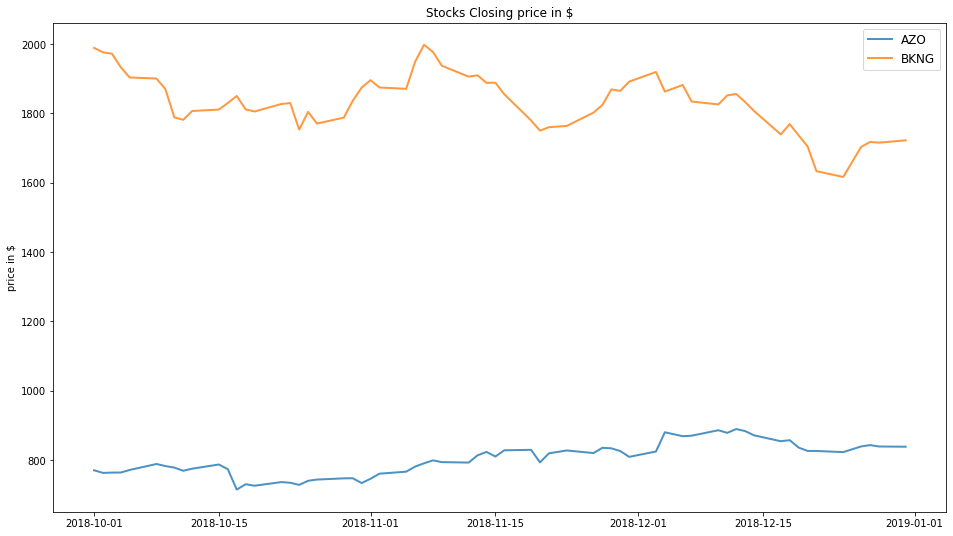

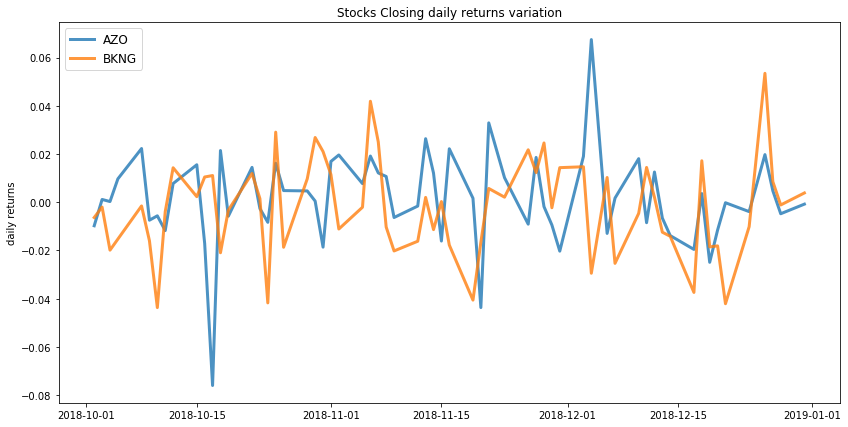

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.15


              AZO  BKNG
allocation  100.0  0.0 
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.01
Annualised Volatility: 0.12


              AZO   BKNG
allocation  51.82  48.18


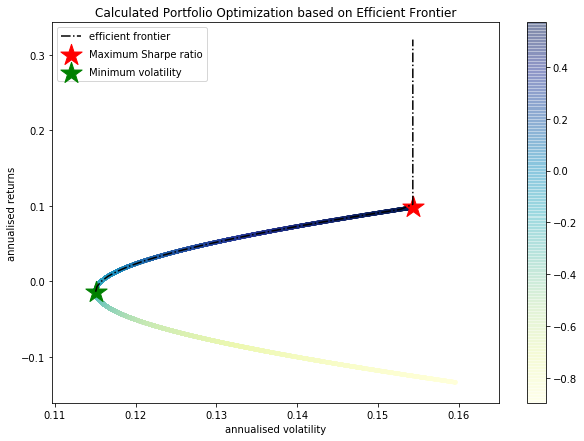

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.1 , annualised volatility: 0.15
BKNG : annuaised return -0.13 , annualised volatility: 0.16
--------------------------------------------------------------------------------


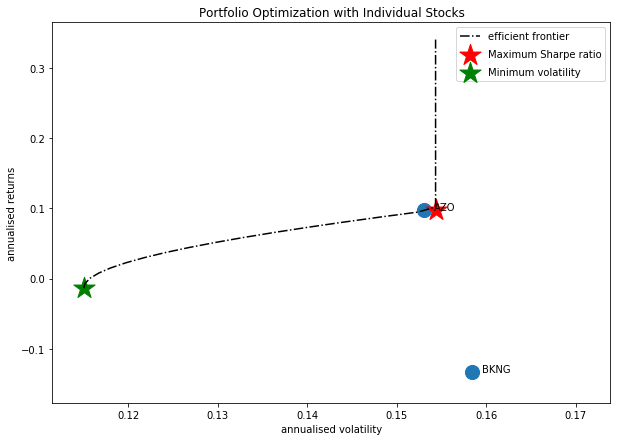

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'EQIX']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



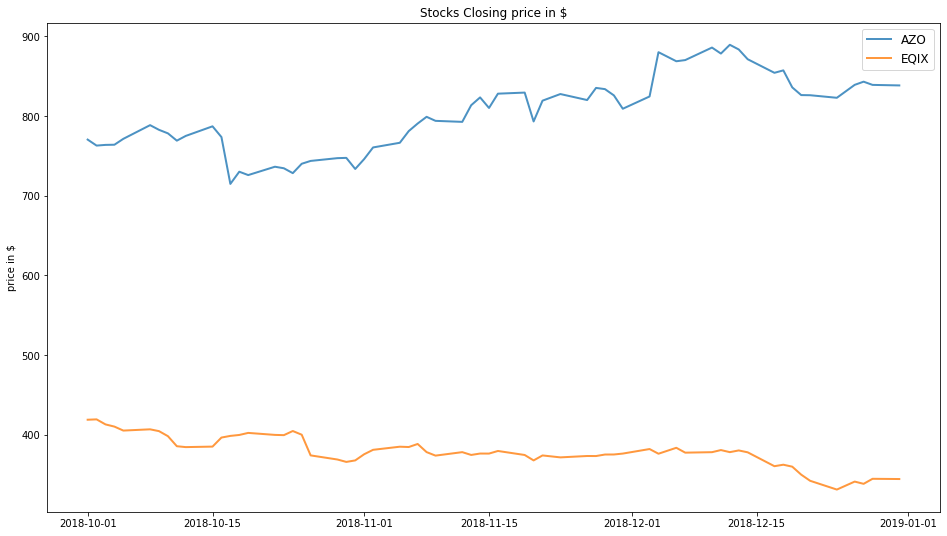

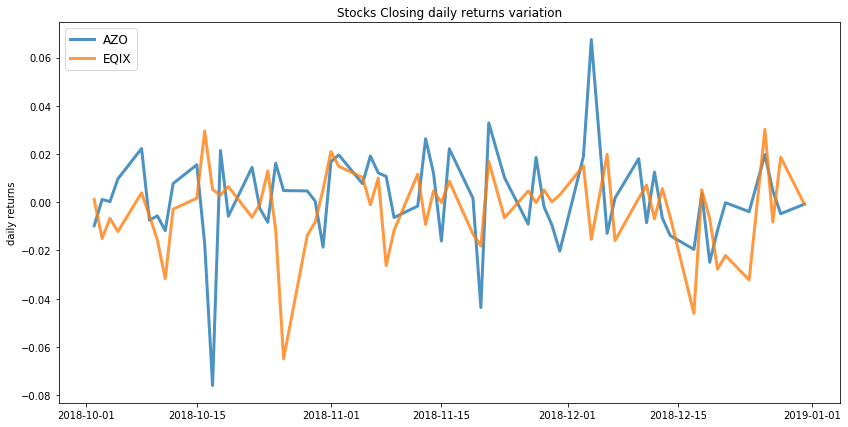

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.15


              AZO  EQIX
allocation  100.0  0.0 
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.07
Annualised Volatility: 0.1


              AZO   EQIX
allocation  41.69  58.31


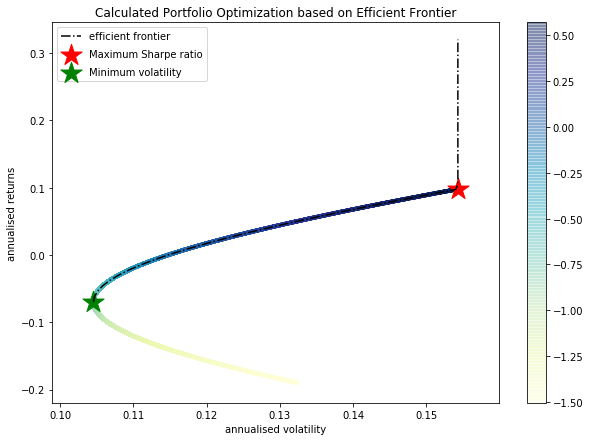

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.1 , annualised volatility: 0.15
EQIX : annuaised return -0.19 , annualised volatility: 0.13
--------------------------------------------------------------------------------


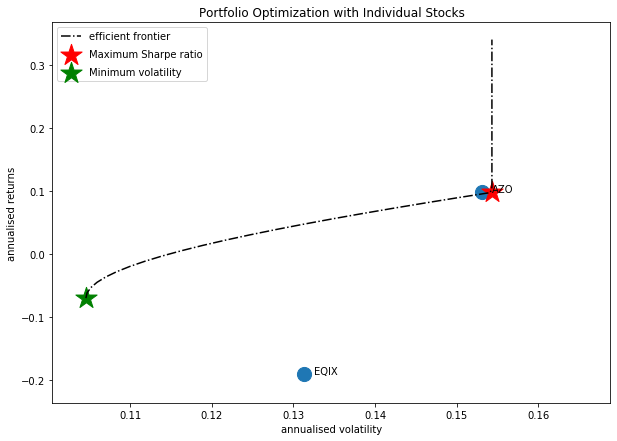

Companies listed in quarter 4 which is between 2019-01-01 and 2019-04-01
['AMZN' 'NEE' 'BKNG' 'AAPL' 'COTY' 'KMI' 'HP']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'AAPL']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



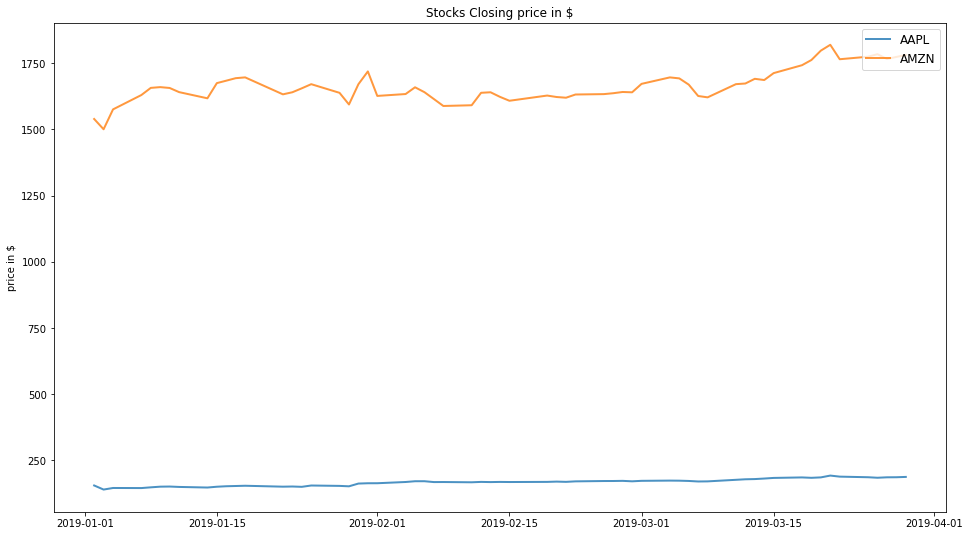

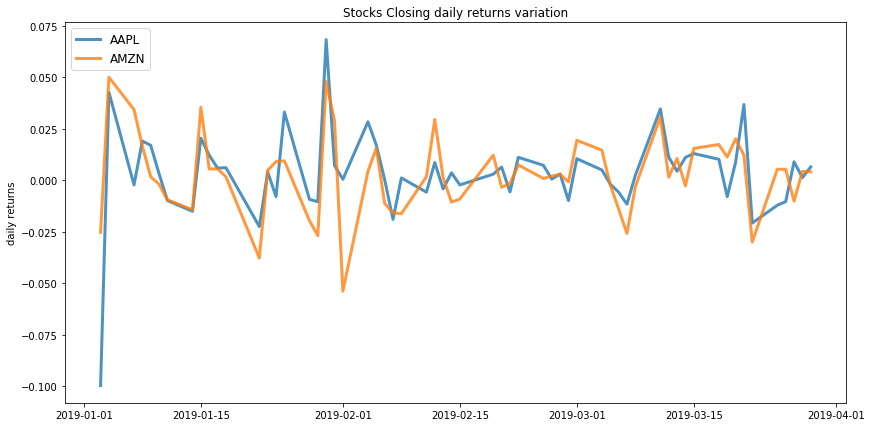

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.19
Annualised Volatility: 0.15


            AAPL  AMZN
allocation  68.0  32.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.18
Annualised Volatility: 0.14


             AAPL   AMZN
allocation  38.78  61.22


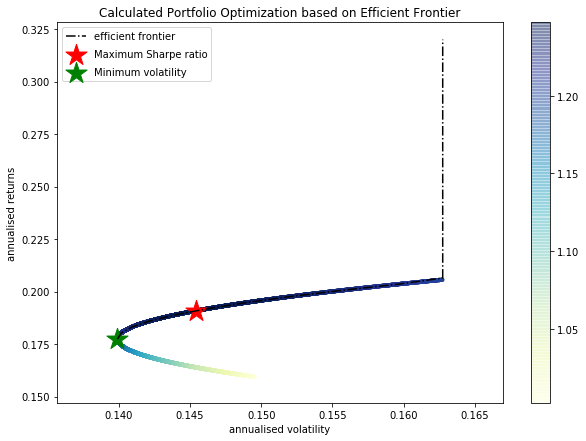

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.21 , annualised volatility: 0.16
AMZN : annuaised return 0.16 , annualised volatility: 0.15
--------------------------------------------------------------------------------


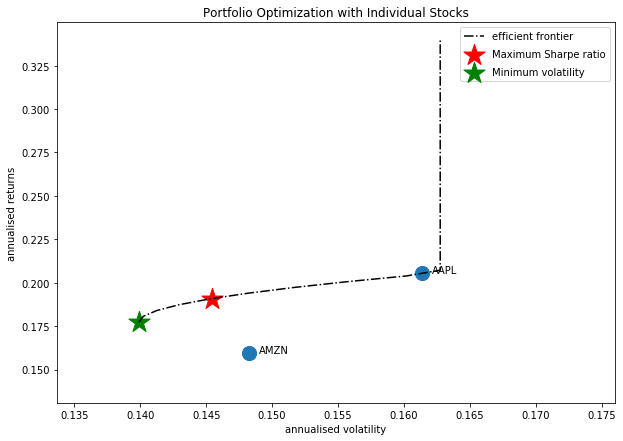

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'KMI']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



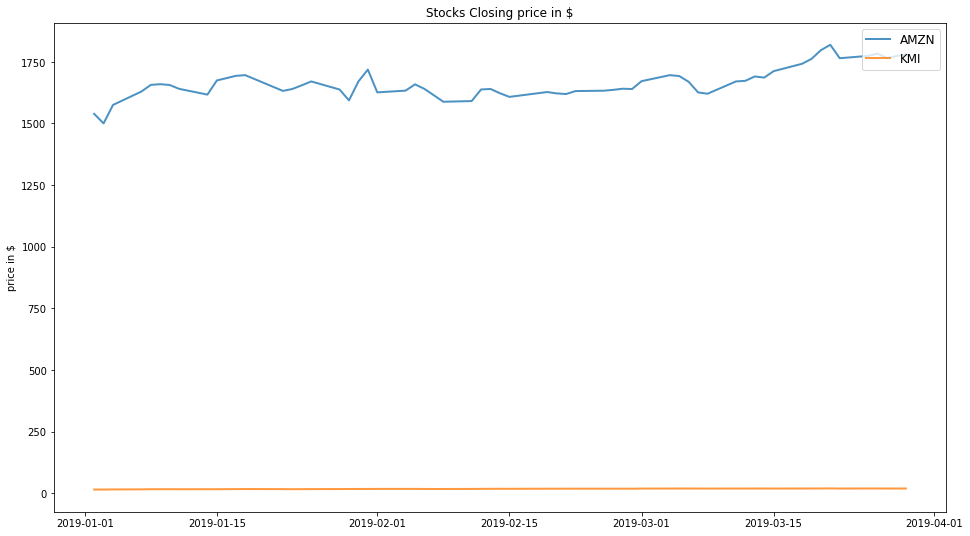

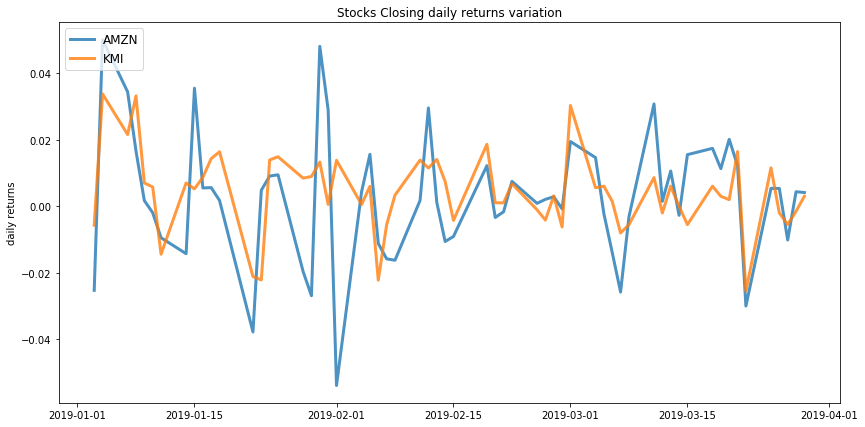

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.26
Annualised Volatility: 0.09


            AMZN    KMI
allocation  0.0   100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.25
Annualised Volatility: 0.09


             AMZN    KMI
allocation  10.89  89.11


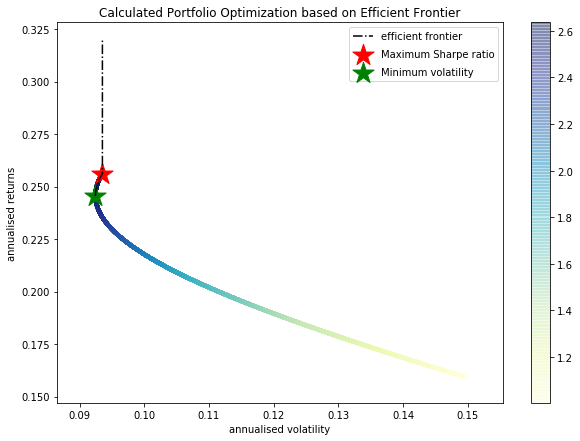

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.16 , annualised volatility: 0.15
KMI : annuaised return 0.26 , annualised volatility: 0.09
--------------------------------------------------------------------------------


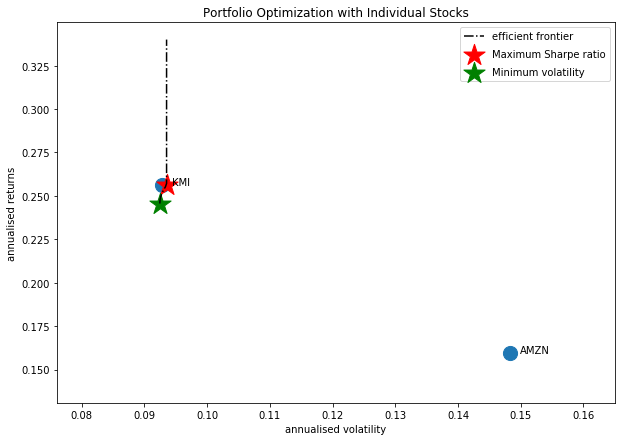

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'HP']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



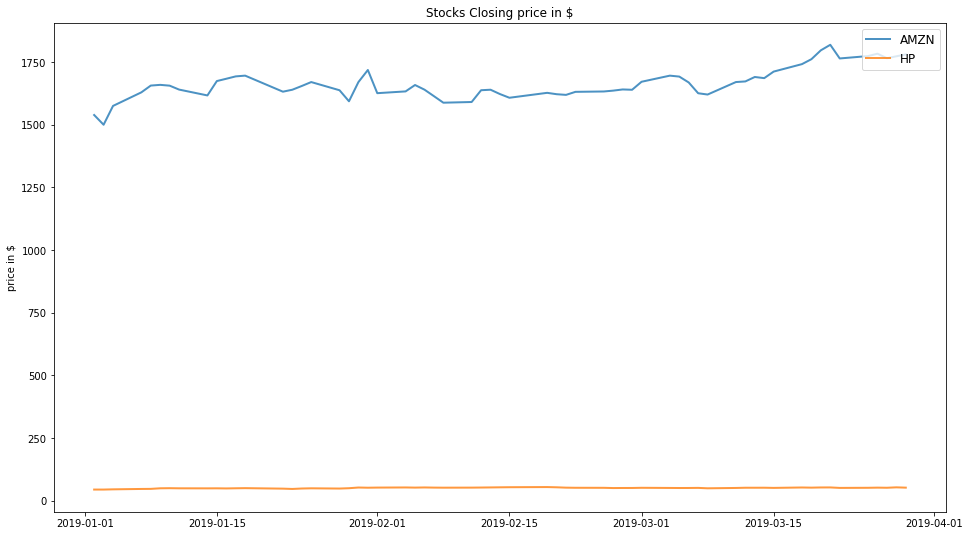

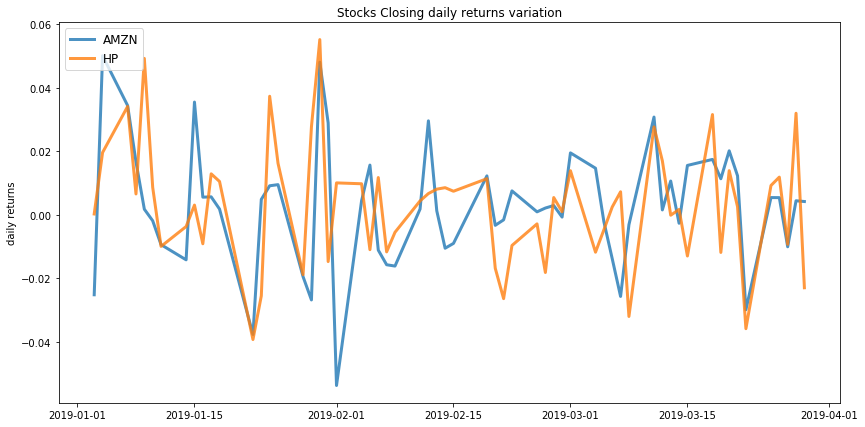

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 0.12


             AMZN     HP
allocation  46.15  53.85
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 0.12


            AMZN    HP
allocation  50.0  50.0


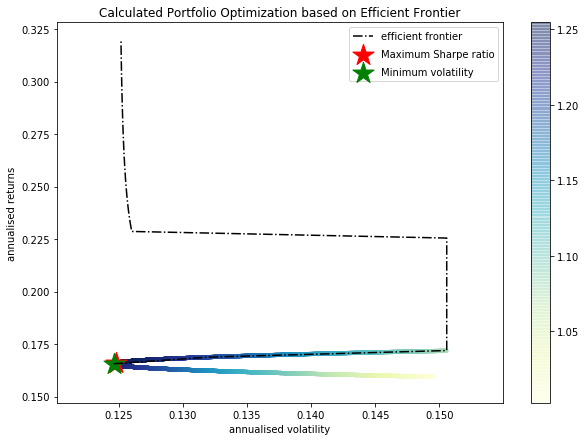

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.16 , annualised volatility: 0.15
HP : annuaised return 0.17 , annualised volatility: 0.15
--------------------------------------------------------------------------------


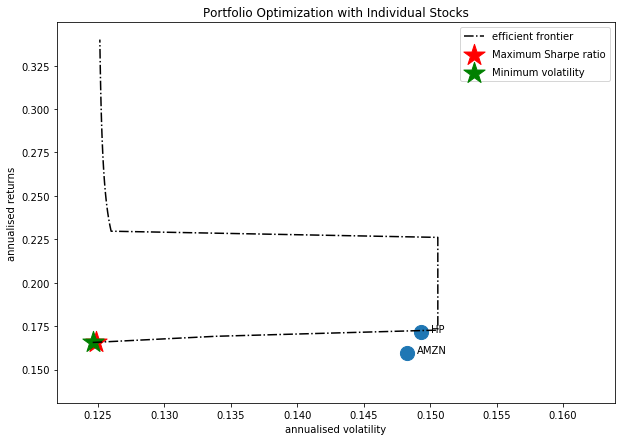

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['NEE', 'AAPL']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



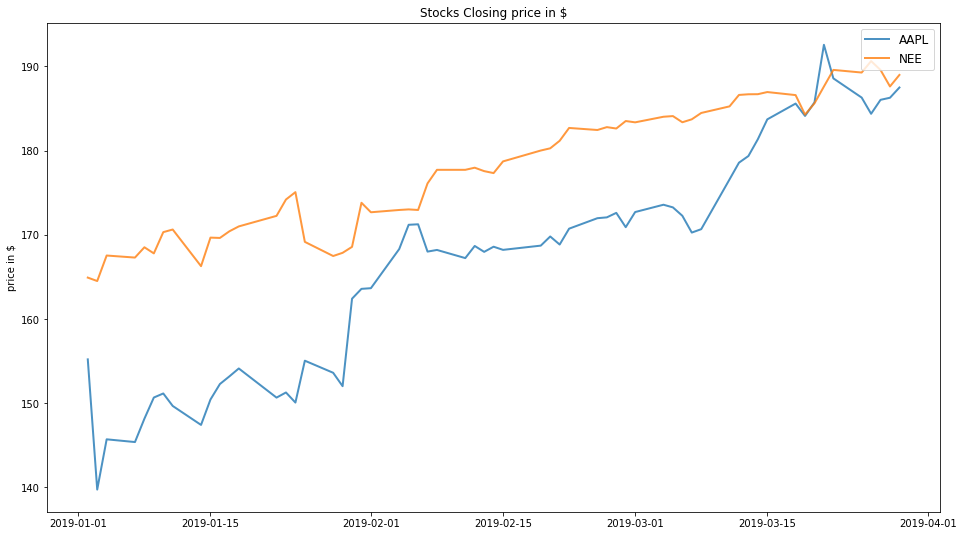

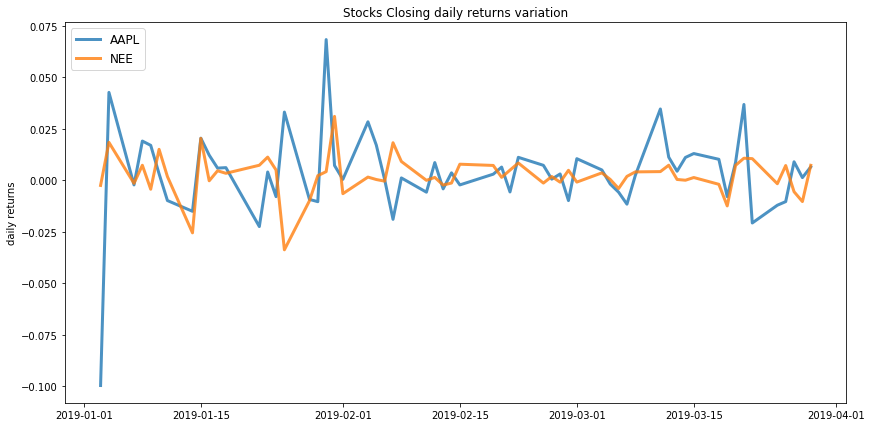

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.16
Annualised Volatility: 0.07


             AAPL    NEE
allocation  22.34  77.66
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.15
Annualised Volatility: 0.07


             AAPL    NEE
allocation  14.89  85.11


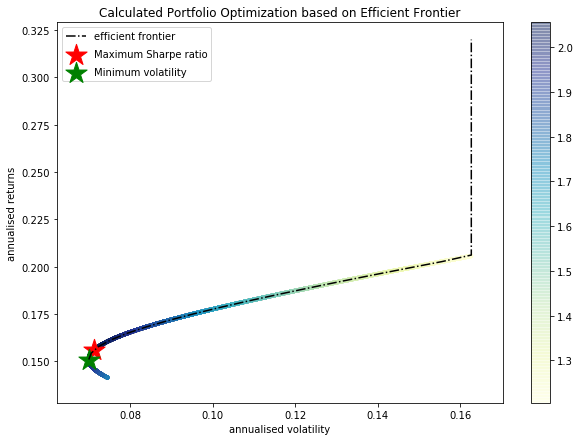

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.21 , annualised volatility: 0.16
NEE : annuaised return 0.14 , annualised volatility: 0.07
--------------------------------------------------------------------------------


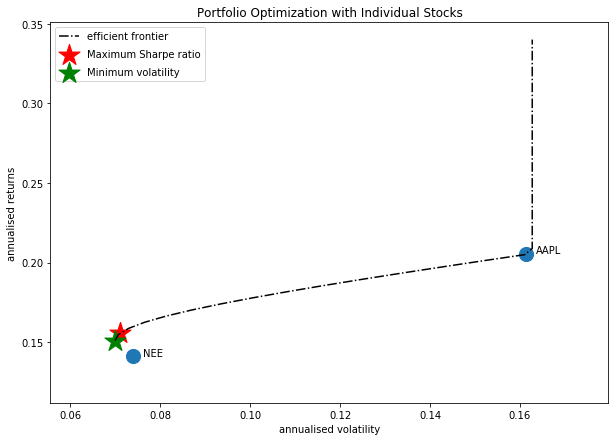

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['NEE', 'KMI']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



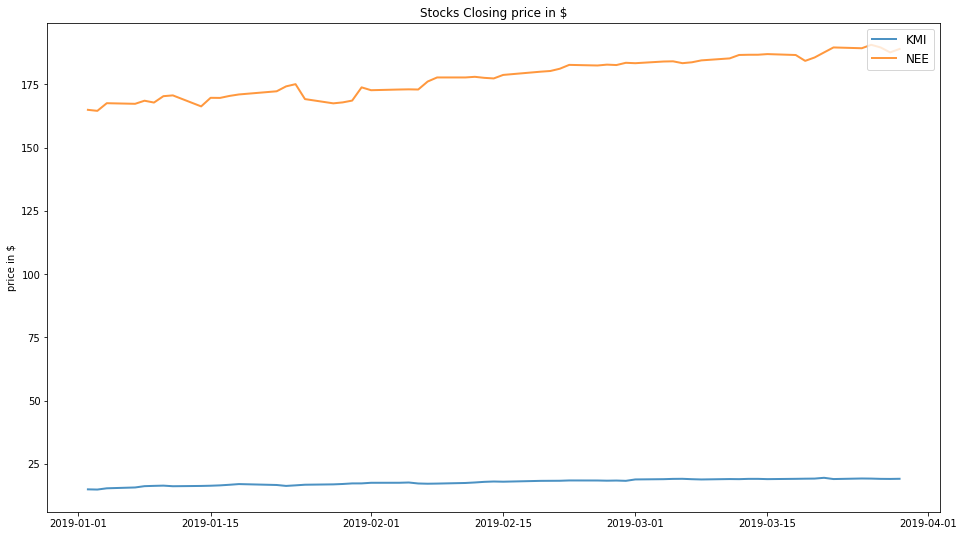

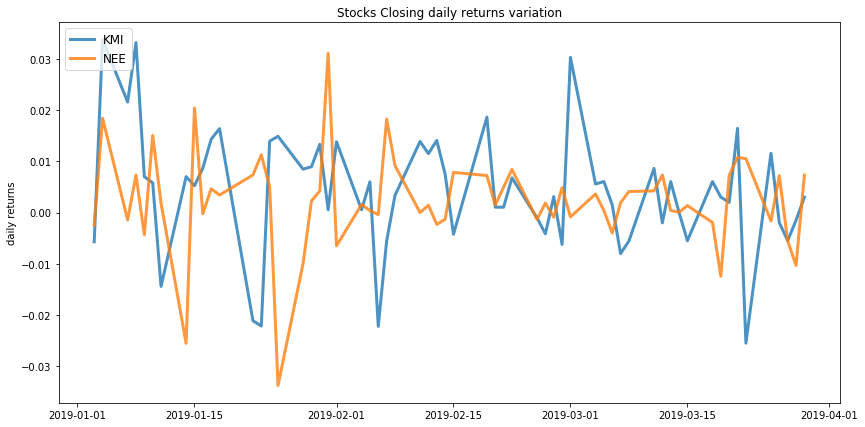

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.2
Annualised Volatility: 0.06


              KMI    NEE
allocation  52.52  47.48
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.19
Annualised Volatility: 0.06


              KMI    NEE
allocation  39.73  60.27


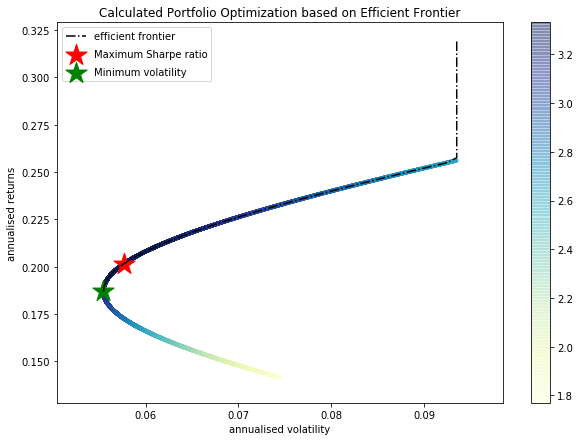

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

KMI : annuaised return 0.26 , annualised volatility: 0.09
NEE : annuaised return 0.14 , annualised volatility: 0.07
--------------------------------------------------------------------------------


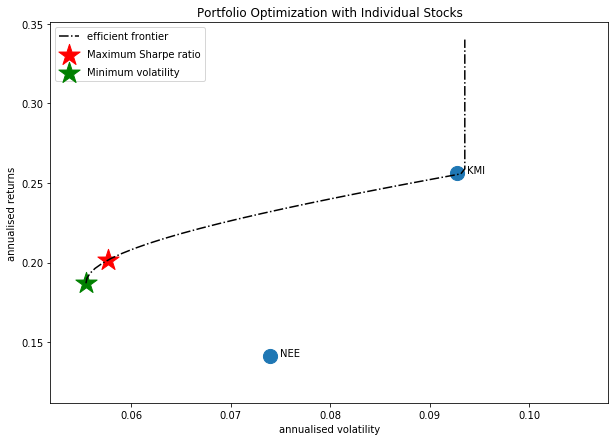

Companies listed in quarter 5 which is between 2019-04-01 and 2019-07-01
['AZO' 'AMZN' 'BKNG' 'BMY' 'APC' 'BA']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'AMZN', 'BKNG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



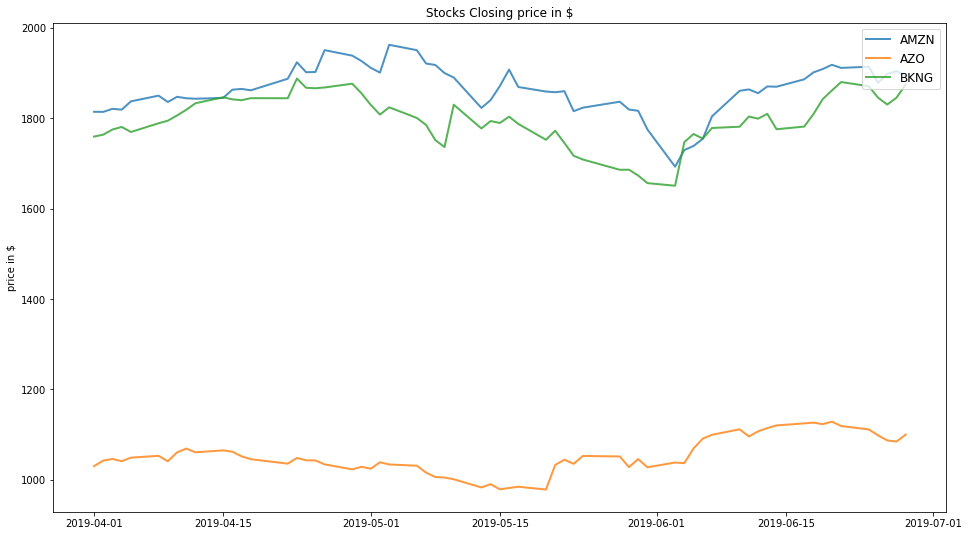

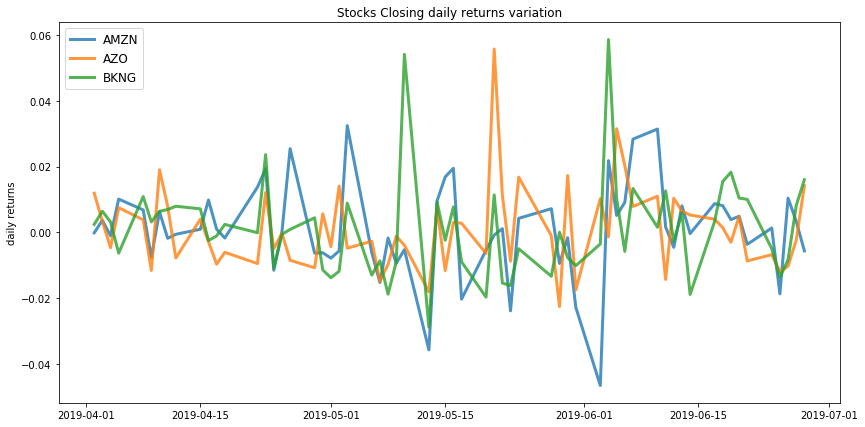

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.08


            AMZN    AZO   BKNG
allocation  8.1   55.49  36.42
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.08


             AMZN    AZO   BKNG
allocation  27.77  47.15  25.08


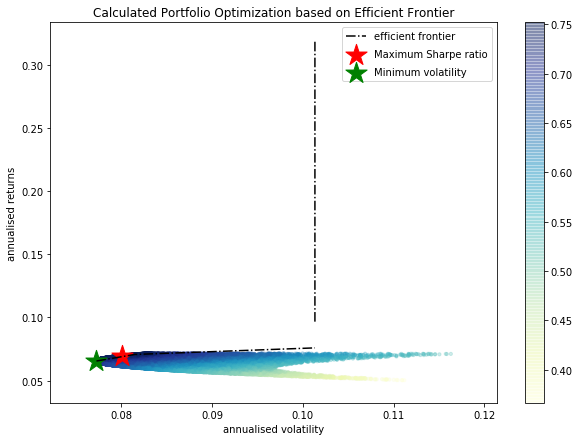

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.05 , annualised volatility: 0.11
AZO : annuaised return 0.07 , annualised volatility: 0.1
BKNG : annuaised return 0.07 , annualised volatility: 0.12
--------------------------------------------------------------------------------


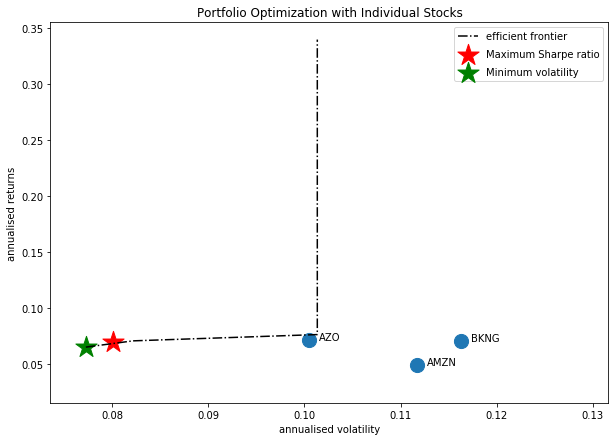

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'BA']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



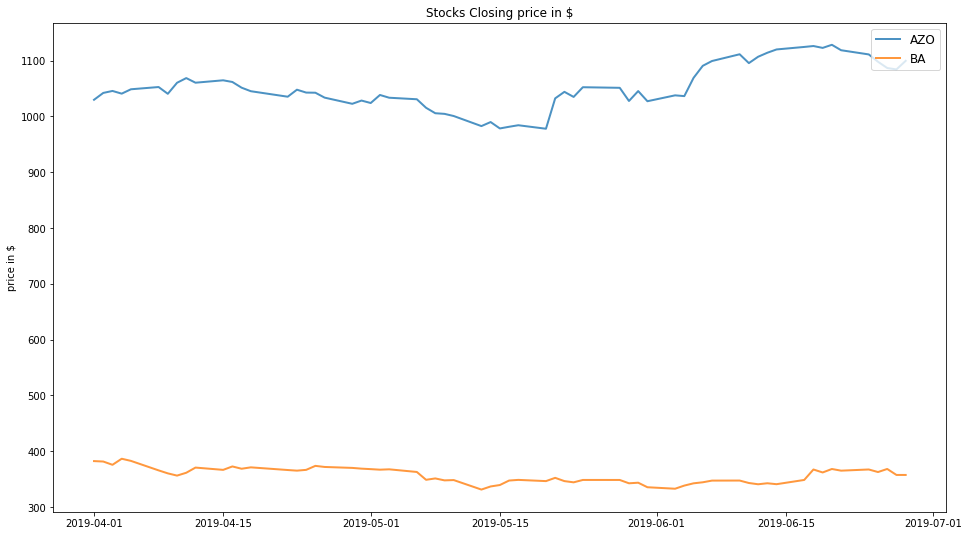

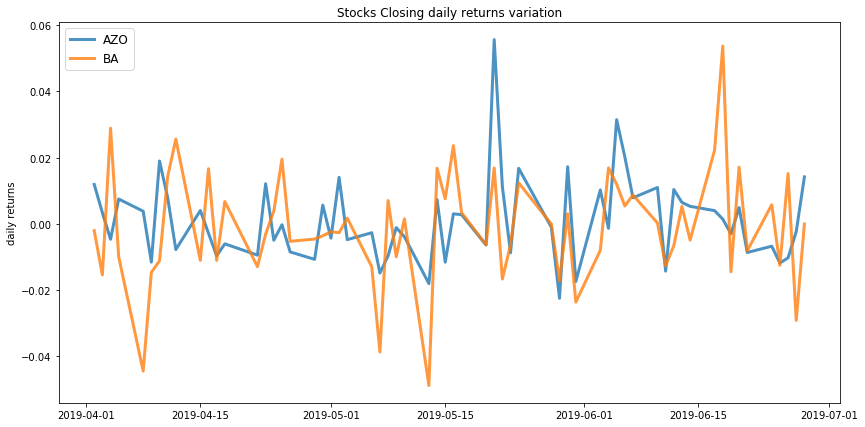

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.1


              AZO   BA
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.03
Annualised Volatility: 0.09


              AZO     BA
allocation  70.61  29.39


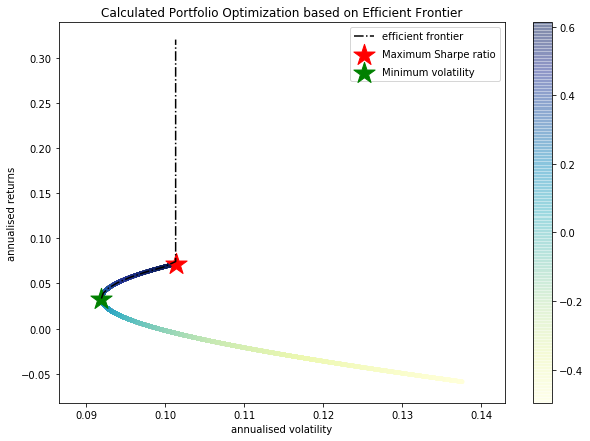

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.07 , annualised volatility: 0.1
BA : annuaised return -0.06 , annualised volatility: 0.14
--------------------------------------------------------------------------------


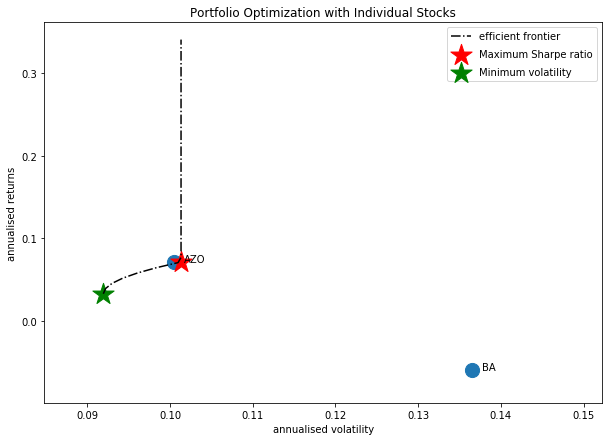

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'BMY']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



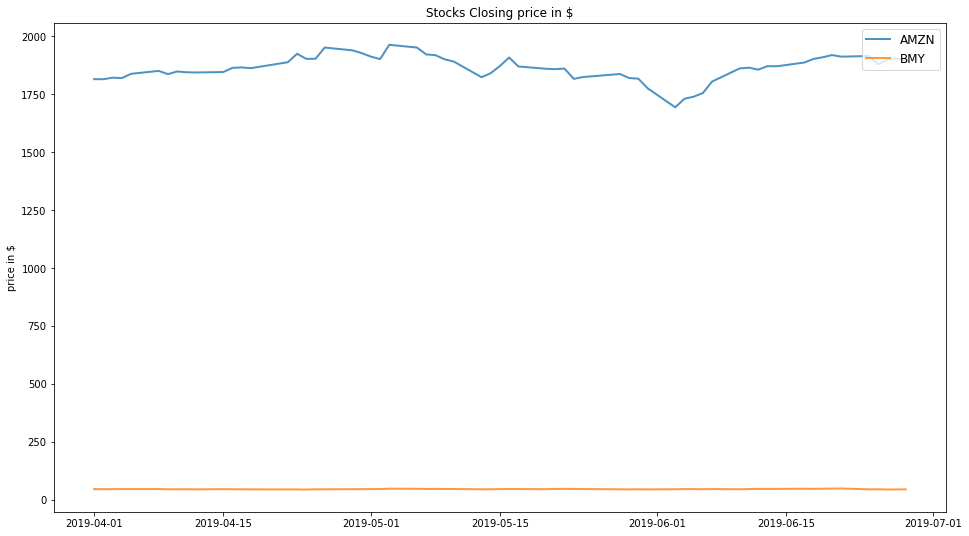

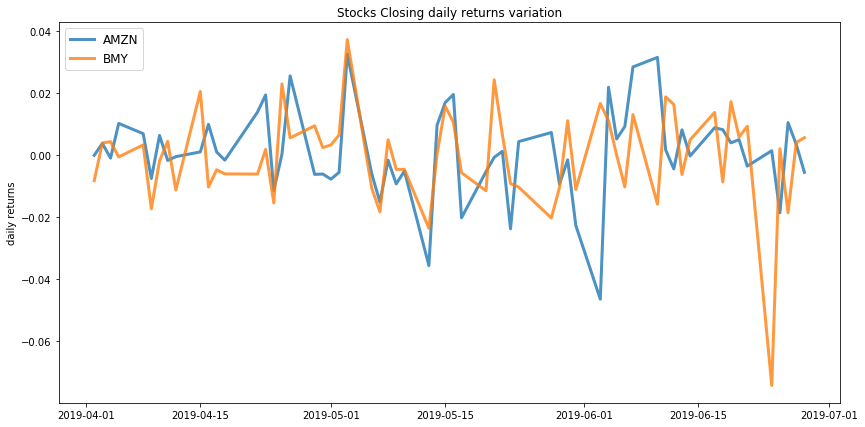

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.05
Annualised Volatility: 0.11


             AMZN  BMY
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.02
Annualised Volatility: 0.09


             AMZN    BMY
allocation  55.84  44.16


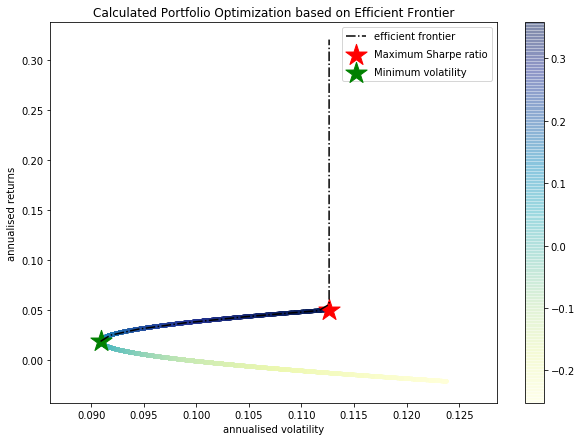

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.05 , annualised volatility: 0.11
BMY : annuaised return -0.02 , annualised volatility: 0.12
--------------------------------------------------------------------------------


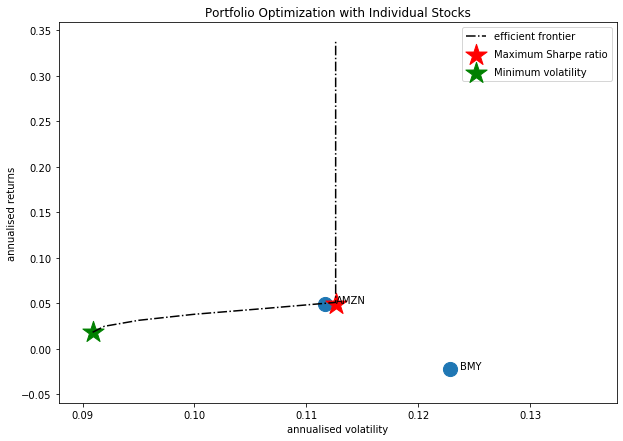

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'APC']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



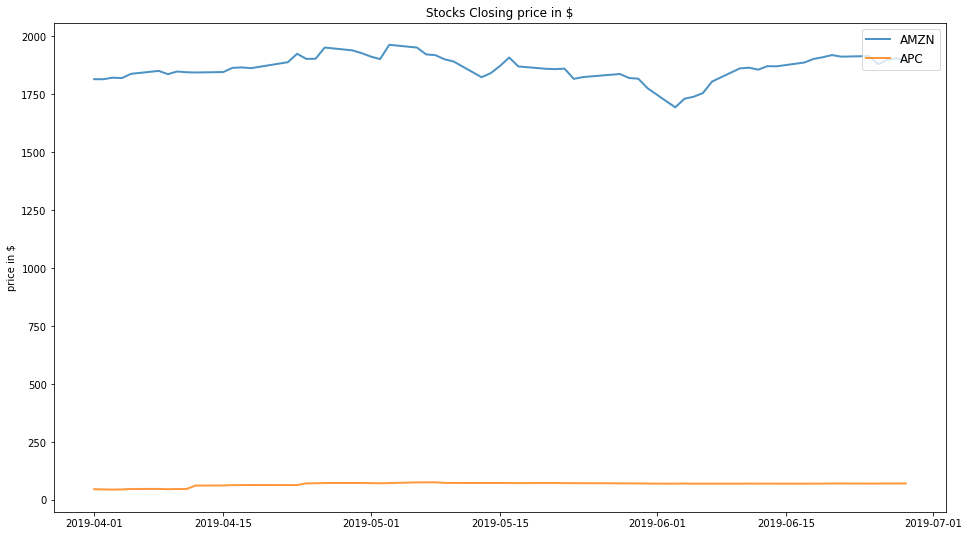

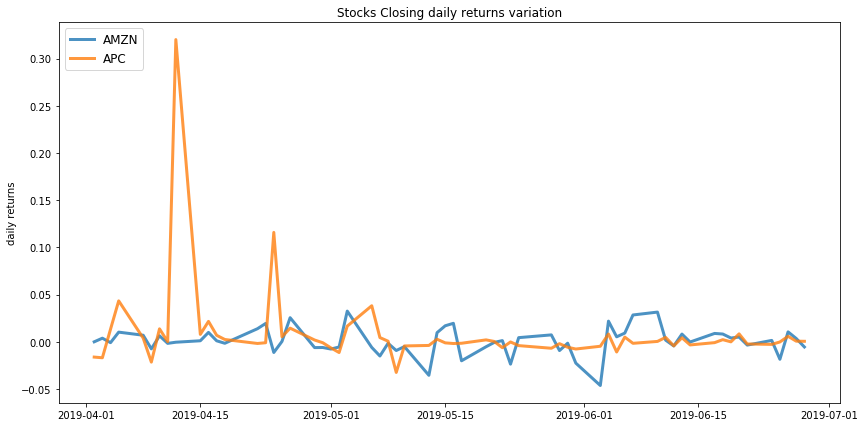

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.3
Annualised Volatility: 0.21


             AMZN    APC
allocation  43.06  56.94
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.09
Annualised Volatility: 0.11


             AMZN   APC
allocation  91.24  8.76


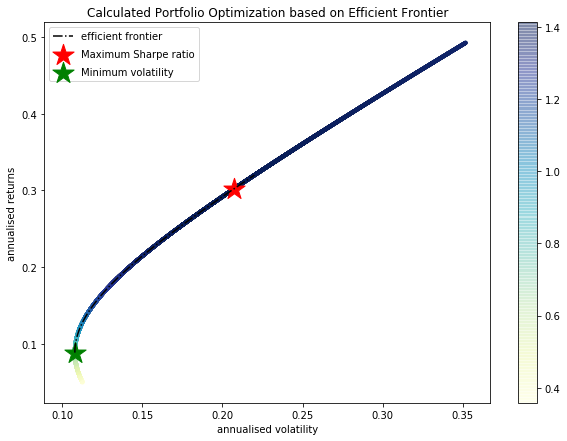

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.05 , annualised volatility: 0.11
APC : annuaised return 0.49 , annualised volatility: 0.35
--------------------------------------------------------------------------------


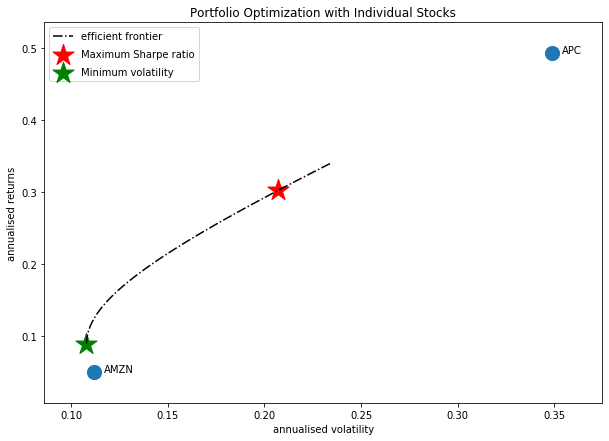

Companies listed in quarter 6 which is between 2019-07-01 and 2019-10-01
['AJG' 'BKNG' 'NEE' 'EMR' 'MLM' 'DHI' 'BLK']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AJG', 'DHI']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



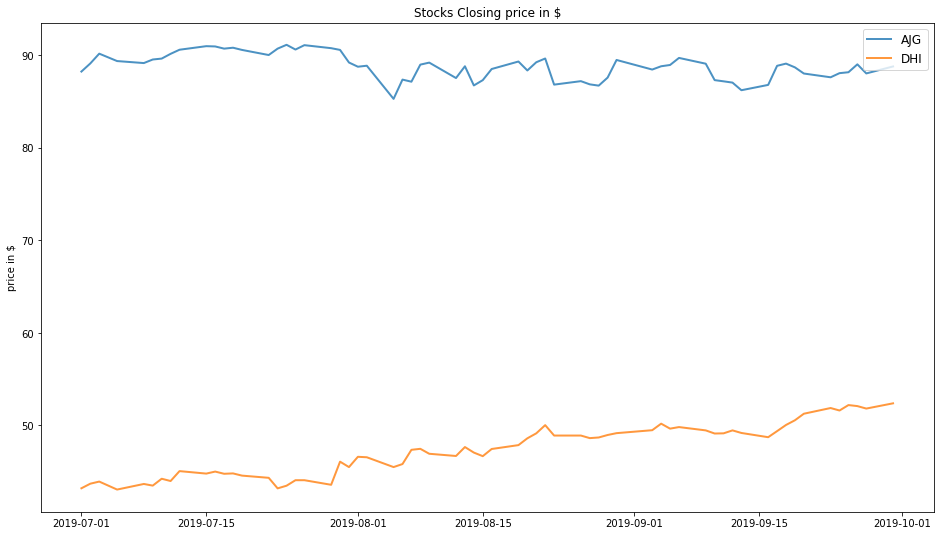

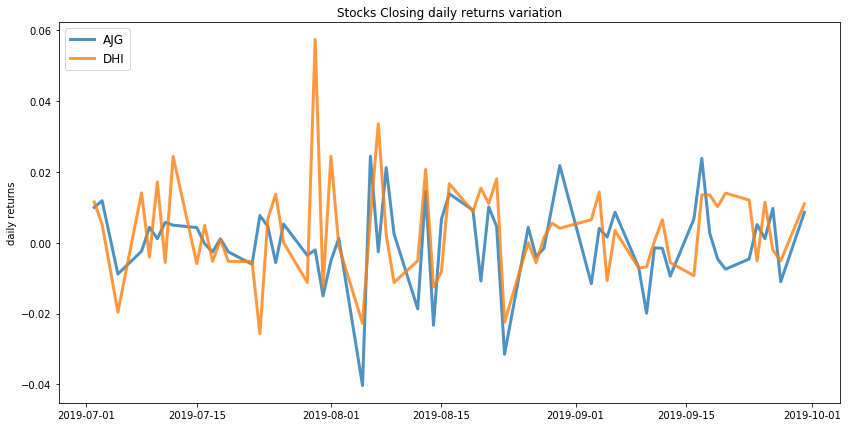

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.2
Annualised Volatility: 0.11


            AJG    DHI
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.08
Annualised Volatility: 0.08


              AJG    DHI
allocation  62.76  37.24


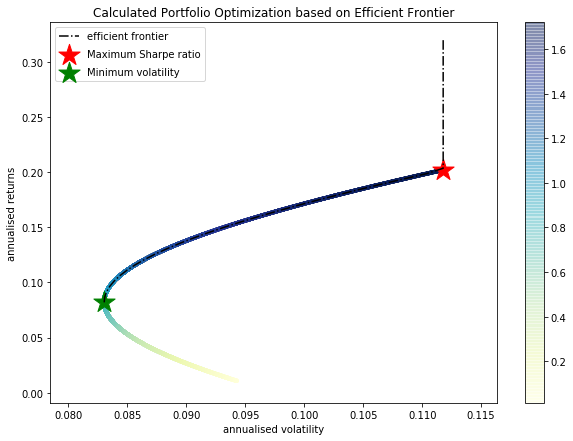

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AJG : annuaised return 0.01 , annualised volatility: 0.09
DHI : annuaised return 0.2 , annualised volatility: 0.11
--------------------------------------------------------------------------------


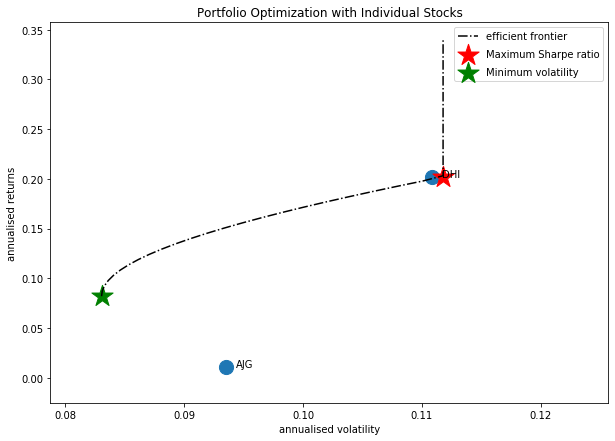

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'EMR']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



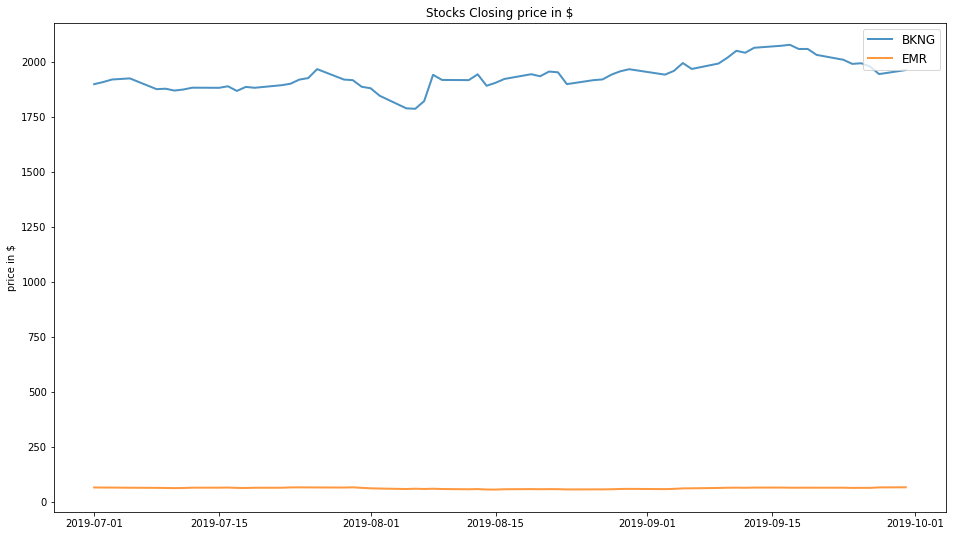

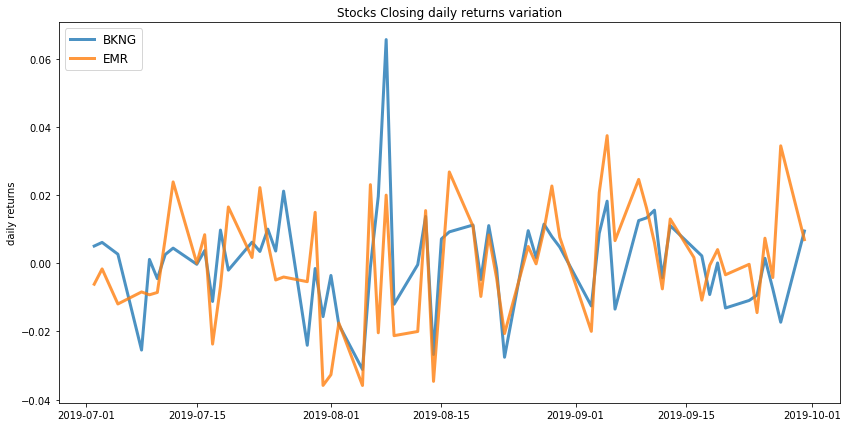

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.04
Annualised Volatility: 0.12


             BKNG  EMR
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.03
Annualised Volatility: 0.11


             BKNG    EMR
allocation  64.36  35.64


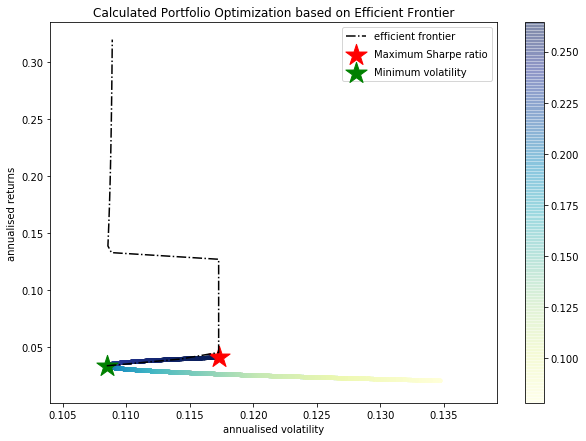

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BKNG : annuaised return 0.04 , annualised volatility: 0.12
EMR : annuaised return 0.02 , annualised volatility: 0.13
--------------------------------------------------------------------------------


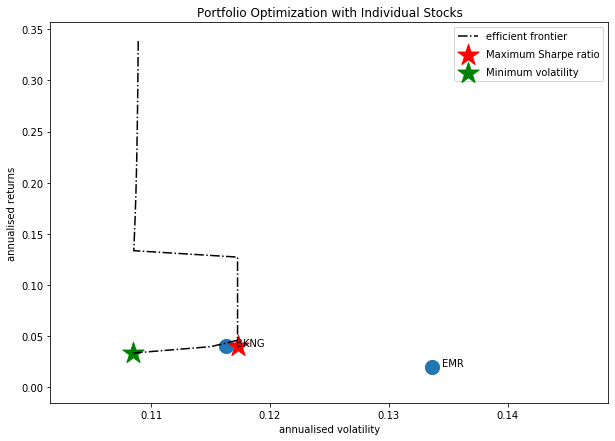

Companies listed in quarter 7 which is between 2019-10-01 and 2020-01-01
['EFX' 'BKNG' 'BLK' 'BIIB' 'AOS' 'HP' 'AMD' 'BA']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EFX', 'BLK', 'BIIB']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



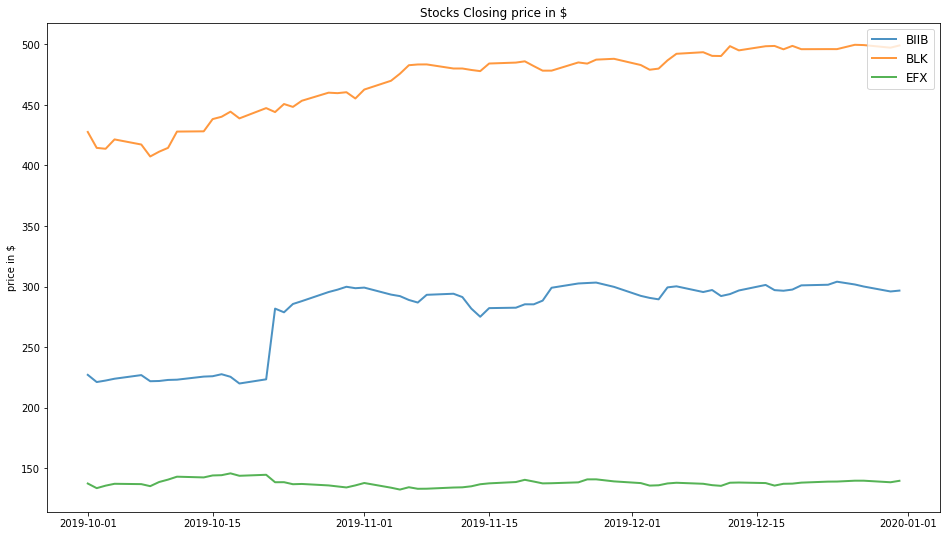

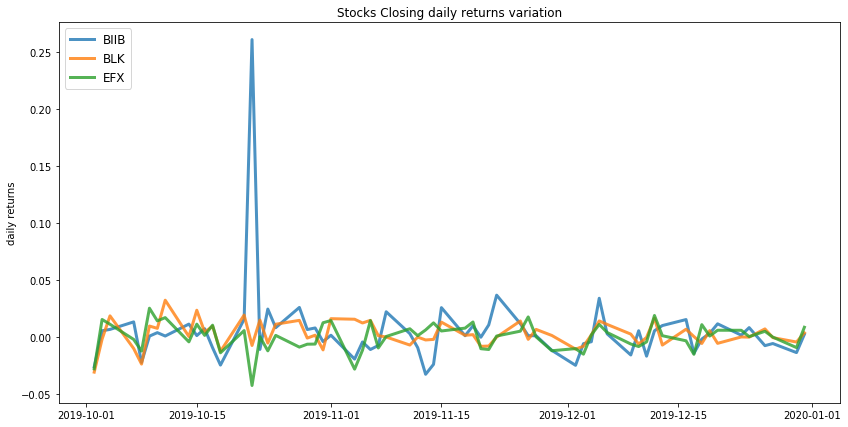

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.18
Annualised Volatility: 0.09


             BIIB    BLK  EFX
allocation  15.11  84.89  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.11
Annualised Volatility: 0.07


             BIIB    BLK    EFX
allocation  10.81  43.89  45.31


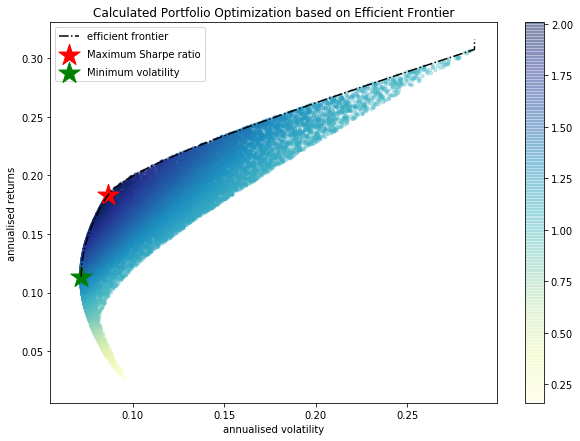

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

BIIB : annuaised return 0.31 , annualised volatility: 0.28
BLK : annuaised return 0.16 , annualised volatility: 0.09
EFX : annuaised return 0.02 , annualised volatility: 0.1
--------------------------------------------------------------------------------


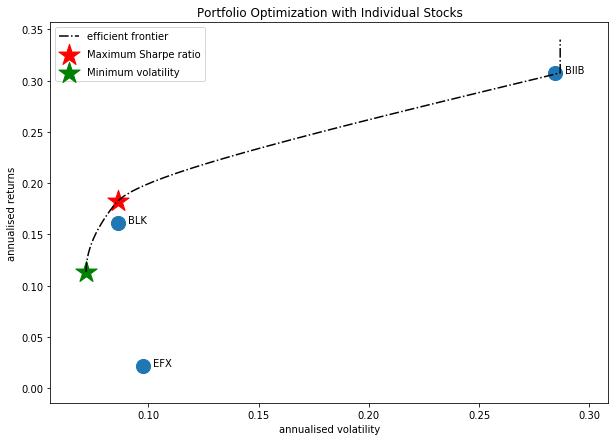

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'BIIB', 'AOS']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



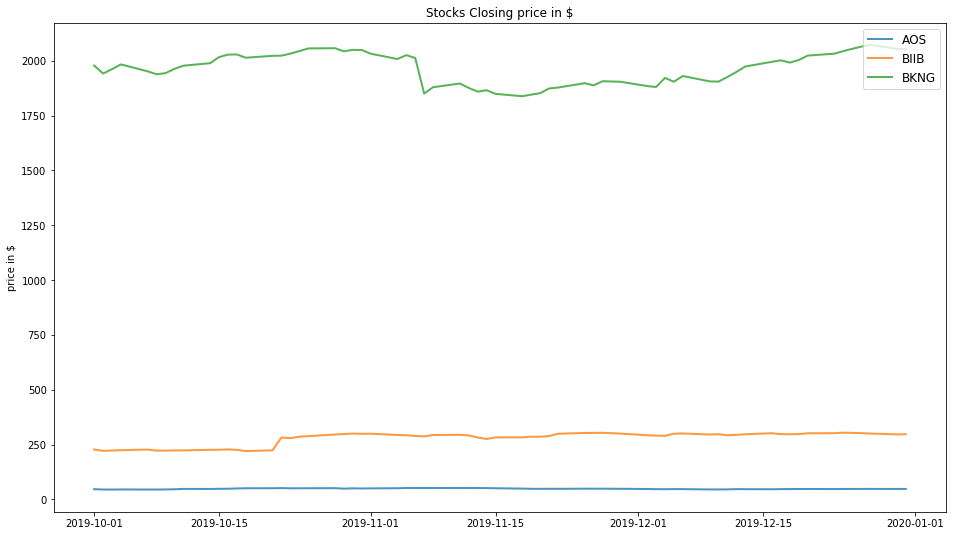

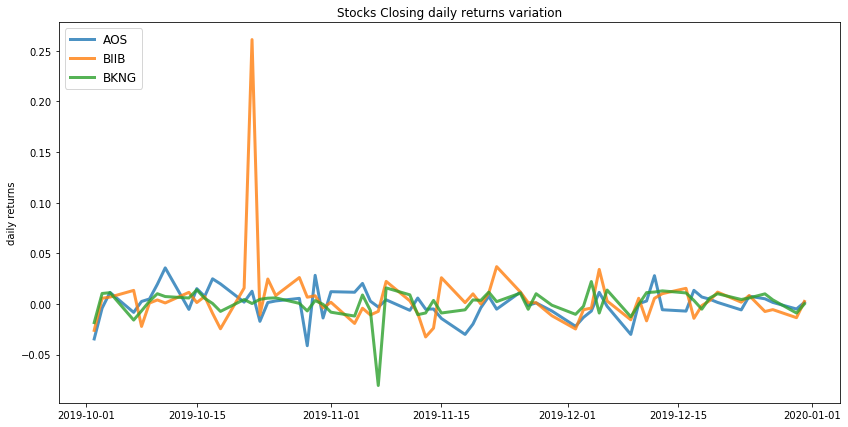

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.21
Annualised Volatility: 0.19


            AOS   BIIB   BKNG
allocation  0.0  64.36  35.64
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.05
Annualised Volatility: 0.09


              AOS  BIIB   BKNG
allocation  42.41  4.71  52.88


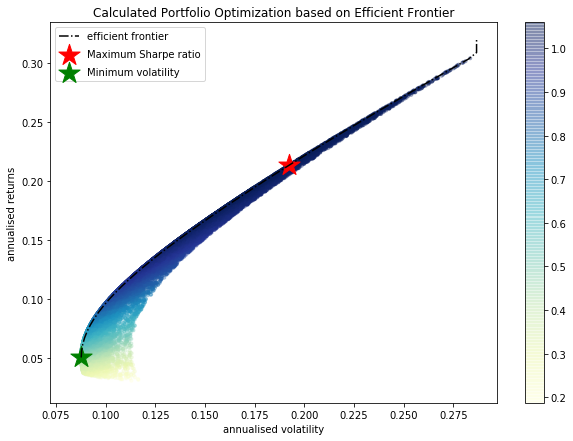

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AOS : annuaised return 0.03 , annualised volatility: 0.12
BIIB : annuaised return 0.31 , annualised volatility: 0.28
BKNG : annuaised return 0.04 , annualised volatility: 0.11
--------------------------------------------------------------------------------


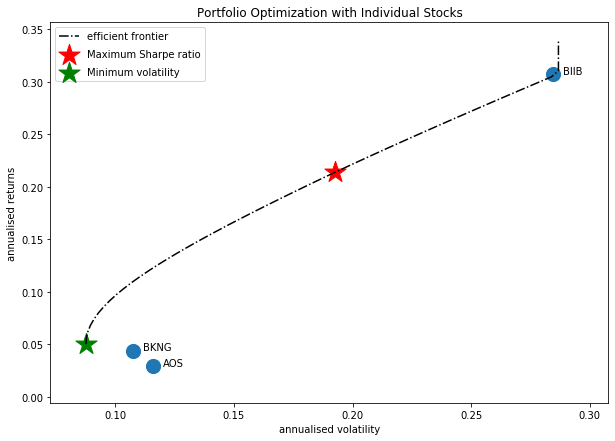

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'AMD']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



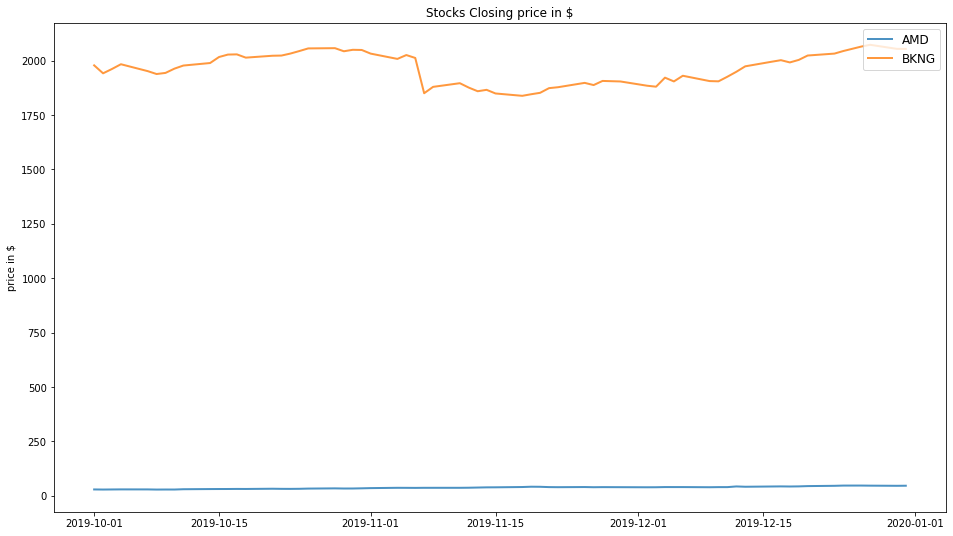

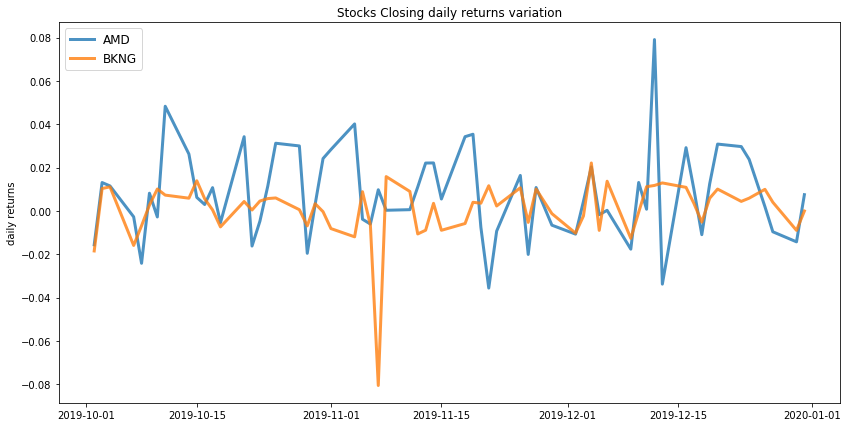

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.49
Annualised Volatility: 0.16


              AMD  BKNG
allocation  100.0  0.0 
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.17
Annualised Volatility: 0.1


              AMD   BKNG
allocation  27.92  72.08


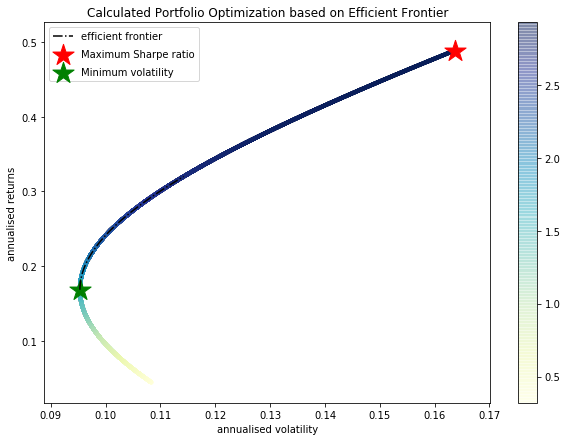

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMD : annuaised return 0.49 , annualised volatility: 0.16
BKNG : annuaised return 0.04 , annualised volatility: 0.11
--------------------------------------------------------------------------------


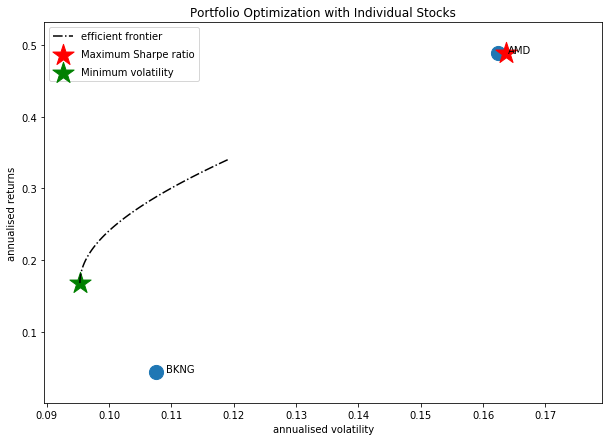

Companies listed in quarter 8 which is between 2020-01-01 and 2020-04-01
['AMZN' 'BIIB' 'EQIX' 'CTXS' 'AOS' 'ADBE' 'BA']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'AOS']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



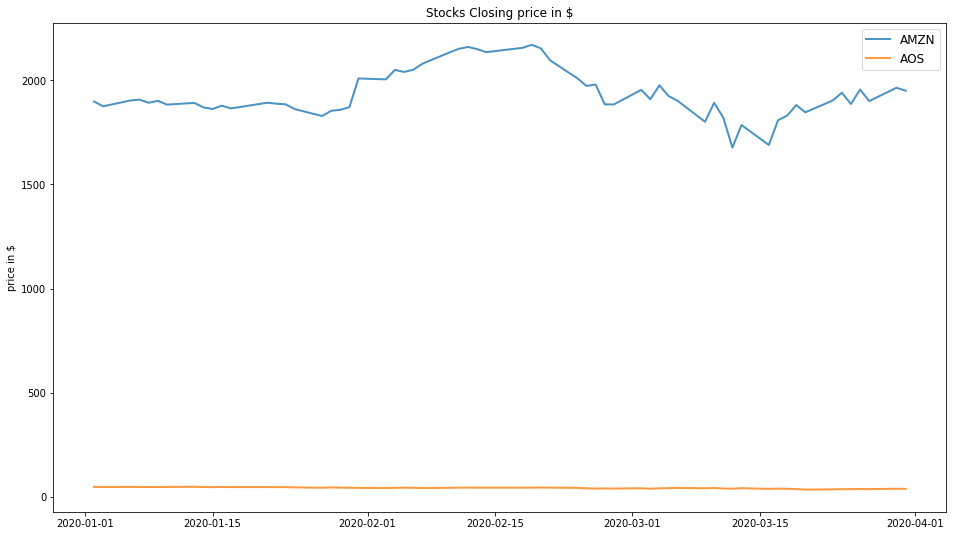

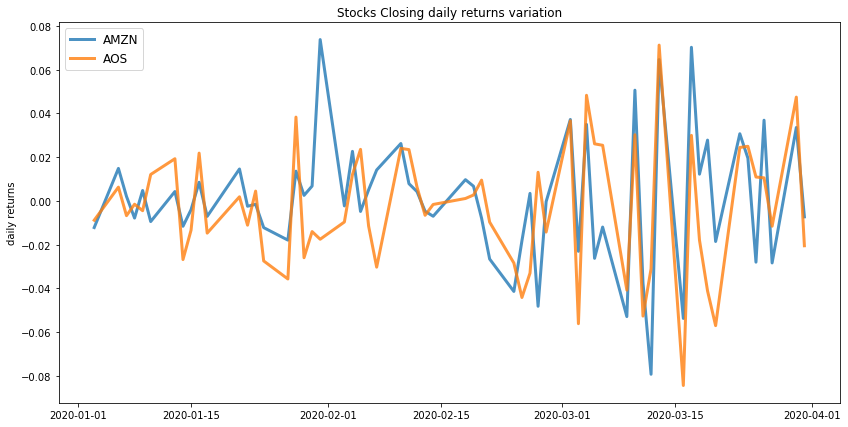

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.05
Annualised Volatility: 0.23


             AMZN  AOS
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.07
Annualised Volatility: 0.2


             AMZN    AOS
allocation  51.38  48.62


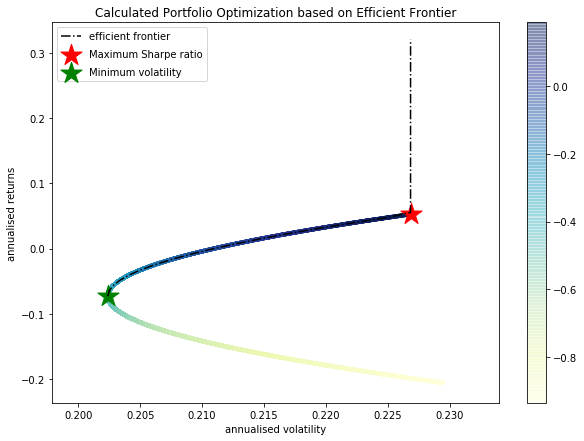

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.05 , annualised volatility: 0.22
AOS : annuaised return -0.21 , annualised volatility: 0.23
--------------------------------------------------------------------------------


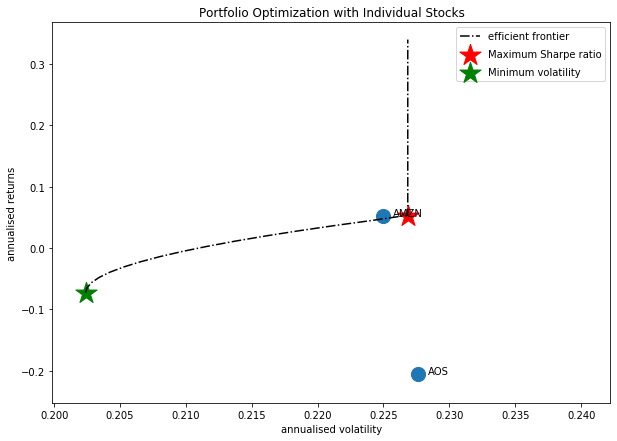

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BIIB', 'EQIX', 'AOS']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



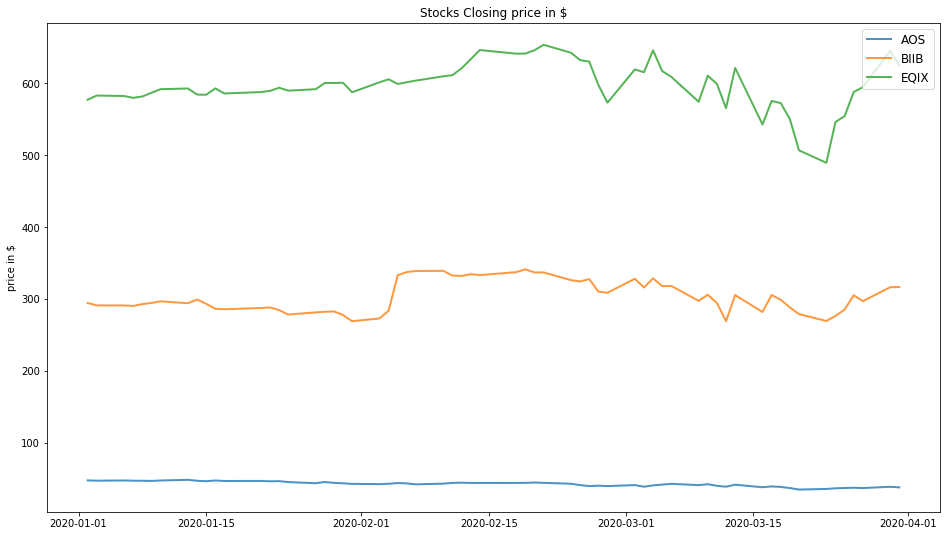

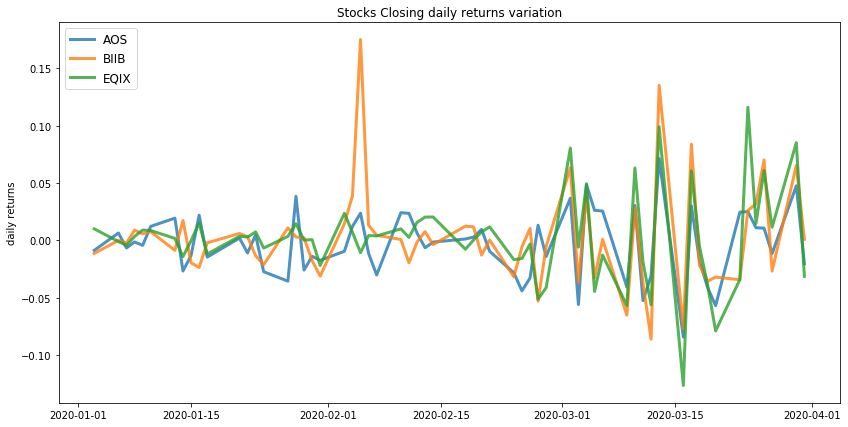

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.3


            AOS   BIIB   EQIX
allocation  0.0  37.45  62.55
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.17
Annualised Volatility: 0.23


              AOS  BIIB  EQIX
allocation  89.32  7.82  2.86


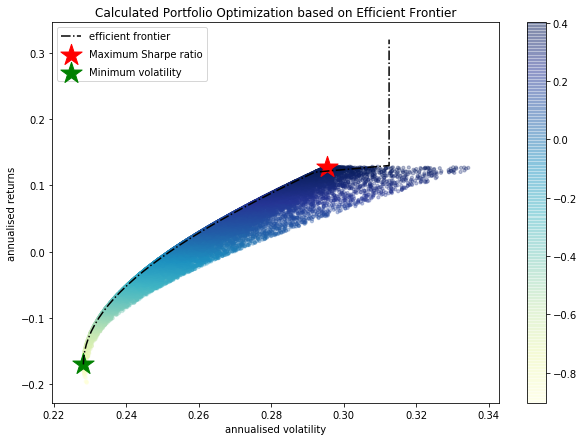

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AOS : annuaised return -0.21 , annualised volatility: 0.23
BIIB : annuaised return 0.13 , annualised volatility: 0.33
EQIX : annuaised return 0.13 , annualised volatility: 0.31
--------------------------------------------------------------------------------


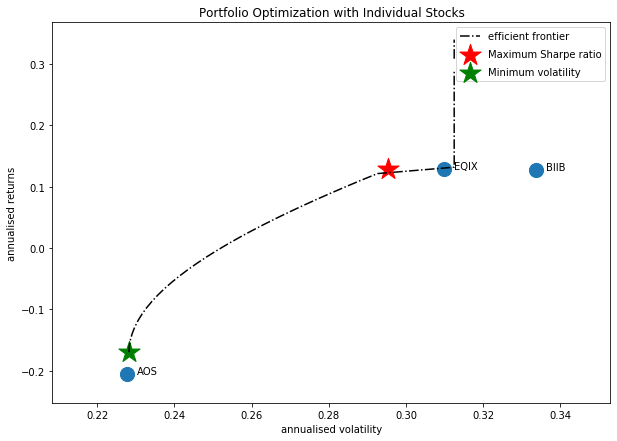

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BIIB', 'ADBE']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



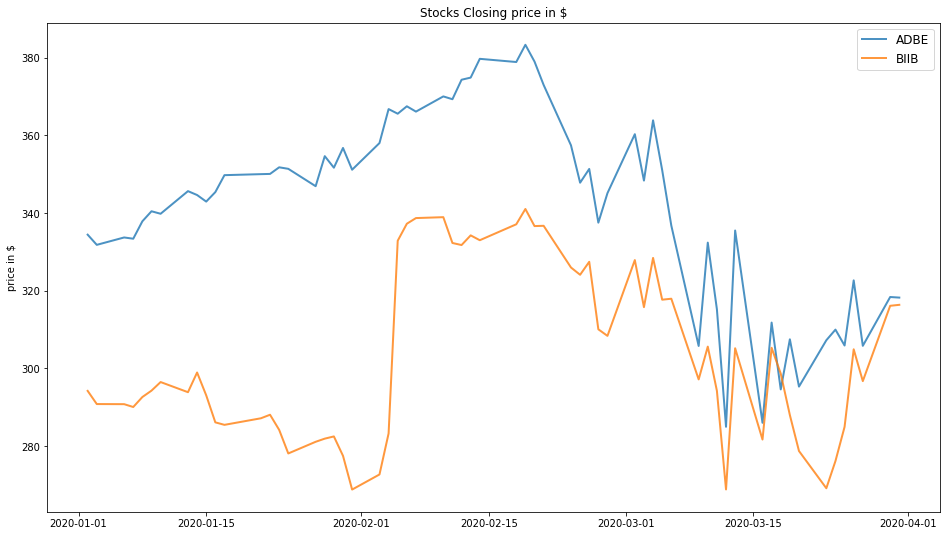

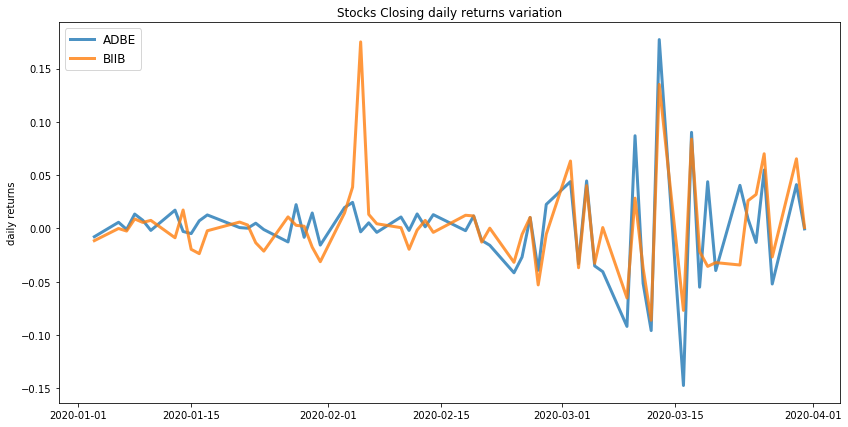

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.34


            ADBE   BIIB
allocation  0.0   100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.08
Annualised Volatility: 0.32


             ADBE   BIIB
allocation  41.52  58.48


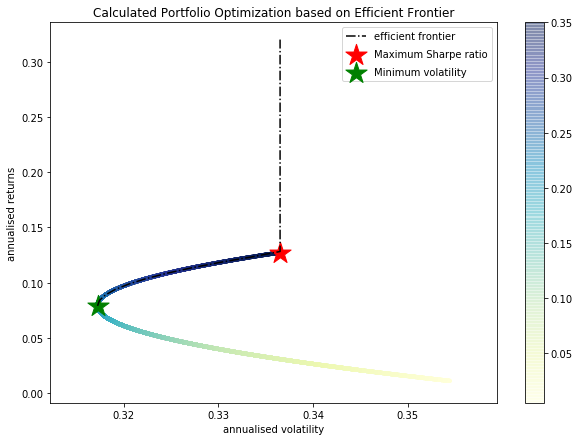

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

ADBE : annuaised return 0.01 , annualised volatility: 0.35
BIIB : annuaised return 0.13 , annualised volatility: 0.33
--------------------------------------------------------------------------------


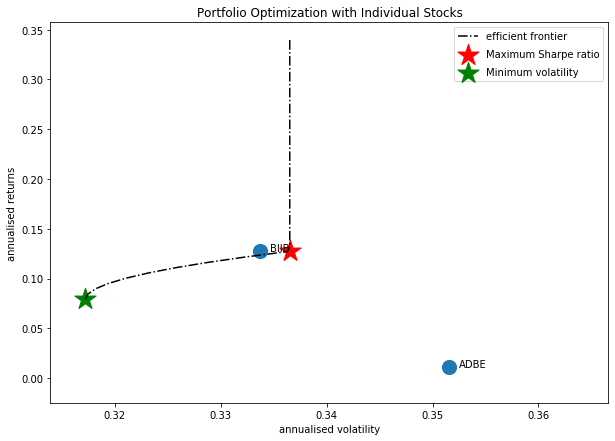

[[1.876439118124916, 0.2, 0.1, ['AMZN', 'CBS'], array([[79.54, 20.46]]), '2018-04-01'], [1.7878336227575213, 0.23, 0.12, ['AMZN', 'BKNG'], array([[100.,   0.]]), '2018-04-01'], [2.030057387102509, 0.4, 0.19, ['CBS', 'AMD'], array([[75.79, 24.21]]), '2018-04-01'], [2.539573199888295, 0.77, 0.3, ['CMG', 'AMD'], array([[100.,   0.]]), '2018-07-01'], [0.27947746869450696, 0.04, 0.11, ['CMG', 'DHI'], array([[46.25, 53.75]]), '2018-07-01'], [0.9552733657611113, 0.11, 0.11, ['CMG', 'CXO'], array([[18.72, 81.28]]), '2018-07-01'], [2.982365285512875, 0.39, 0.13, ['AMZN', 'AMD'], array([[36.7, 63.3]]), '2018-07-01'], [0.5720921720594092, 0.1, 0.15, ['AZO', 'CMCSA'], array([[100.,   0.]]), '2018-10-01'], [0.5720921720594088, 0.1, 0.15, ['AZO', 'BAC'], array([[100.,   0.]]), '2018-10-01'], [0.5720921720594091, 0.1, 0.15, ['AZO', 'BKNG'], array([[100.,   0.]]), '2018-10-01'], [0.5720921720594092, 0.1, 0.15, ['AZO', 'EQIX'], array([[100.,   0.]]), '2018-10-01'], [1.2471445818521063, 0.19, 0.15, ['AM

In [68]:
quarter_list=["2018-04-01", "2018-07-01", "2018-10-01", "2019-01-01", "2019-04-01", "2019-07-01", "2019-10-01", "2020-01-01", "2020-04-01"]
## Taken from
# https://www.treasury.gov/resource-center/data-chart-center/interest-rates/Pages/TextView.aspx?data=billRatesYear&year=2018
# 13 weeks period, COUPON EQUIVALENT, based on last possible date of each quarter
risk_free_rates = [1.93, 2.19, 2.45, 2.40, 2.13, 1.88, 1.55, 0.03]

returns_sharpe_company_list = []
for idx in range(1, len(quarter_list)):
    df_quarter_data = new_df[(new_df["start_date"] >= quarter_list[idx-1]) & (new_df["start_date"]< quarter_list[idx])]
    print("Companies listed in quarter {} which is between {} and {}".format(idx, quarter_list[idx-1], quarter_list[idx]))
    list_of_companies = df_quarter_data["symbol"].unique()
    #generate the stocks pairs which are uncorrelated and having covariance less than mean covariance 
    stocks_pair = get_portfolio_pairs(list_of_companies)
    #print(stocks_pair)
    for stock_list in stocks_pair:
        print("perform efficient_frontier_stock_portfolio Pairs of the companies we got {}".format(stock_list))
        pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = efficient_frontier_stock_portfolio(stock_list, len(stock_list), risk_free_rates[idx-1], quarter_list[idx-1], quarter_list[idx])
        returns_sharpe_company_list.append([pos_sharpe, Annualised_Return, Annualised_Volatility, stock_list, allocation_weights, quarter_list[idx-1]])
print(returns_sharpe_company_list)

In [69]:
shortlisted_portfolio_df = pd.DataFrame(returns_sharpe_company_list)

In [70]:
shortlisted_portfolio_df.columns = ["Sharpe Ratio", "Portfolio Annualised Return", "Portfolio Annualised_Volatility", "Stock Portfolio", "Stocks Weight Allocation", "Quarter Start Date"]

### we know that higher the sharpe ratio value the stocks have a good returns with consideration of the risk in  the investment and for the portfolio we tag quantitative values such as below for the portfolio generated:

#### Sharpe Ratio >=  3 ---> "Excellent Portfolio"

#### Sharpe Ratio >=  2 ---> "Very Good Portfolio"

#### Sharpe Ratio >= 1 ---> "Good Portfolio"

#### Sharpe Ratio < 1 ---> "Bad Portfolio"

In [71]:
# creating a blank series 
Portfolio_Tag = pd.Series([]) 

for row in range(len(shortlisted_portfolio_df)):
    if (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 3):
        Portfolio_Tag[row] = "Excellent"
    elif (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 2 and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 3)):
        Portfolio_Tag[row] = "Very Good"
    elif ((shortlisted_portfolio_df["Sharpe Ratio"][row] >= 1)  and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 2)):
        Portfolio_Tag[row] = "Good"
    else:
        Portfolio_Tag[row] = "Bad"
        
# inserting new column with values of list made above         
shortlisted_portfolio_df.insert(5, "Portfolio Tag", Portfolio_Tag) 

/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



## Possible combinations of the company from which we will take the final Portfolio list

In [72]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag,Quarter Start Date
0,1.876439,0.20,0.10,"[AMZN, CBS]","[[79.54, 20.46]]",Good,2018-04-01
1,1.787834,0.23,0.12,"[AMZN, BKNG]","[[100.0, 0.0]]",Good,2018-04-01
2,2.030057,0.40,0.19,"[CBS, AMD]","[[75.79, 24.21]]",Very Good,2018-04-01
3,2.539573,0.77,0.30,"[CMG, AMD]","[[100.0, 0.0]]",Very Good,2018-07-01
4,0.279477,0.04,0.11,"[CMG, DHI]","[[46.25, 53.75]]",Bad,2018-07-01
5,0.955273,0.11,0.11,"[CMG, CXO]","[[18.72, 81.28]]",Bad,2018-07-01
6,2.982365,0.39,0.13,"[AMZN, AMD]","[[36.7, 63.3]]",Very Good,2018-07-01
7,0.572092,0.10,0.15,"[AZO, CMCSA]","[[100.0, 0.0]]",Bad,2018-10-01
8,0.572092,0.10,0.15,"[AZO, BAC]","[[100.0, 0.0]]",Bad,2018-10-01
9,0.572092,0.10,0.15,"[AZO, BKNG]","[[100.0, 0.0]]",Bad,2018-10-01


In [73]:
shortlisted_portfolio = shortlisted_portfolio_df[(shortlisted_portfolio_df["Portfolio Tag"] == "Excellent") | (shortlisted_portfolio_df["Portfolio Tag"] == "Very Good") |
                                                    (shortlisted_portfolio_df["Portfolio Tag"] == "Good")]

In [74]:
shortlisted_portfolio = shortlisted_portfolio.sort_values(by="Sharpe Ratio", ascending=False)

In [75]:
shortlisted_portfolio

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag,Quarter Start Date
15,3.331340,0.20,0.06,"[NEE, KMI]","[[52.52, 47.48]]",Excellent,2019-01-01
6,2.982365,0.39,0.13,"[AMZN, AMD]","[[36.7, 63.3]]",Very Good,2018-07-01
24,2.928643,0.49,0.16,"[BKNG, AMD]","[[100.0, 0.0]]",Very Good,2019-10-01
12,2.637172,0.26,0.09,"[AMZN, KMI]","[[0.0, 100.0]]",Very Good,2019-01-01
3,2.539573,0.77,0.30,"[CMG, AMD]","[[100.0, 0.0]]",Very Good,2018-07-01
14,2.055879,0.16,0.07,"[NEE, AAPL]","[[22.34, 77.66]]",Very Good,2019-01-01
2,2.030057,0.40,0.19,"[CBS, AMD]","[[75.79, 24.21]]",Very Good,2018-04-01
22,2.009201,0.18,0.09,"[EFX, BLK, BIIB]","[[15.11, 84.89, 0.0]]",Very Good,2019-10-01
0,1.876439,0.20,0.10,"[AMZN, CBS]","[[79.54, 20.46]]",Good,2018-04-01
1,1.787834,0.23,0.12,"[AMZN, BKNG]","[[100.0, 0.0]]",Good,2018-04-01


# Top 5 stock portfolios to be taken from the data (User to choose)

In [76]:
shortlisted_portfolio[:5]

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag,Quarter Start Date
15,3.331340,0.20,0.06,"[NEE, KMI]","[[52.52, 47.48]]",Excellent,2019-01-01
6,2.982365,0.39,0.13,"[AMZN, AMD]","[[36.7, 63.3]]",Very Good,2018-07-01
24,2.928643,0.49,0.16,"[BKNG, AMD]","[[100.0, 0.0]]",Very Good,2019-10-01
12,2.637172,0.26,0.09,"[AMZN, KMI]","[[0.0, 100.0]]",Very Good,2019-01-01
3,2.539573,0.77,0.30,"[CMG, AMD]","[[100.0, 0.0]]",Very Good,2018-07-01


## portfolio generated quarterwise from 2018 - 2020

In [77]:
shortlisted_portfolio_quarterwise_max_df = shortlisted_portfolio_df.groupby("Quarter Start Date")["Sharpe Ratio"].max().reset_index()

In [78]:
portfolio_quarterwise_max = pd.merge(left=shortlisted_portfolio_quarterwise_max_df, right=shortlisted_portfolio_df,left_on='Sharpe Ratio', right_on='Sharpe Ratio').drop(["Quarter Start Date_y"], axis=1)

In [79]:
portfolio_quarterwise_max

,Quarter Start Date_x,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
0,2018-04-01,2.030057,0.40,0.19,"[CBS, AMD]","[[75.79, 24.21]]",Very Good
1,2018-07-01,2.982365,0.39,0.13,"[AMZN, AMD]","[[36.7, 63.3]]",Very Good
2,2018-10-01,0.572092,0.10,0.15,"[AZO, CMCSA]","[[100.0, 0.0]]",Bad
3,2018-10-01,0.572092,0.10,0.15,"[AZO, EQIX]","[[100.0, 0.0]]",Bad
4,2019-01-01,3.331340,0.20,0.06,"[NEE, KMI]","[[52.52, 47.48]]",Excellent
5,2019-04-01,1.412471,0.30,0.21,"[AMZN, APC]","[[43.06, 56.94]]",Good
6,2019-07-01,1.721227,0.20,0.11,"[AJG, DHI]","[[0.0, 100.0]]",Good
7,2019-10-01,2.928643,0.49,0.16,"[BKNG, AMD]","[[100.0, 0.0]]",Very Good
8,2020-01-01,0.401801,0.13,0.30,"[BIIB, EQIX, AOS]","[[0.0, 37.45, 62.55]]",Bad


## portfolio generated for the shortlisted companies for overall 2 yr period

In [81]:
portfolio_list

array(['EQIX', 'AMZN', 'GOOGL', 'CMG', 'AZO', 'NEE', 'BKNG', 'AJG', 'EFX',
       'BLK', 'BIIB', 'AAPL', 'CBS', 'AMD', 'AON', 'DHI', 'CXO', 'NEM',
       'CMCSA', 'BAC', 'COTY', 'KMI', 'HP', 'BMY', 'APC', 'EMR', 'MLM',
       'AOS', 'CTXS', 'BA', 'ADBE'], dtype=object)

['EQIX' 'AMZN' 'GOOGL' 'CMG' 'AZO' 'NEE' 'BKNG' 'AJG' 'EFX' 'BLK' 'BIIB'
 'AAPL' 'CBS' 'AMD' 'AON' 'DHI' 'CXO' 'NEM' 'CMCSA' 'BAC' 'COTY' 'KMI'
 'HP' 'BMY' 'APC' 'EMR' 'MLM' 'AOS' 'CTXS' 'BA' 'ADBE']
perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'KMI', 'AJG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



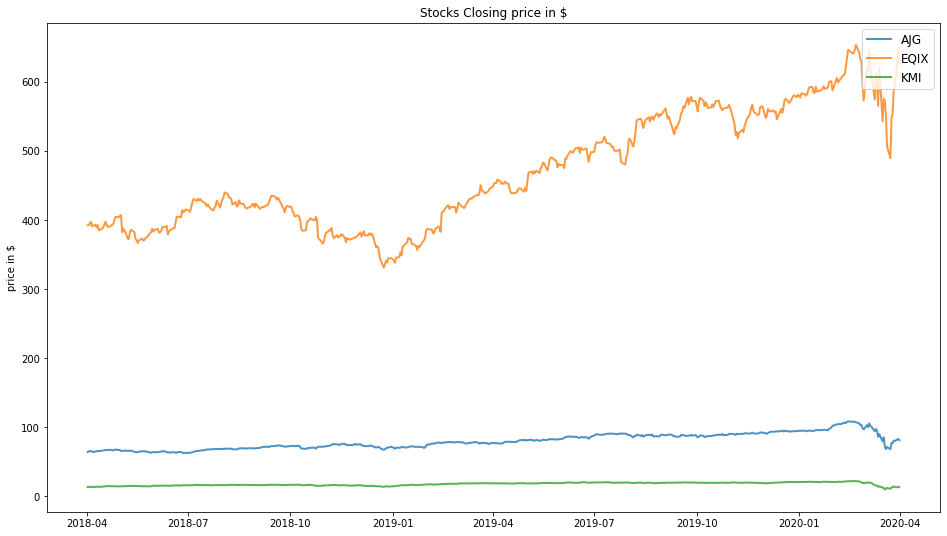

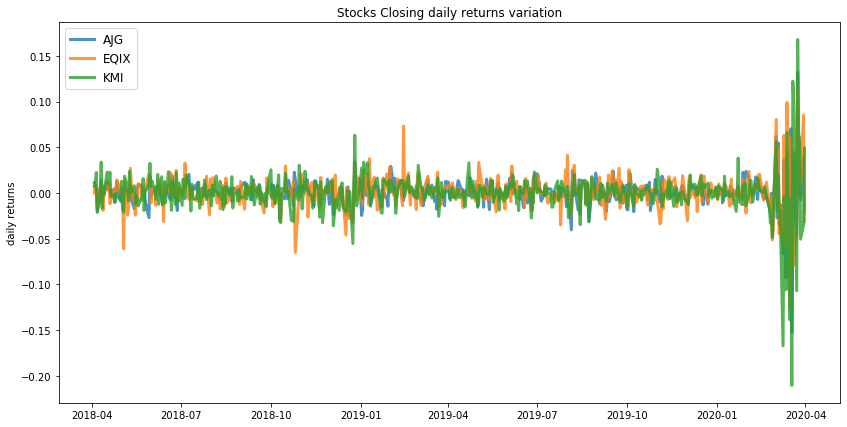

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.54
Annualised Volatility: 0.41


             AJG   EQIX  KMI
allocation  6.13  93.87  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.39
Annualised Volatility: 0.35


              AJG   EQIX   KMI
allocation  53.71  37.99  8.31


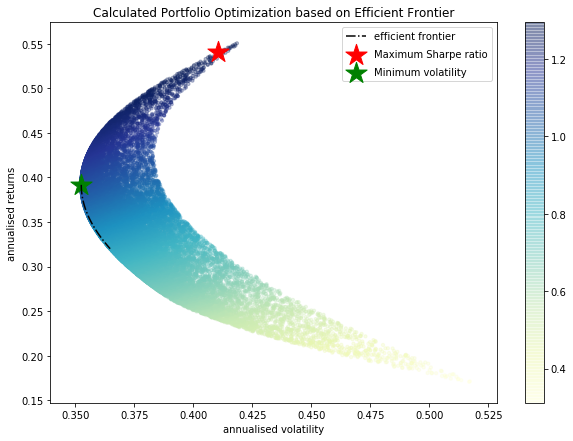

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AJG : annuaised return 0.31 , annualised volatility: 0.38
EQIX : annuaised return 0.56 , annualised volatility: 0.42
KMI : annuaised return 0.17 , annualised volatility: 0.52
--------------------------------------------------------------------------------


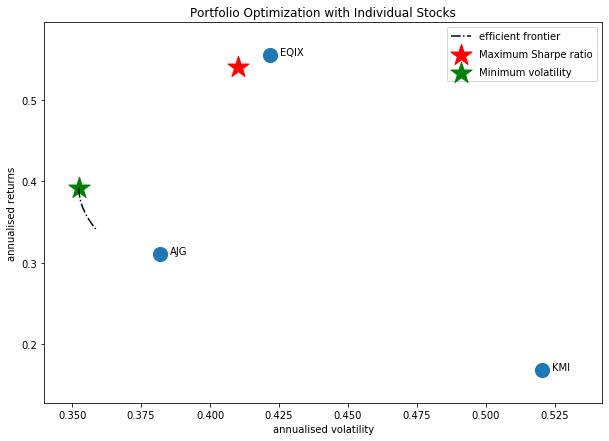

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'AOS']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



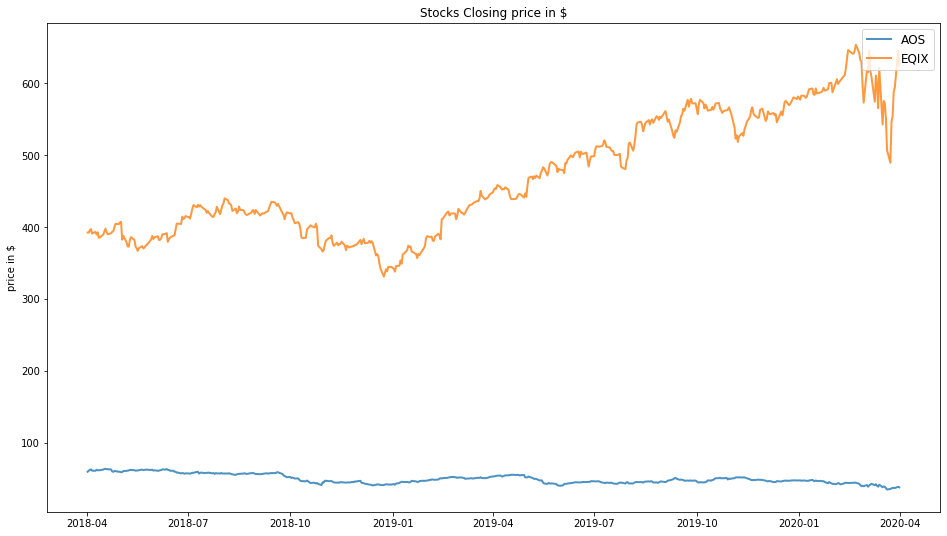

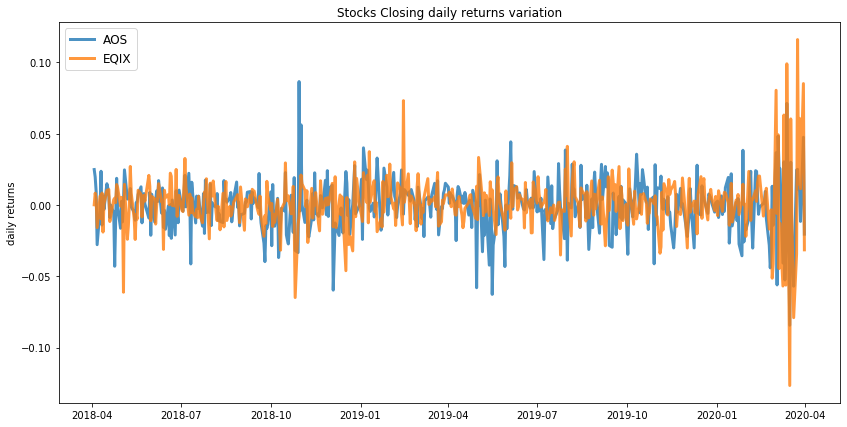

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.56
Annualised Volatility: 0.42


            AOS   EQIX
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.07
Annualised Volatility: 0.34


              AOS   EQIX
allocation  52.32  47.68


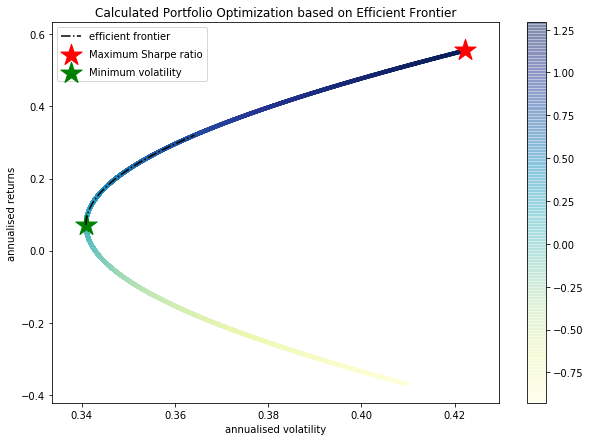

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AOS : annuaised return -0.37 , annualised volatility: 0.41
EQIX : annuaised return 0.56 , annualised volatility: 0.42
--------------------------------------------------------------------------------


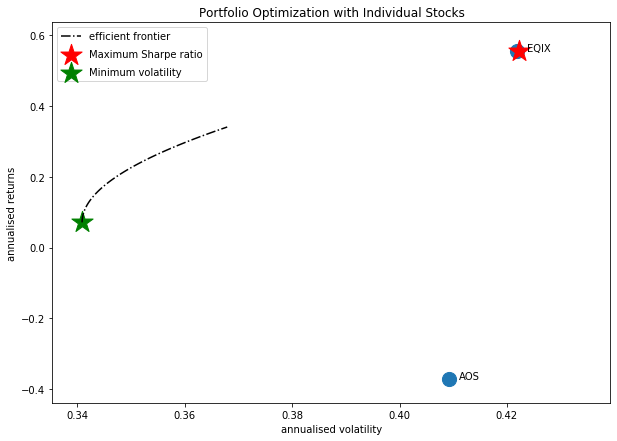

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EQIX', 'ADBE']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



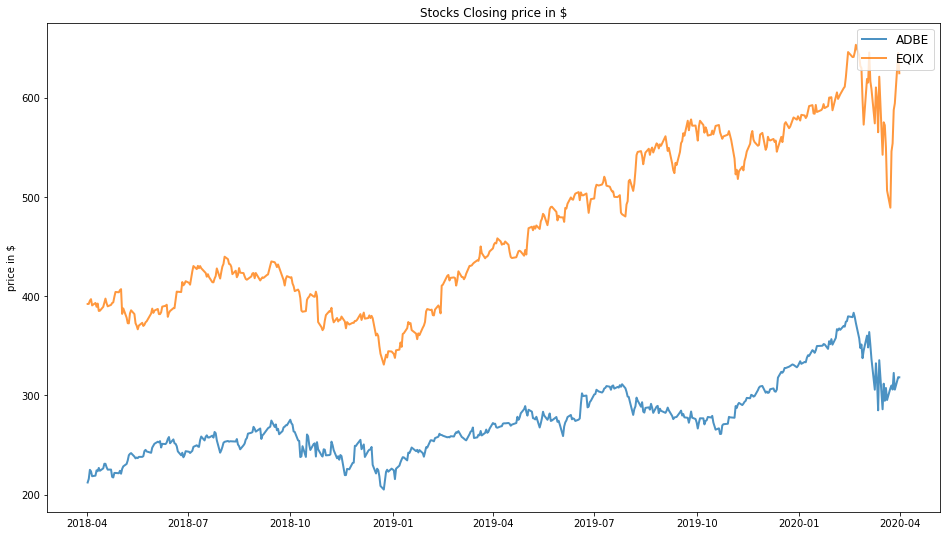

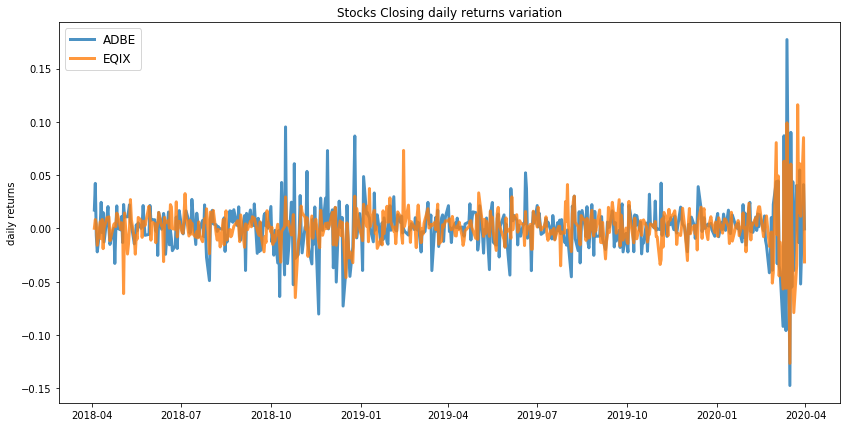

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.55
Annualised Volatility: 0.4


            ADBE  EQIX
allocation  27.2  72.8
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.55
Annualised Volatility: 0.4


             ADBE   EQIX
allocation  28.52  71.48


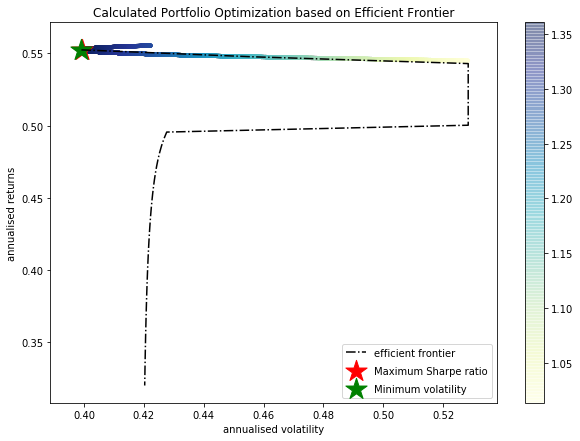

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

ADBE : annuaised return 0.55 , annualised volatility: 0.53
EQIX : annuaised return 0.56 , annualised volatility: 0.42
--------------------------------------------------------------------------------


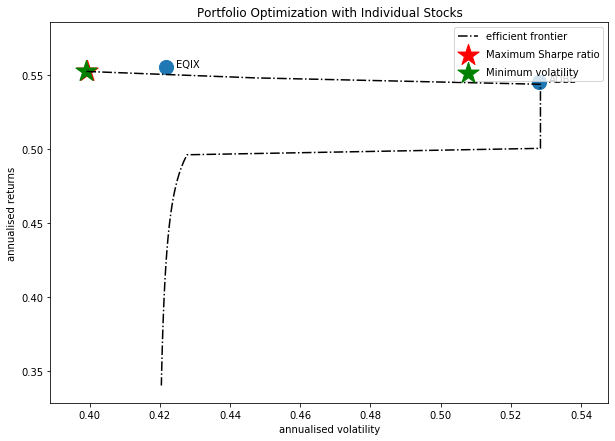

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'AJG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



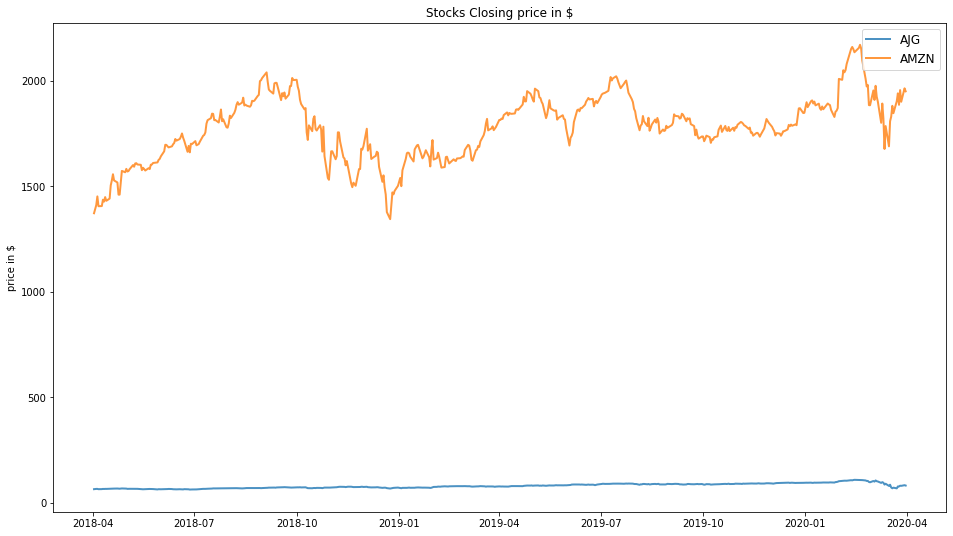

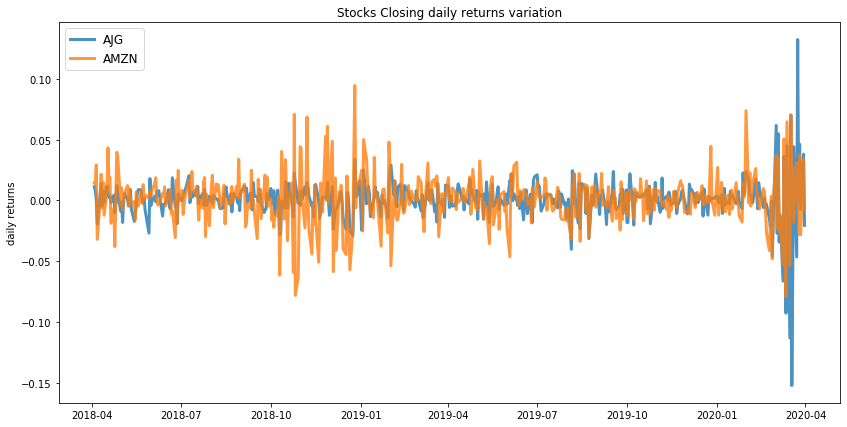

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.4
Annualised Volatility: 0.36


             AJG  AMZN
allocation  41.0  59.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.36
Annualised Volatility: 0.35


              AJG   AMZN
allocation  64.59  35.41


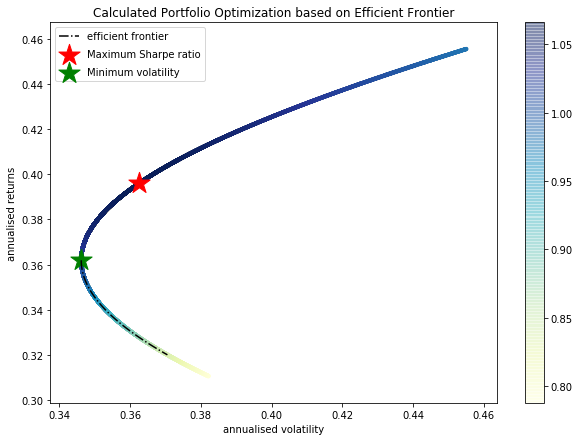

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AJG : annuaised return 0.31 , annualised volatility: 0.38
AMZN : annuaised return 0.46 , annualised volatility: 0.45
--------------------------------------------------------------------------------


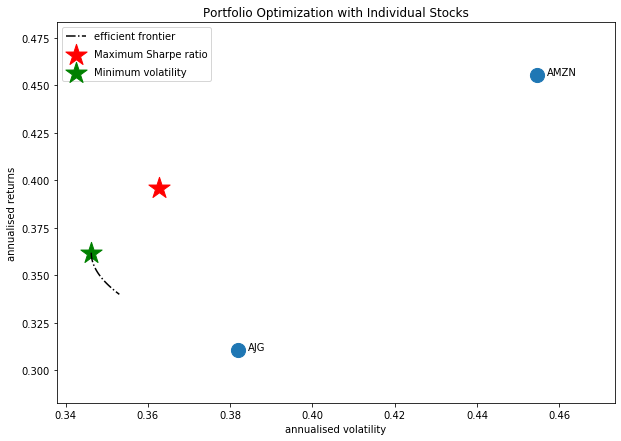

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'AOS']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



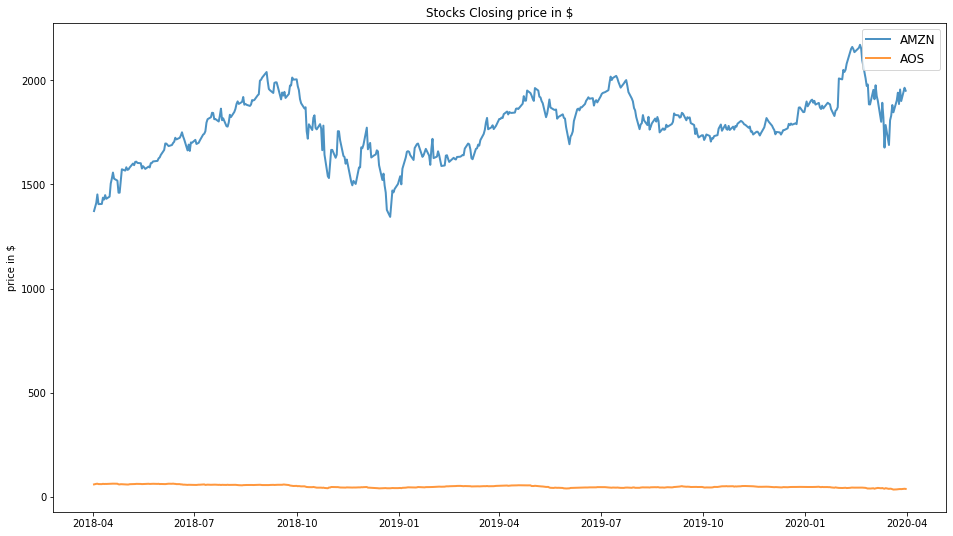

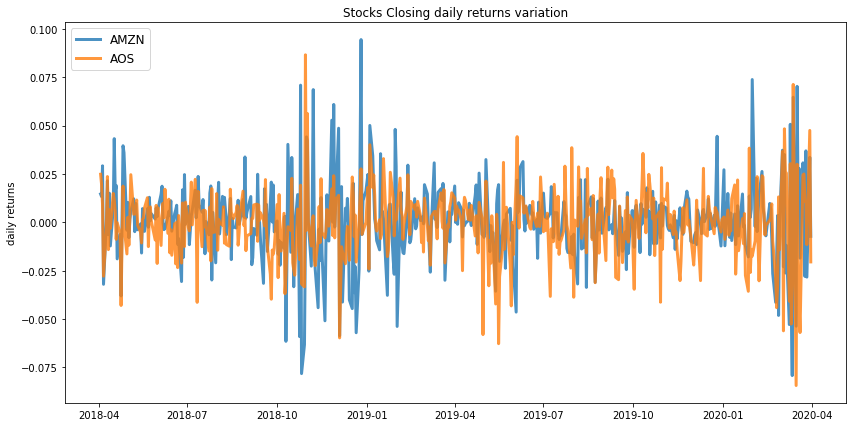

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.46
Annualised Volatility: 0.46


             AMZN  AOS
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: -0.03
Annualised Volatility: 0.36


             AMZN    AOS
allocation  40.63  59.37


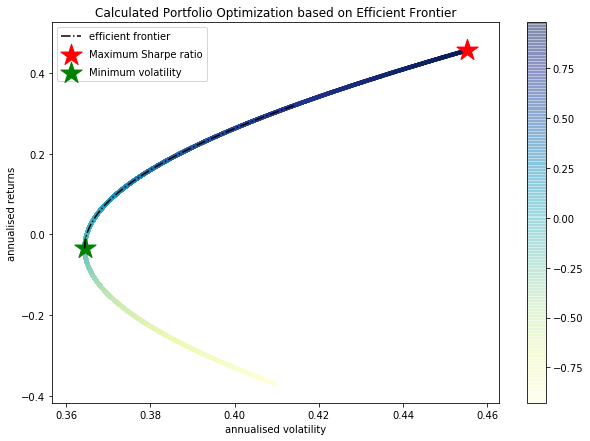

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.46 , annualised volatility: 0.45
AOS : annuaised return -0.37 , annualised volatility: 0.41
--------------------------------------------------------------------------------


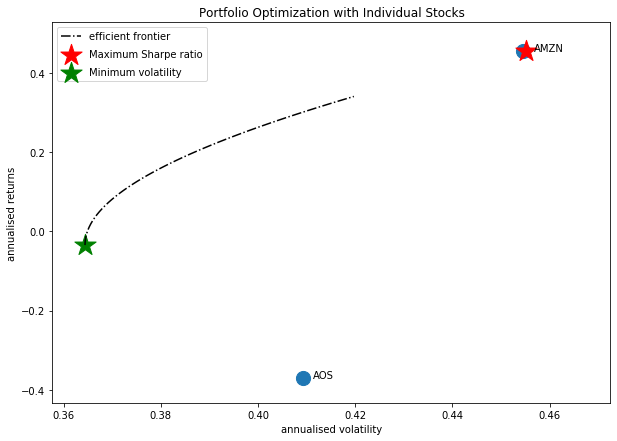

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'AZO', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'NEM']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



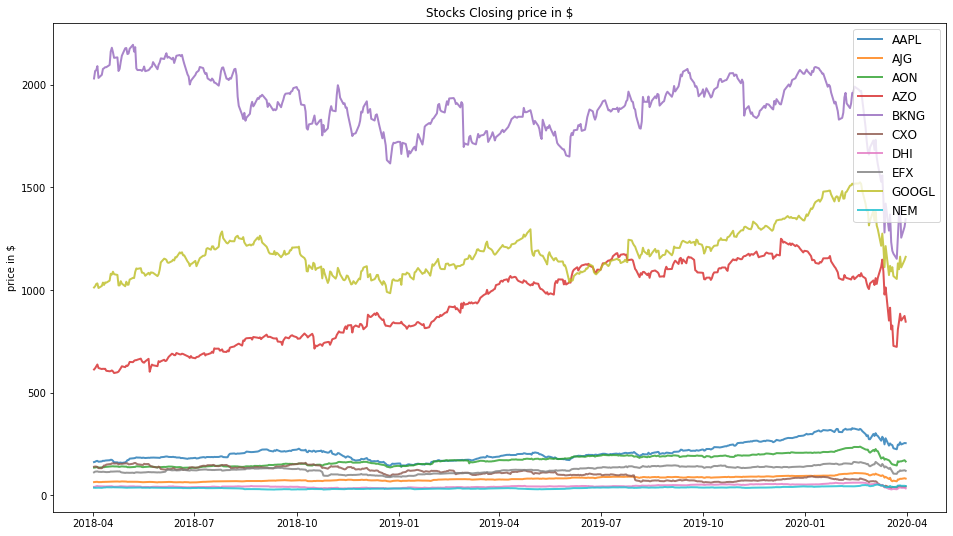

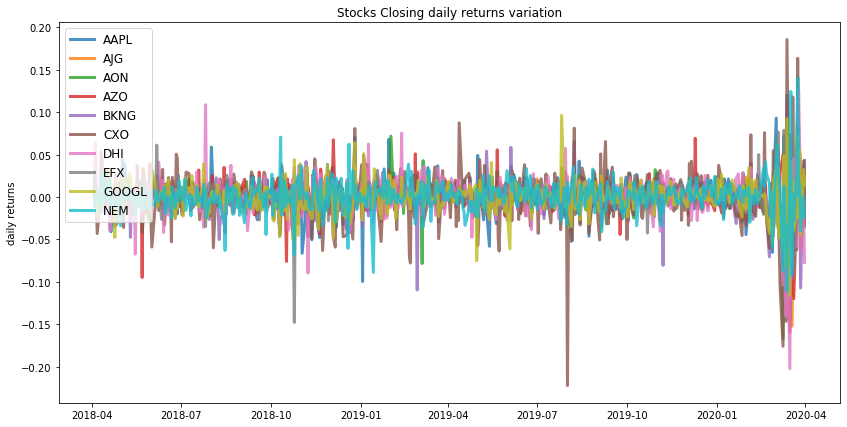

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.46
Annualised Volatility: 0.34


             AAPL  AJG  AON    AZO  BKNG  CXO  DHI  EFX  GOOGL    NEM
allocation  47.95  0.0  0.1  25.36  0.0   0.0  0.0  0.0  0.0    26.59
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.27
Annualised Volatility: 0.28


            AAPL  AJG    AON    AZO  BKNG  CXO  DHI   EFX  GOOGL    NEM
allocation  0.0   0.0  30.15  16.89  4.65  0.0  0.0  4.67  16.93  26.71


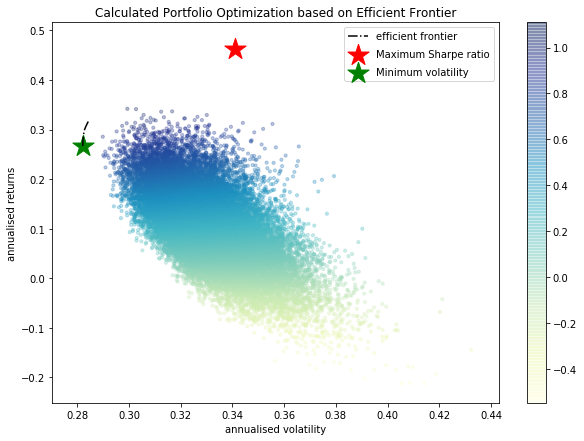

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
AZO : annuaised return 0.43 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


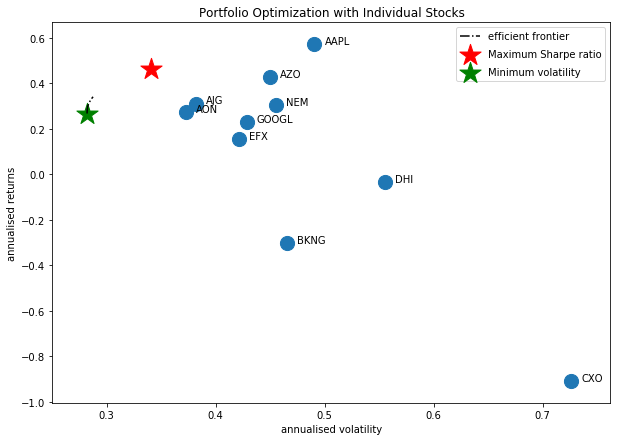

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'AZO', 'NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'NEM']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



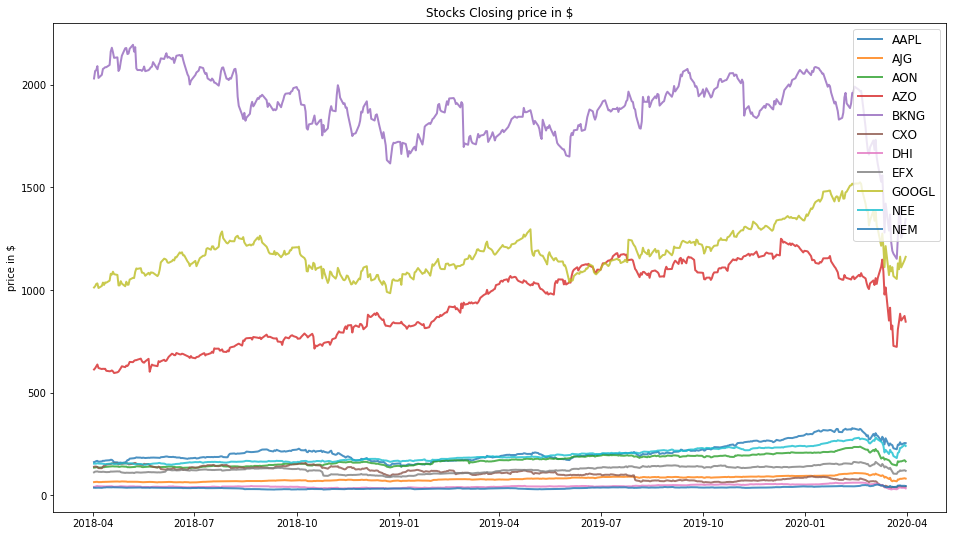

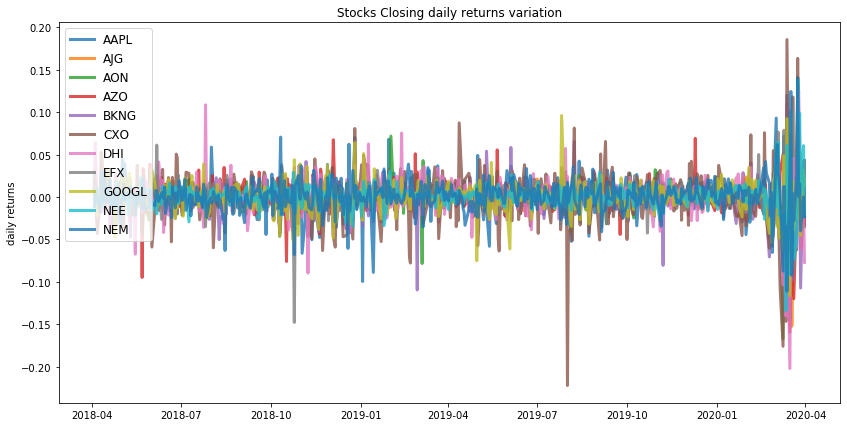

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.5
Annualised Volatility: 0.33


             AAPL  AJG  AON   AZO  BKNG  CXO  DHI  EFX  GOOGL    NEE    NEM
allocation  29.66  0.0  0.0  7.89  0.0   0.0  0.0  0.0  0.0    49.73  12.72
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.31
Annualised Volatility: 0.28


            AAPL  AJG   AON    AZO  BKNG  CXO  DHI   EFX  GOOGL   NEE    NEM
allocation  0.0   0.0  27.0  13.39  3.23  0.0  0.0  2.26  16.0   13.9  24.23


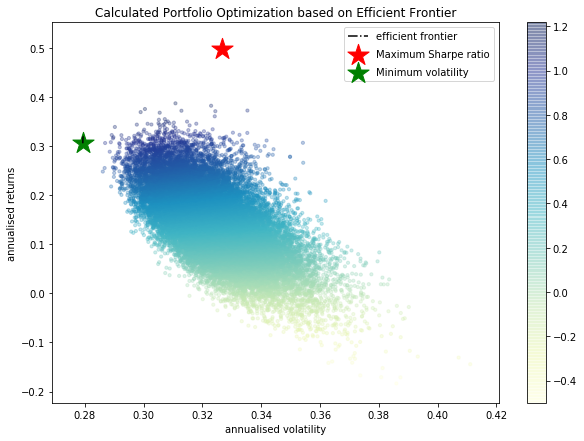

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
AZO : annuaised return 0.43 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
NEE : annuaised return 0.52 , annualised volatility: 0.38
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


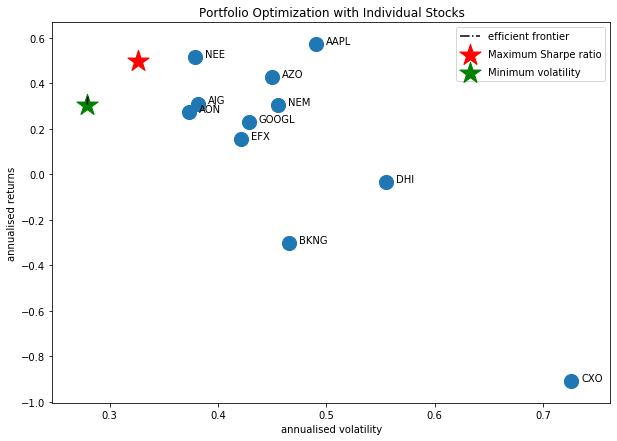

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'NEM']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



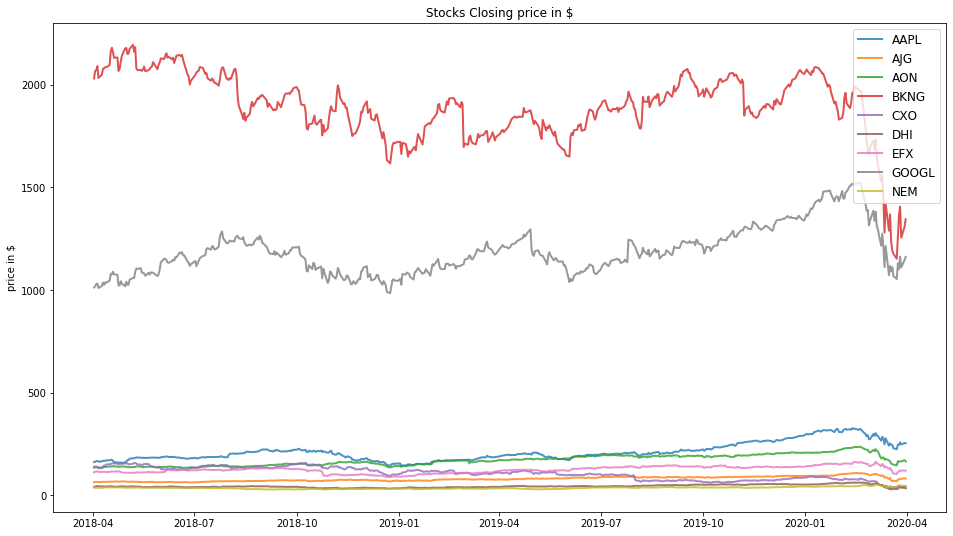

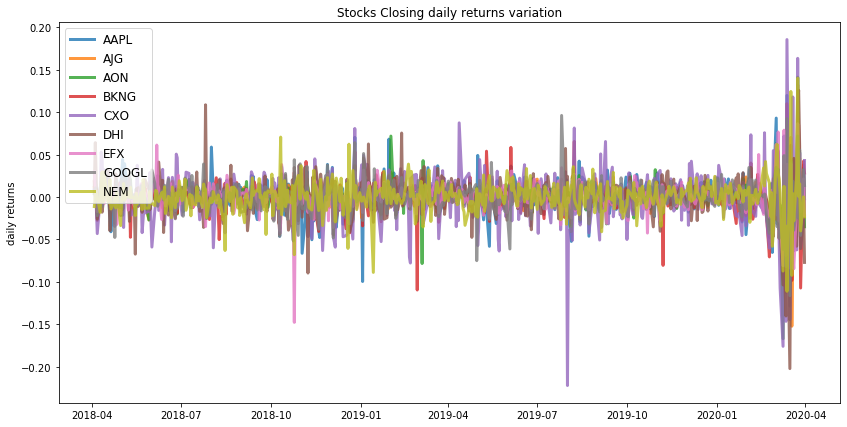

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.47
Annualised Volatility: 0.36


             AAPL   AJG   AON  BKNG  CXO  DHI  EFX  GOOGL    NEM
allocation  63.22  0.97  1.72  0.0   0.0  0.0  0.0  0.0    34.09
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.22
Annualised Volatility: 0.29


            AAPL   AJG   AON  BKNG  CXO  DHI   EFX  GOOGL    NEM
allocation  0.0   3.46  30.4  8.31  0.0  0.0  7.97  19.85  30.01


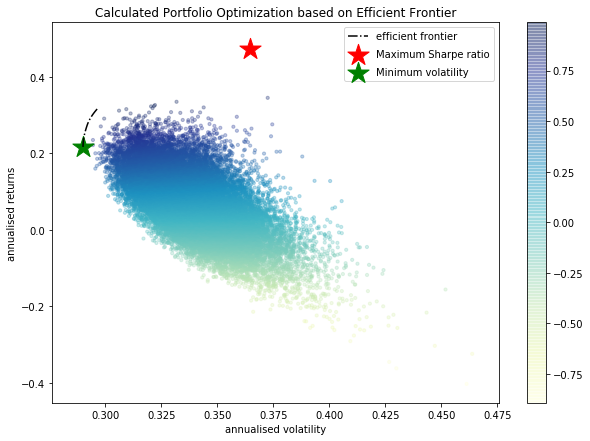

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


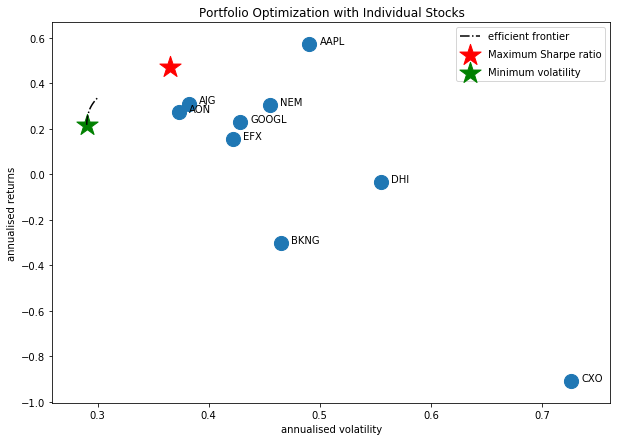

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'BKNG', 'AJG', 'EFX', 'AAPL', 'DHI', 'CXO', 'NEM', 'BAC']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



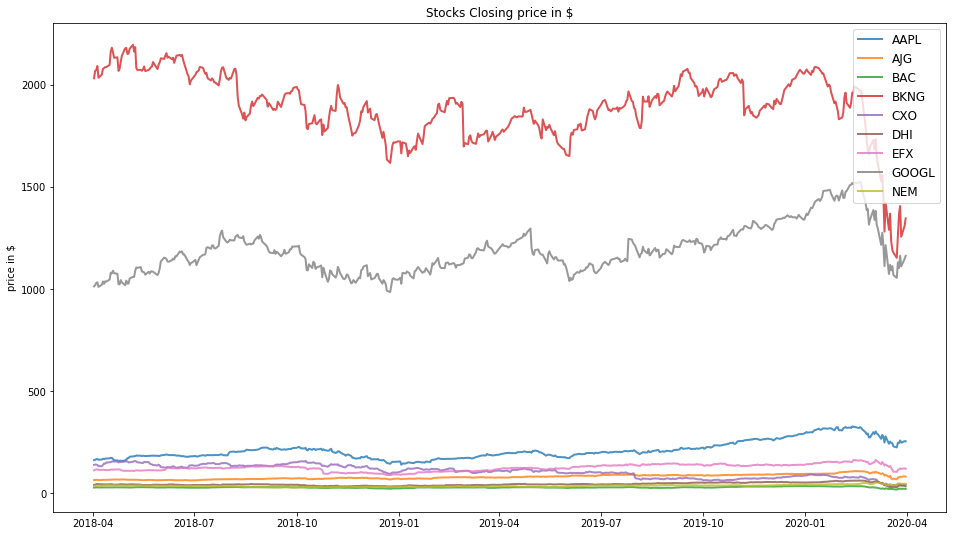

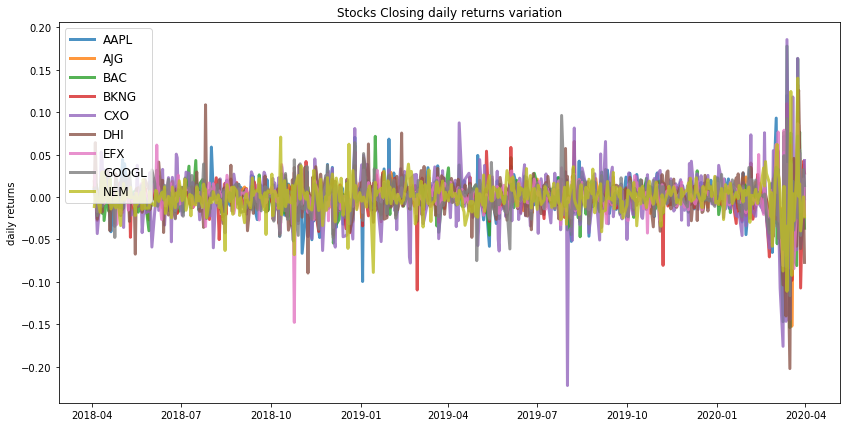

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.47
Annualised Volatility: 0.37


             AAPL  AJG  BAC  BKNG  CXO  DHI  EFX  GOOGL    NEM
allocation  63.63  2.1  0.0  0.0   0.0  0.0  0.0  0.0    34.27
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.22
Annualised Volatility: 0.3


            AAPL    AJG  BAC  BKNG  CXO  DHI    EFX  GOOGL    NEM
allocation  0.0   24.18  0.0  7.37  0.0  0.0  12.43  23.67  32.35


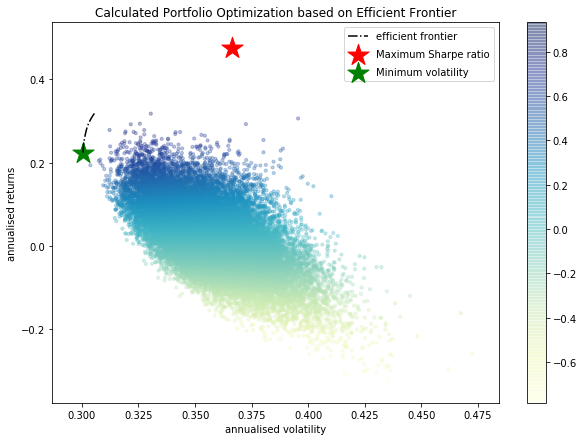

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
BAC : annuaised return -0.14 , annualised volatility: 0.52
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


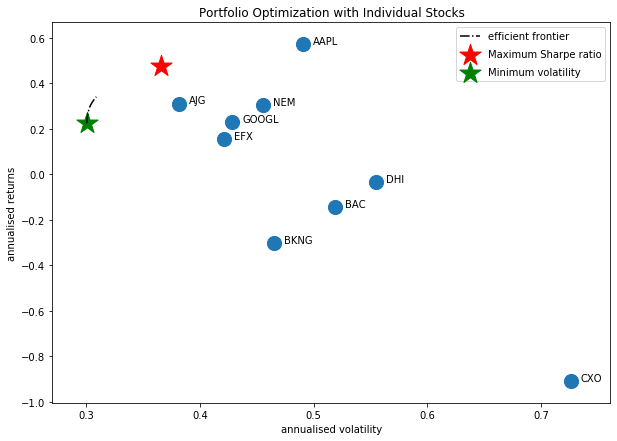

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'CTXS']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



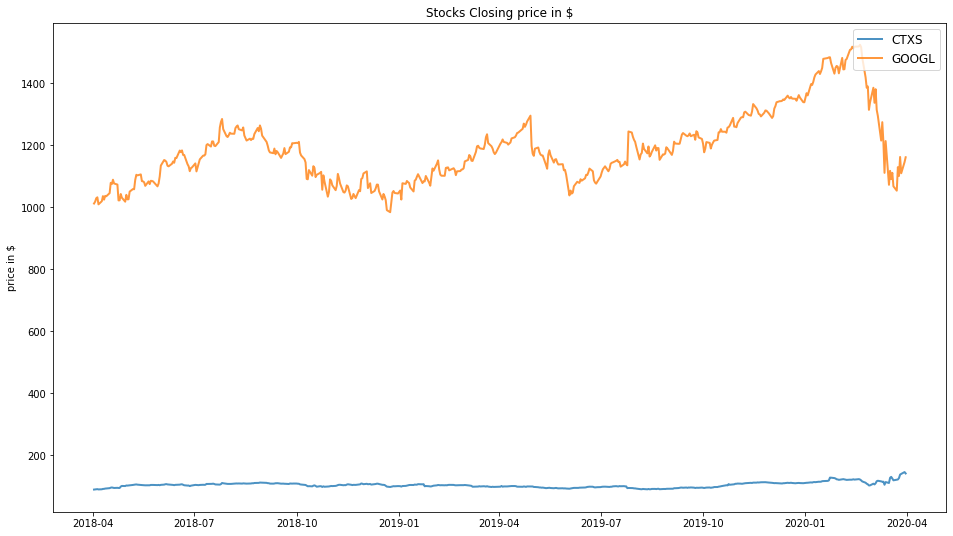

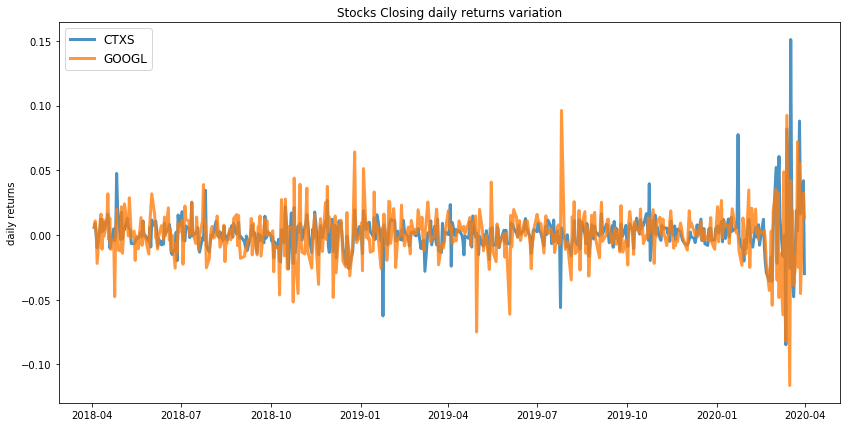

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.52
Annualised Volatility: 0.35


             CTXS  GOOGL
allocation  100.0  0.0  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.43
Annualised Volatility: 0.32


             CTXS  GOOGL
allocation  68.56  31.44


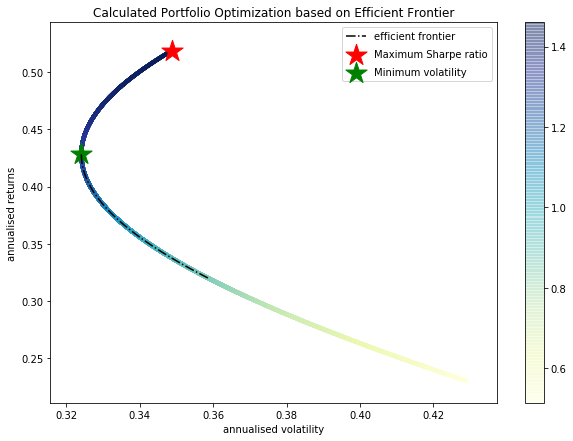

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

CTXS : annuaised return 0.52 , annualised volatility: 0.35
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
--------------------------------------------------------------------------------


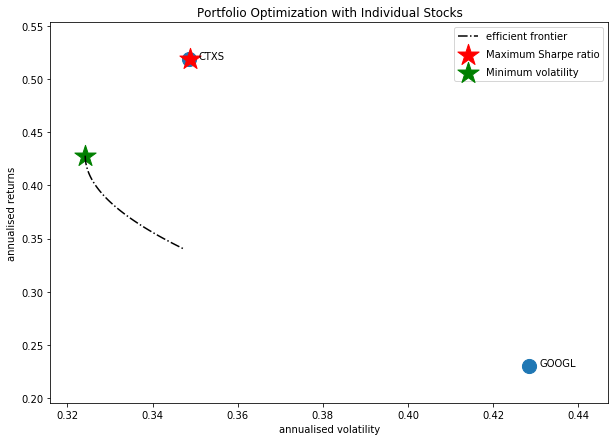

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'NEM']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



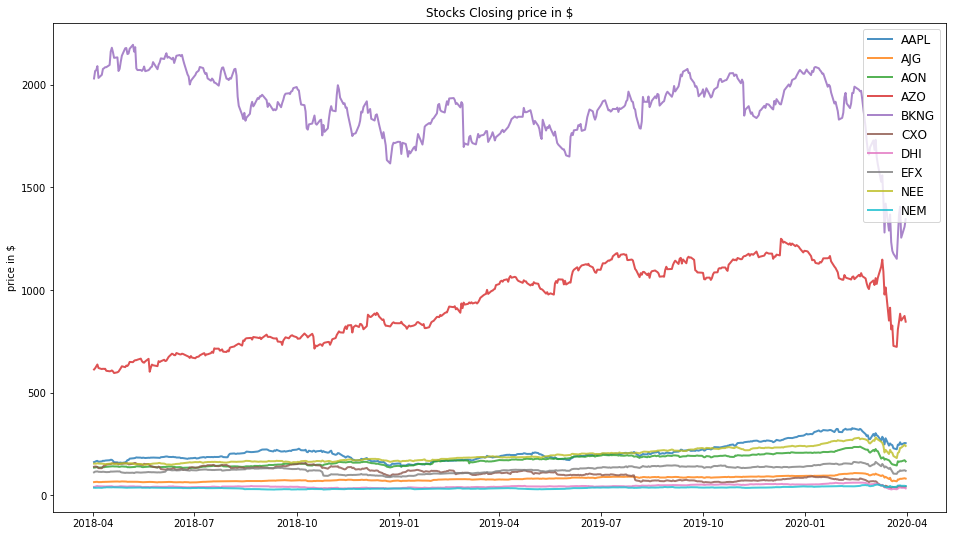

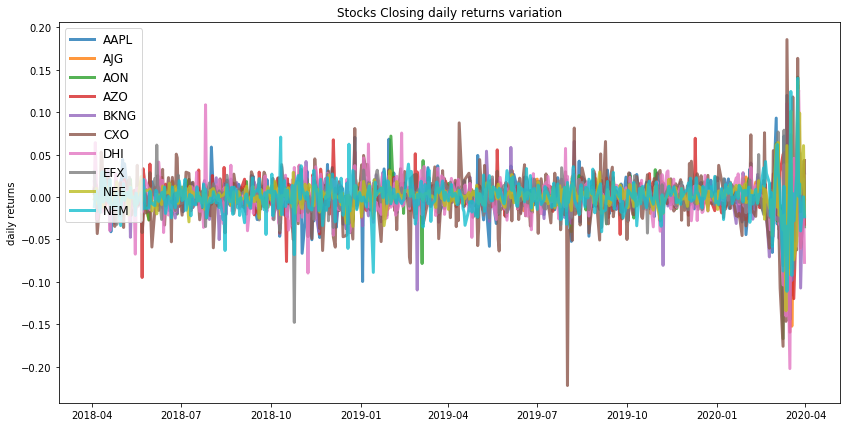

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.5
Annualised Volatility: 0.33


             AAPL  AJG  AON   AZO  BKNG  CXO  DHI  EFX    NEE    NEM
allocation  29.68  0.0  0.0  7.92  0.0   0.0  0.0  0.0  49.71  12.68
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.28
Annualised Volatility: 0.28


            AAPL  AJG    AON    AZO  BKNG  CXO  DHI   EFX    NEE    NEM
allocation  0.41  0.0  30.73  14.87  9.86  0.0  0.0  5.32  15.08  23.73


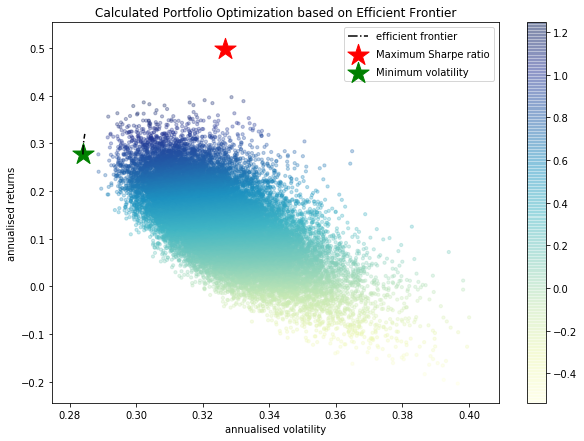

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
AZO : annuaised return 0.43 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
NEE : annuaised return 0.52 , annualised volatility: 0.38
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


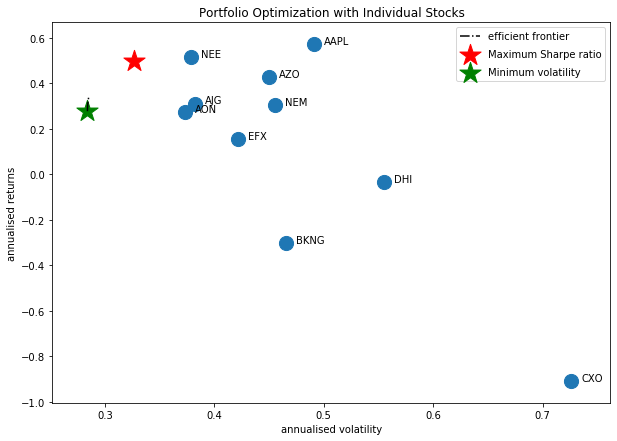

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMCSA', 'AZO']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



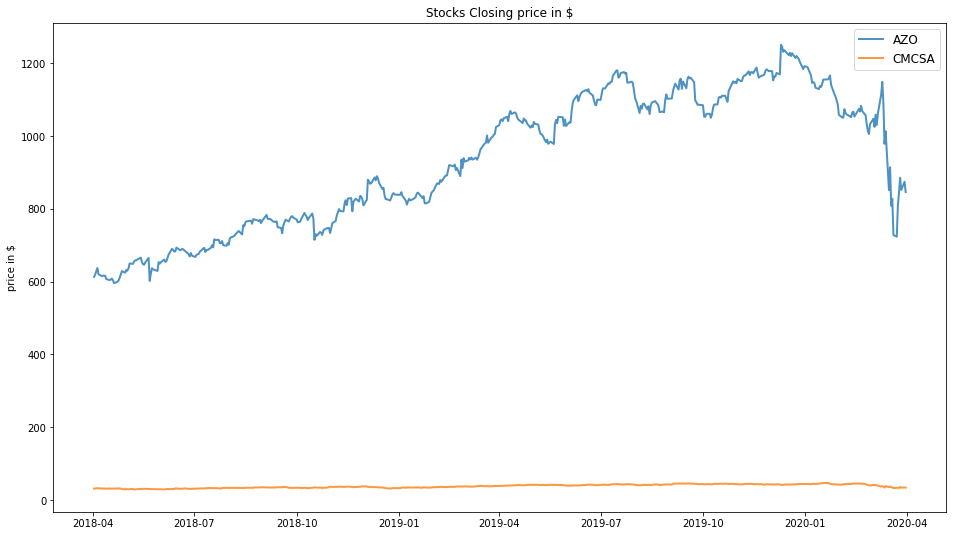

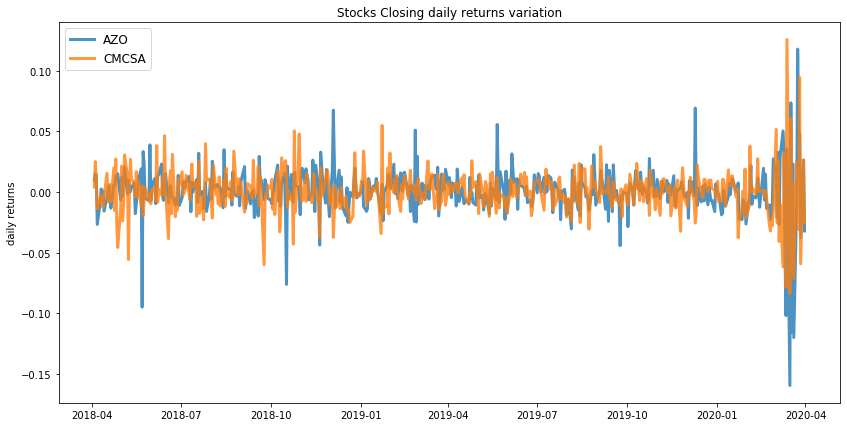

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.43
Annualised Volatility: 0.45


              AZO  CMCSA
allocation  99.97  0.03 
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.28
Annualised Volatility: 0.36


              AZO  CMCSA
allocation  43.46  56.54


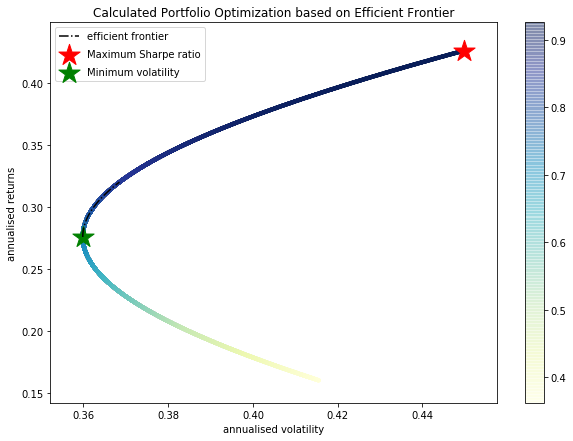

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.43 , annualised volatility: 0.45
CMCSA : annuaised return 0.16 , annualised volatility: 0.42
--------------------------------------------------------------------------------


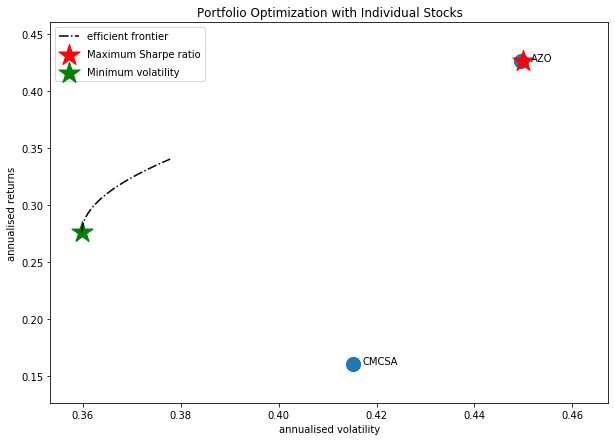

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'KMI']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



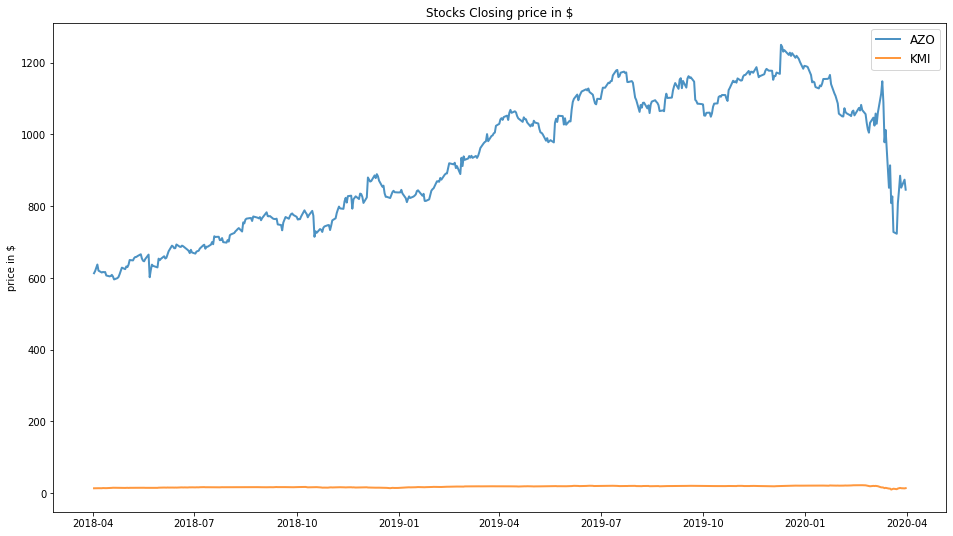

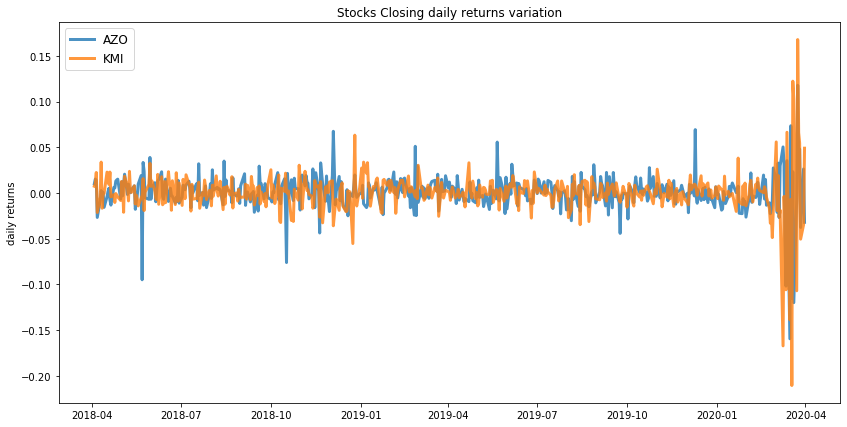

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.43
Annualised Volatility: 0.45


              AZO  KMI
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.33
Annualised Volatility: 0.4


             AZO   KMI
allocation  61.3  38.7


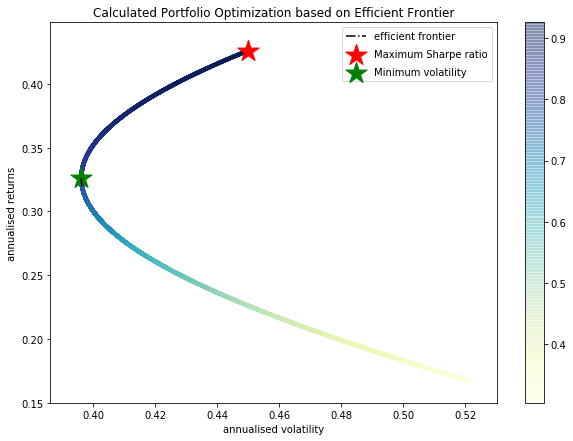

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AZO : annuaised return 0.43 , annualised volatility: 0.45
KMI : annuaised return 0.17 , annualised volatility: 0.52
--------------------------------------------------------------------------------


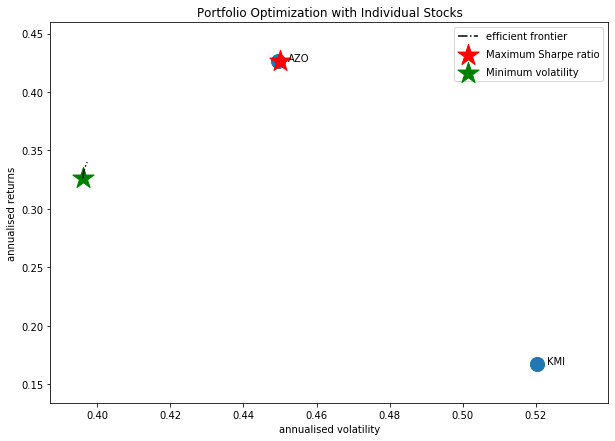

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'NEM', 'HP']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



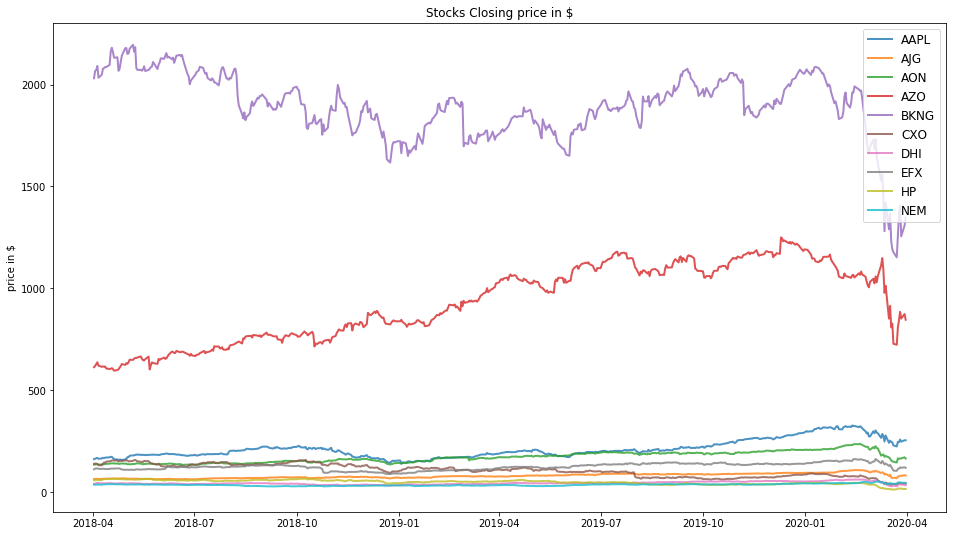

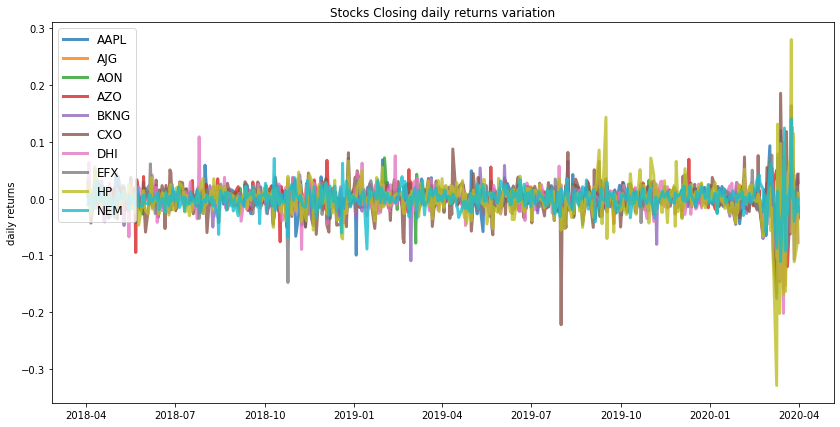

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.46
Annualised Volatility: 0.34


             AAPL  AJG  AON    AZO  BKNG  CXO  DHI  EFX   HP    NEM
allocation  47.96  0.0  0.1  25.38  0.0   0.0  0.0  0.0  0.0  26.56
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.24
Annualised Volatility: 0.29


            AAPL  AJG    AON    AZO  BKNG  CXO  DHI   EFX   HP    NEM
allocation  1.16  0.0  34.31  18.73  11.5  0.0  0.0  7.75  0.0  26.55


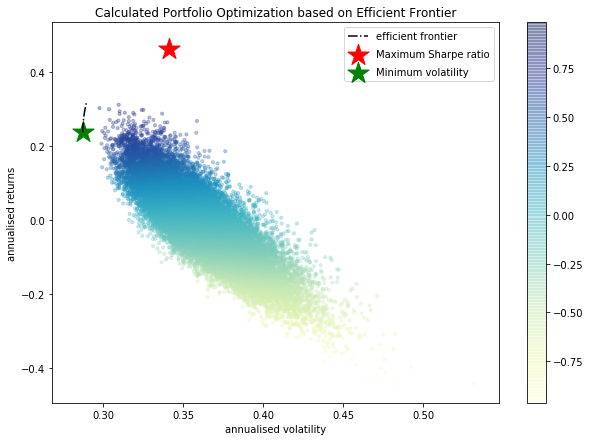

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
AZO : annuaised return 0.43 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
HP : annuaised return -0.97 , annualised volatility: 0.81
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


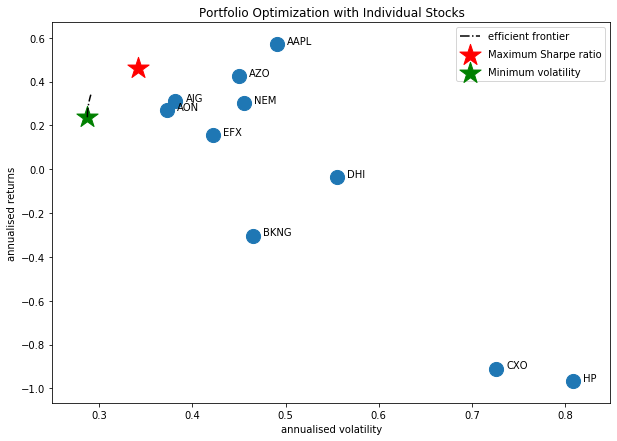

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'NEE', 'BKNG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'APC']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



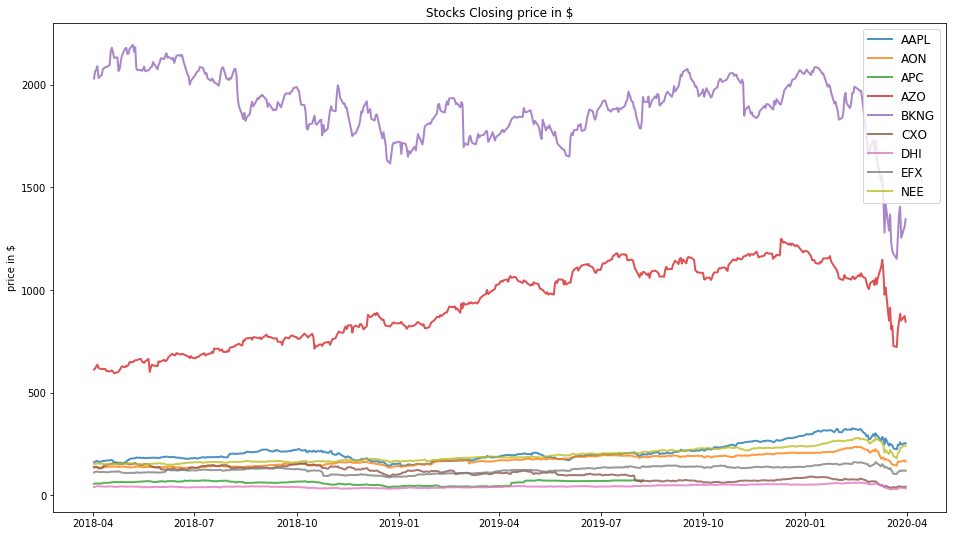

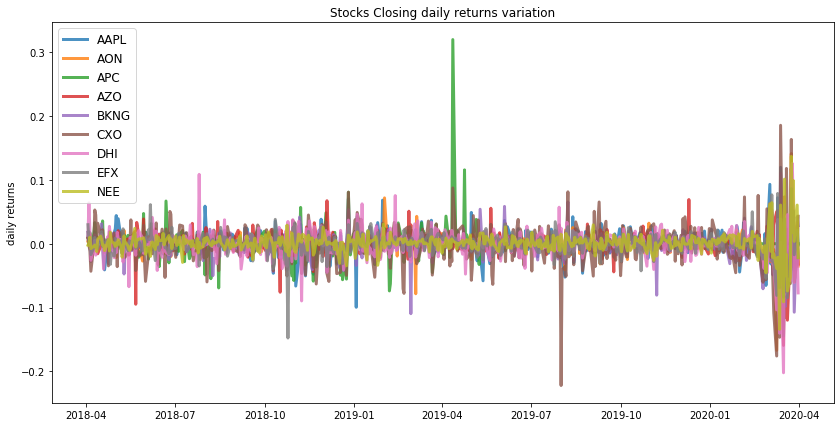

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.48
Annualised Volatility: 0.3


             AAPL  AON    APC   AZO  BKNG  CXO  DHI  EFX    NEE
allocation  19.83  0.0  22.85  7.76  0.0   0.0  0.0  0.0  49.56
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.35
Annualised Volatility: 0.27


            AAPL    AON    APC    AZO  BKNG  CXO  DHI   EFX    NEE
allocation  0.0   25.08  25.09  14.58  4.31  0.0  0.0  6.17  24.76


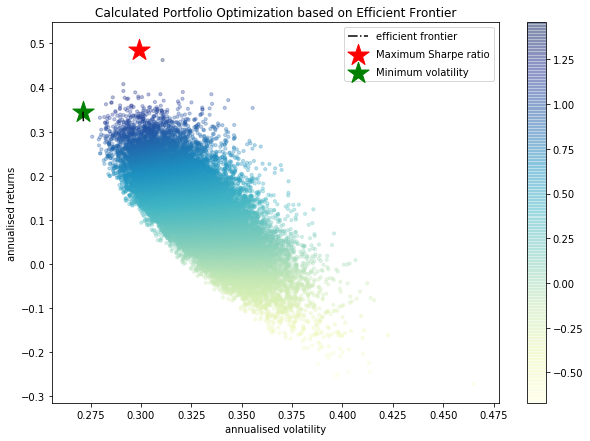

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AON : annuaised return 0.27 , annualised volatility: 0.37
APC : annuaised return 0.36 , annualised volatility: 0.5
AZO : annuaised return 0.43 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
NEE : annuaised return 0.52 , annualised volatility: 0.38
--------------------------------------------------------------------------------


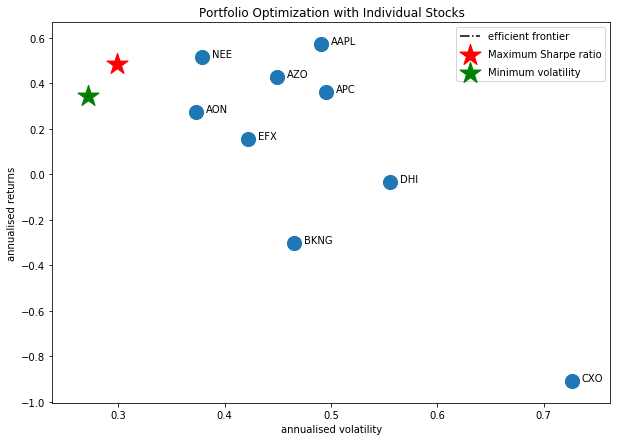

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



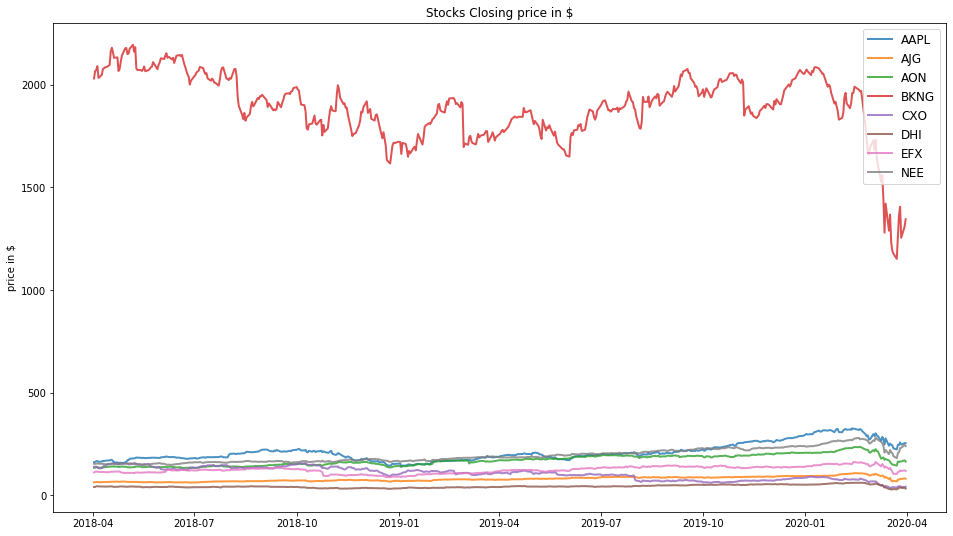

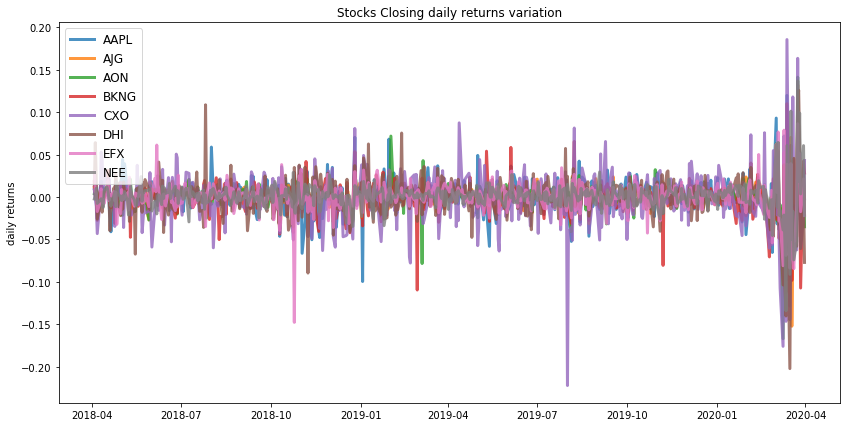

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.53
Annualised Volatility: 0.36


             AAPL  AJG  AON  BKNG  CXO  DHI  EFX    NEE
allocation  34.16  0.0  0.0  0.0   0.0  0.0  0.0  65.84
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.26
Annualised Volatility: 0.31


            AAPL  AJG    AON   BKNG  CXO   DHI   EFX    NEE
allocation  0.0   0.0  37.21  13.32  0.0  0.22  14.2  35.05


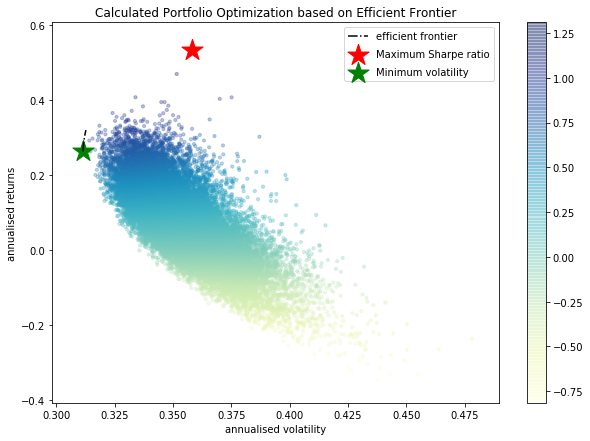

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
NEE : annuaised return 0.52 , annualised volatility: 0.38
--------------------------------------------------------------------------------


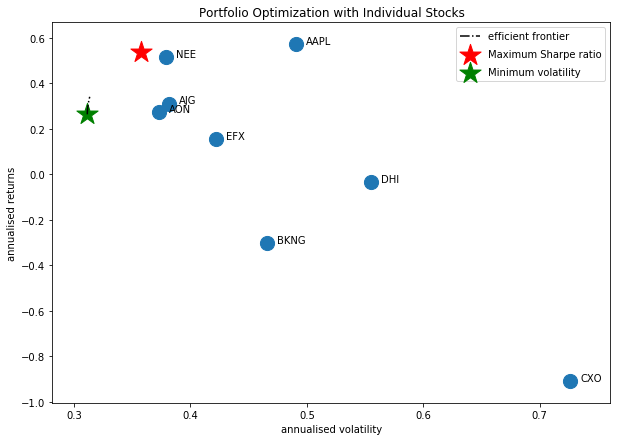

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['NEE', 'AJG', 'EFX', 'AAPL', 'CBS', 'AON', 'DHI', 'CXO']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



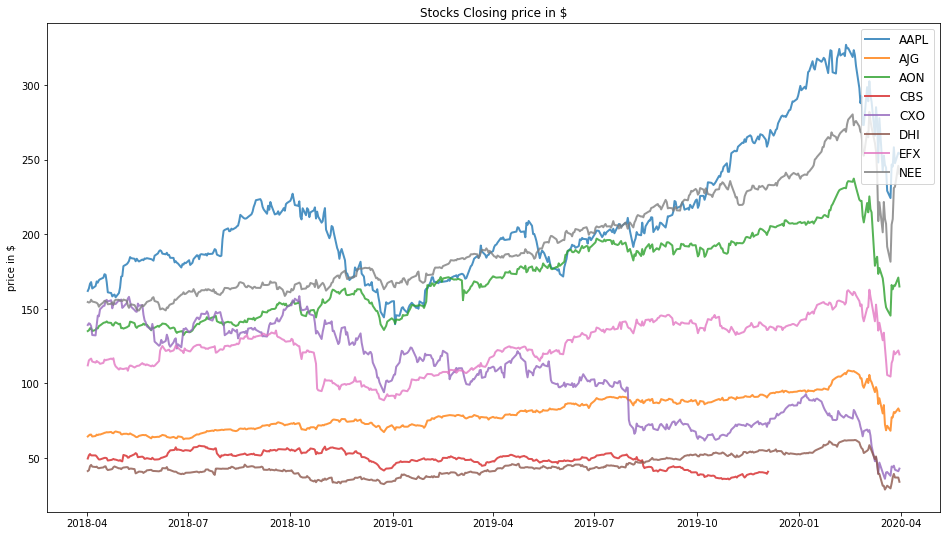

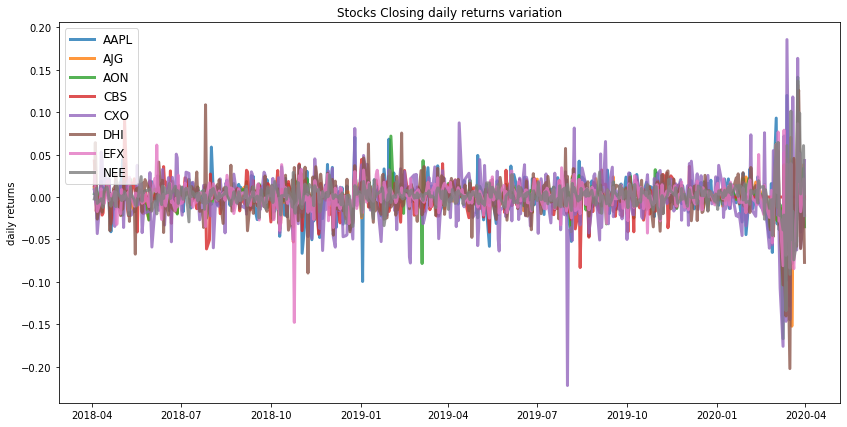

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.53
Annualised Volatility: 0.36


             AAPL  AJG  AON  CBS  CXO  DHI  EFX    NEE
allocation  34.14  0.0  0.0  0.0  0.0  0.0  0.0  65.86
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.16
Annualised Volatility: 0.25


            AAPL  AJG    AON    CBS  CXO   DHI   EFX    NEE
allocation  0.0   0.0  18.65  45.13  0.0  0.52  4.49  31.21


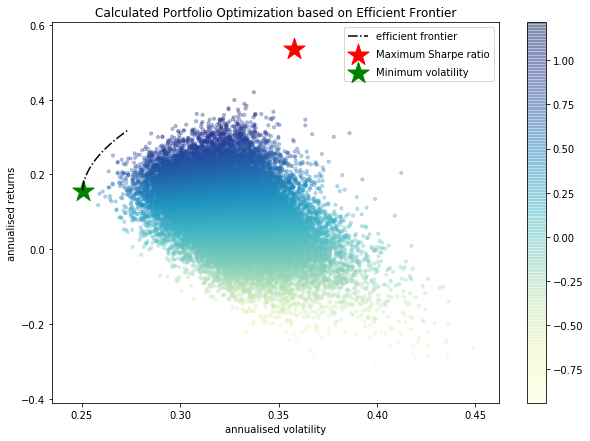

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
CBS : annuaised return -0.14 , annualised volatility: 0.35
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
NEE : annuaised return 0.52 , annualised volatility: 0.38
--------------------------------------------------------------------------------


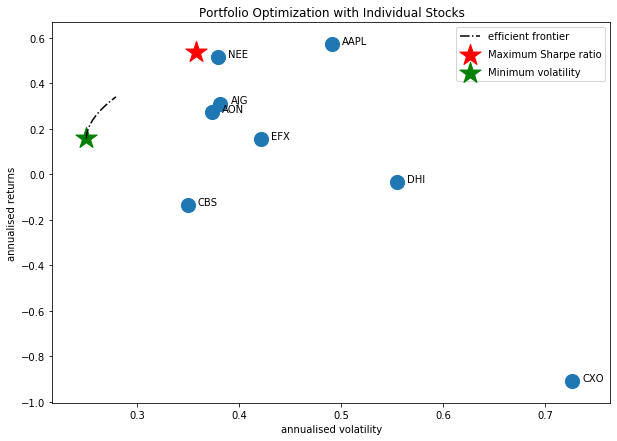

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'BAC']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



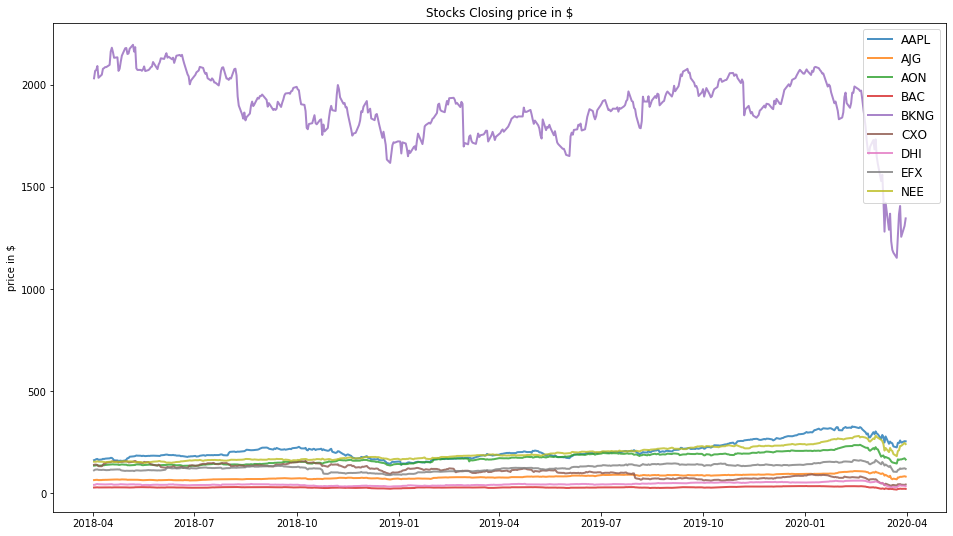

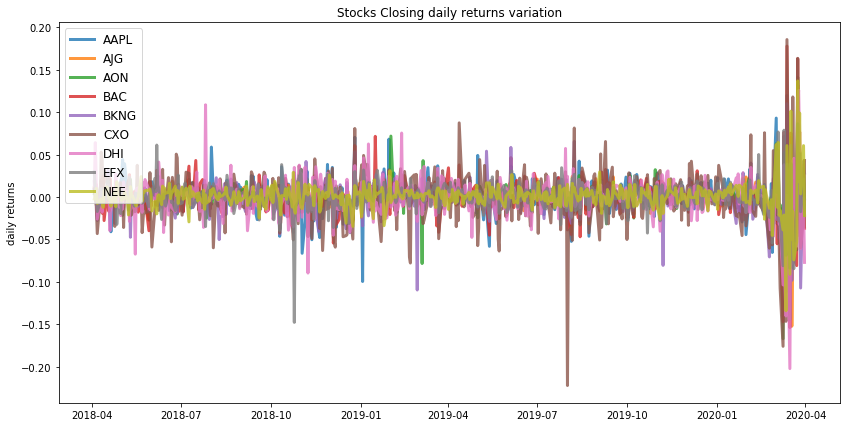

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.53
Annualised Volatility: 0.36


             AAPL  AJG  AON  BAC  BKNG  CXO  DHI  EFX    NEE
allocation  34.18  0.0  0.0  0.0  0.0   0.0  0.0  0.0  65.82
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.26
Annualised Volatility: 0.31


            AAPL  AJG    AON  BAC  BKNG  CXO   DHI    EFX    NEE
allocation  0.0   0.0  37.24  0.0  13.3  0.0  0.22  14.22  35.02


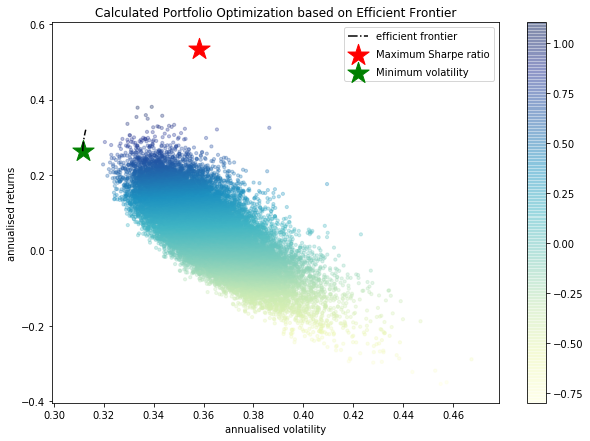

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
BAC : annuaised return -0.14 , annualised volatility: 0.52
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
NEE : annuaised return 0.52 , annualised volatility: 0.38
--------------------------------------------------------------------------------


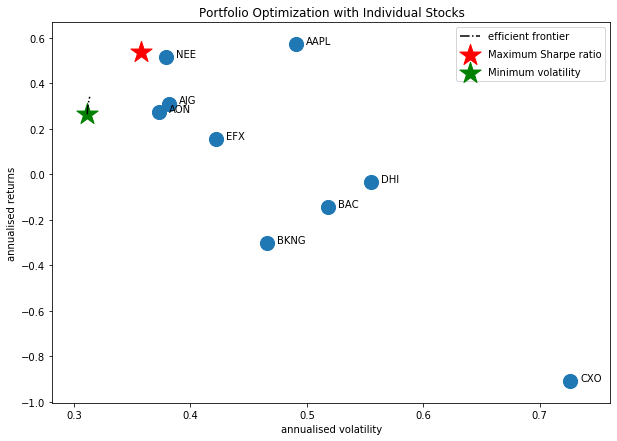

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['EMR', 'NEE']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



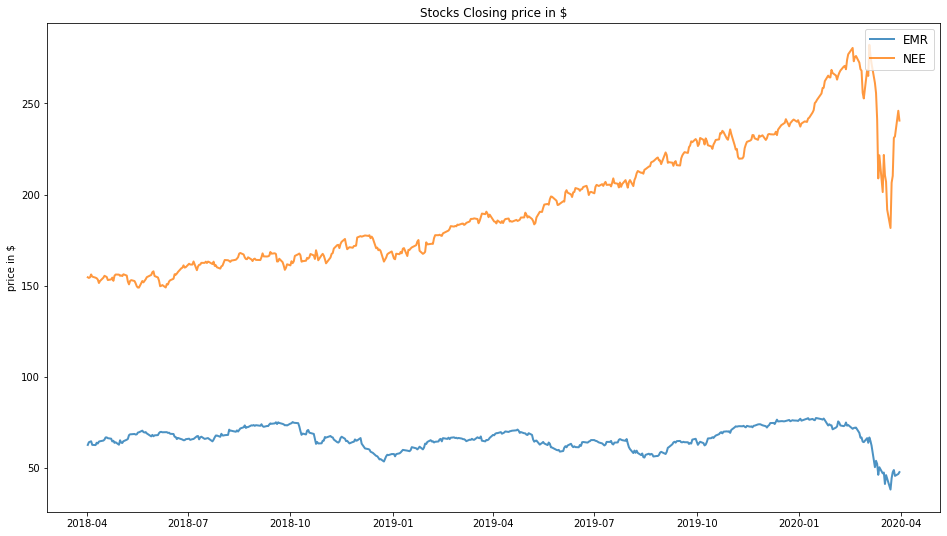

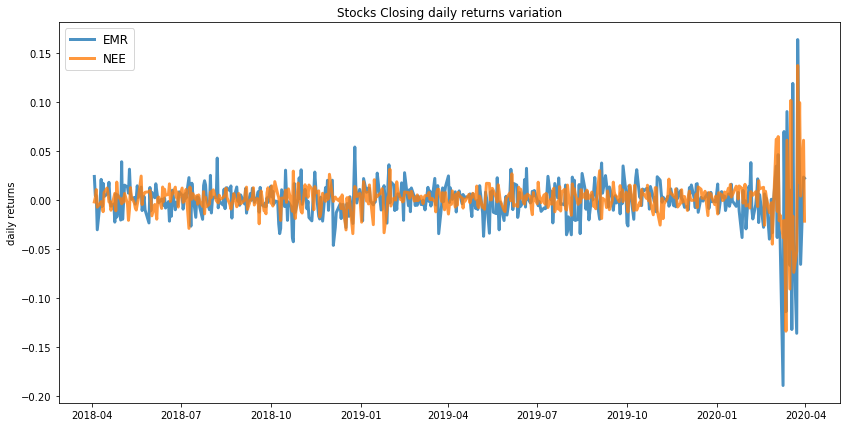

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.52
Annualised Volatility: 0.38


            EMR    NEE
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.35
Annualised Volatility: 0.36


              EMR    NEE
allocation  24.83  75.17


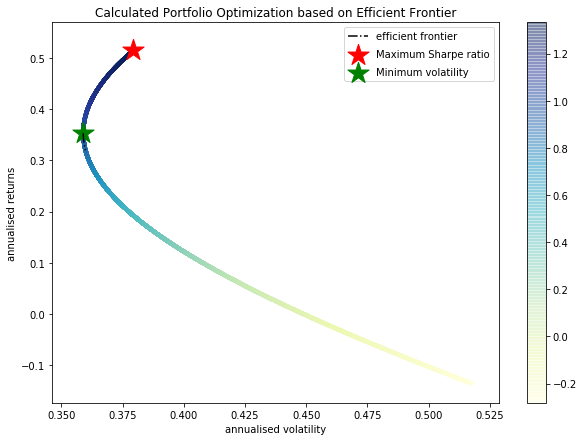

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

EMR : annuaised return -0.14 , annualised volatility: 0.52
NEE : annuaised return 0.52 , annualised volatility: 0.38
--------------------------------------------------------------------------------


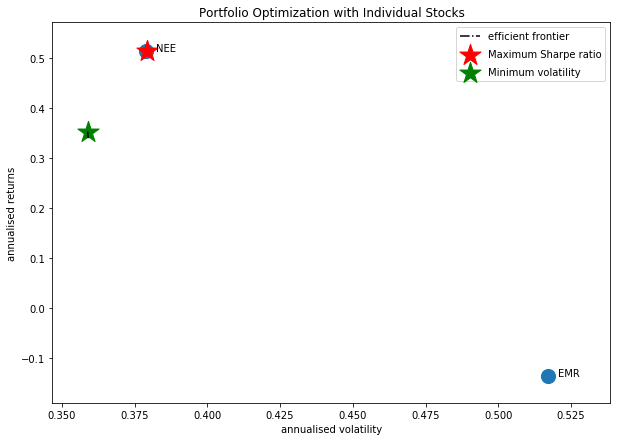

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'AZO', 'NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'NEM', 'BAC']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



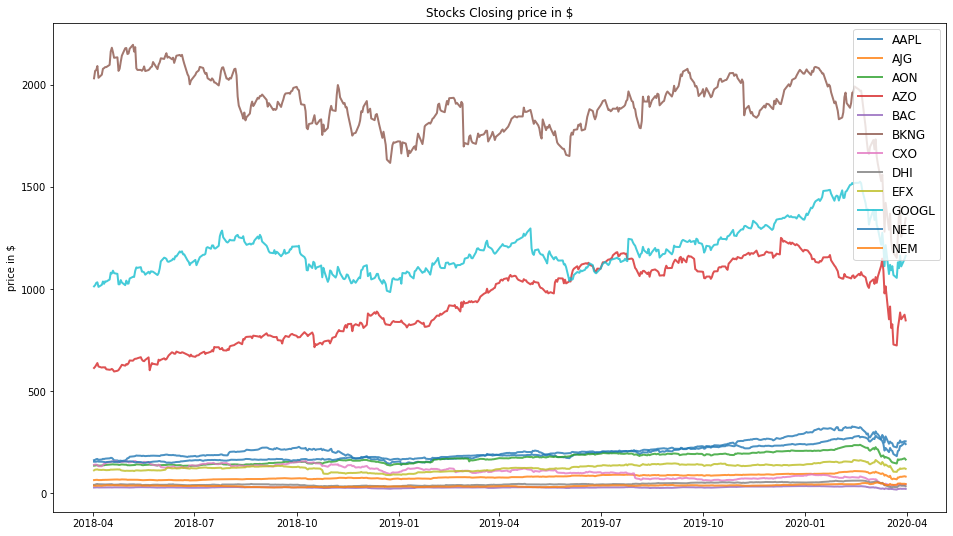

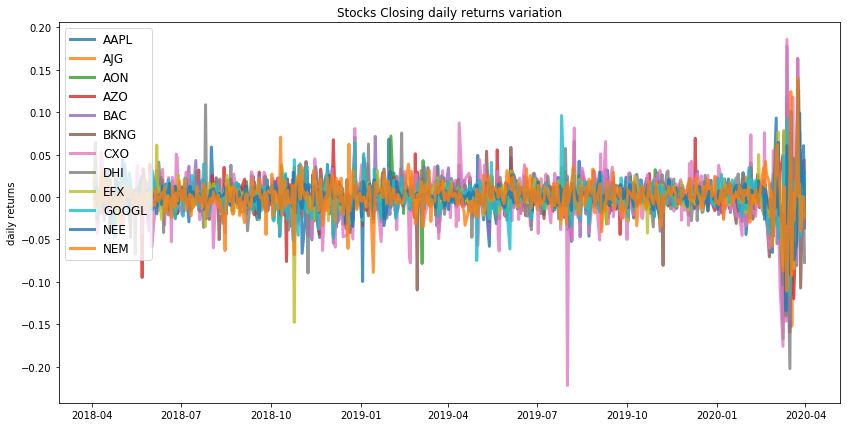

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.5
Annualised Volatility: 0.33


             AAPL  AJG  AON   AZO  BAC  BKNG  CXO  DHI  EFX  GOOGL   NEE  \
allocation  29.67  0.0  0.0  7.91  0.0  0.0   0.0  0.0  0.0  0.0    49.7   

              NEM  
allocation  12.71  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.31
Annualised Volatility: 0.28


            AAPL  AJG   AON    AZO  BAC  BKNG  CXO  DHI   EFX  GOOGL    NEE  \
allocation  0.0   0.0  27.0  13.39  0.0  3.26  0.0  0.0  2.26  16.0   13.89   

              NEM  
allocation  24.21  


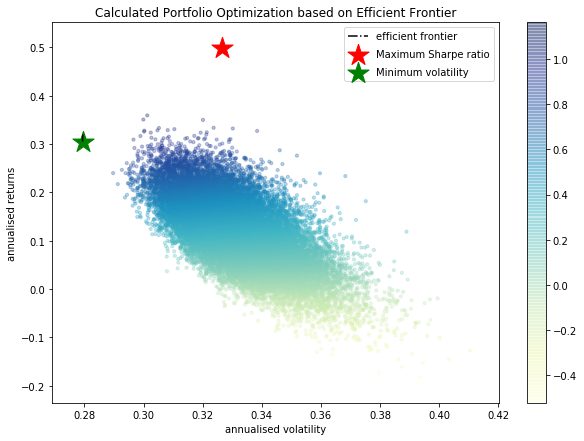

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
AZO : annuaised return 0.43 , annualised volatility: 0.45
BAC : annuaised return -0.14 , annualised volatility: 0.52
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
NEE : annuaised return 0.52 , annualised volatility: 0.38
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


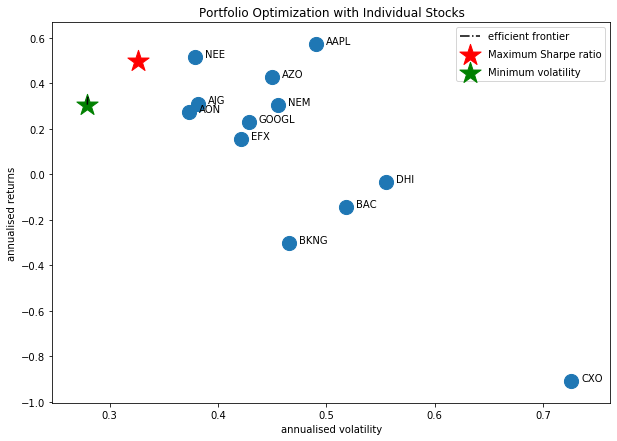

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AZO', 'NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'HP']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



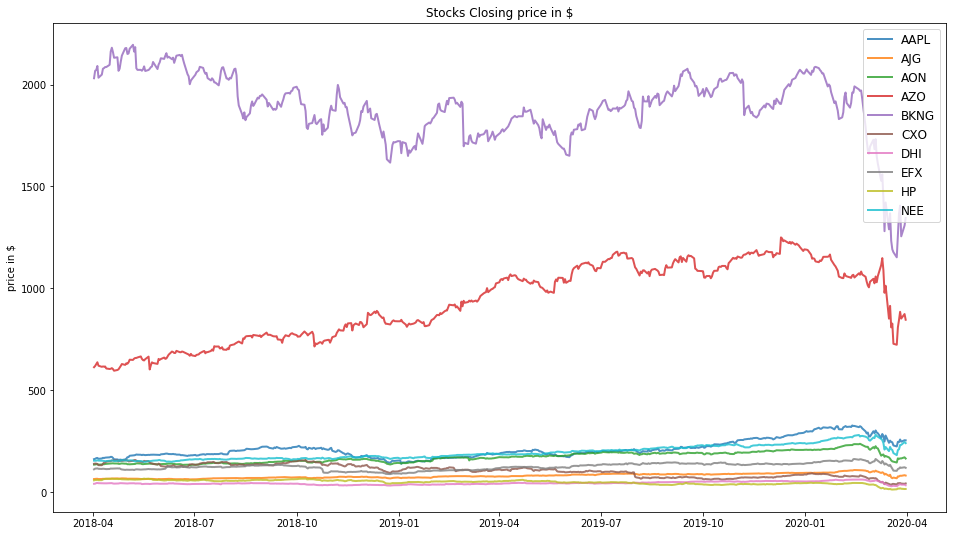

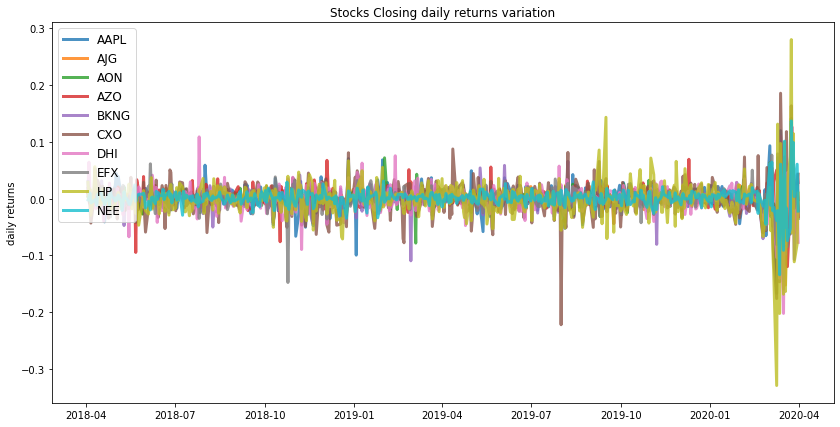

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.52
Annualised Volatility: 0.35


             AAPL  AJG  AON   AZO  BKNG  CXO  DHI  EFX   HP    NEE
allocation  30.93  0.0  0.0  9.63  0.0   0.0  0.0  0.0  0.0  59.44
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.3
Annualised Volatility: 0.3


            AAPL  AJG    AON    AZO  BKNG  CXO  DHI    EFX   HP    NEE
allocation  0.0   0.0  36.32  18.22  8.7   0.0  0.0  10.92  0.0  25.84


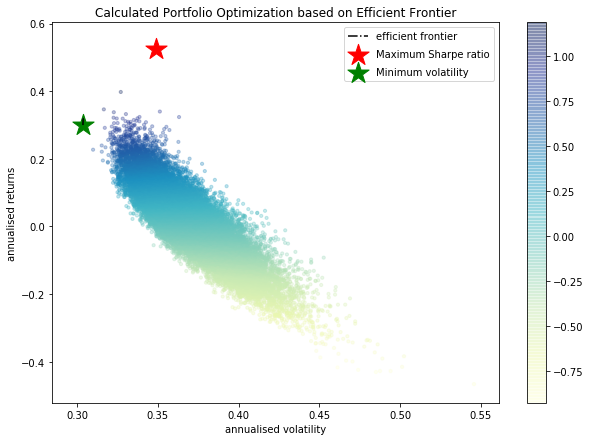

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
AZO : annuaised return 0.43 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
HP : annuaised return -0.97 , annualised volatility: 0.81
NEE : annuaised return 0.52 , annualised volatility: 0.38
--------------------------------------------------------------------------------


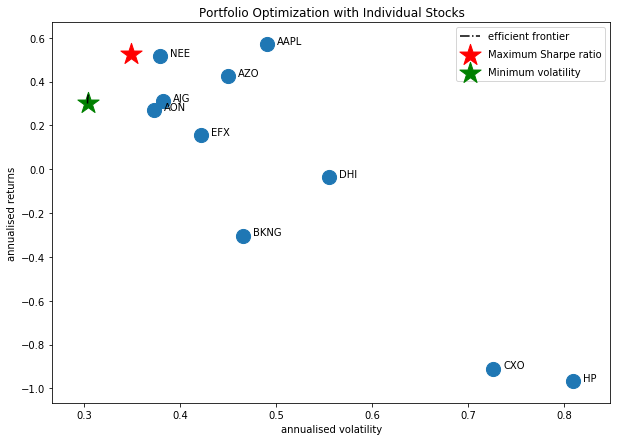

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BIIB', 'AJG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



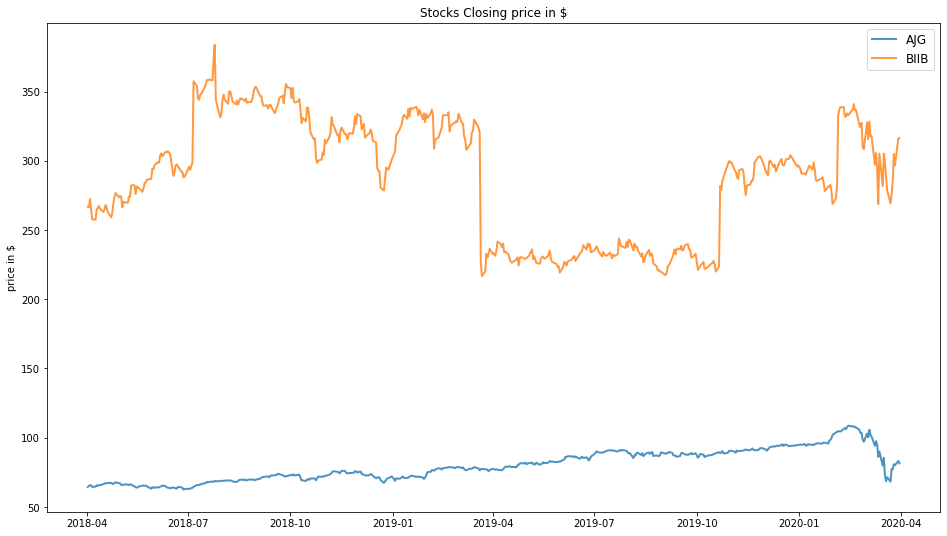

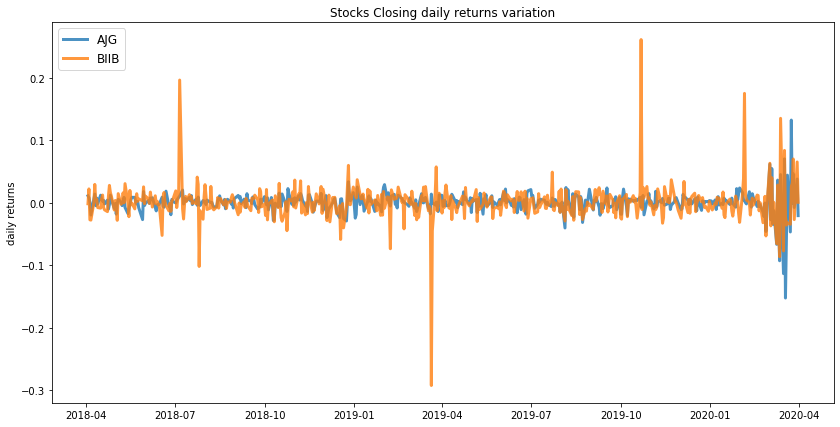

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.33
Annualised Volatility: 0.37


              AJG   BIIB
allocation  75.77  24.23
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.32
Annualised Volatility: 0.37


              AJG   BIIB
allocation  83.42  16.58


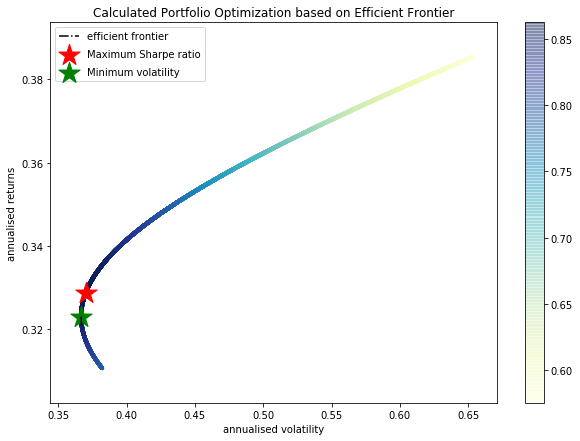

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AJG : annuaised return 0.31 , annualised volatility: 0.38
BIIB : annuaised return 0.39 , annualised volatility: 0.65
--------------------------------------------------------------------------------


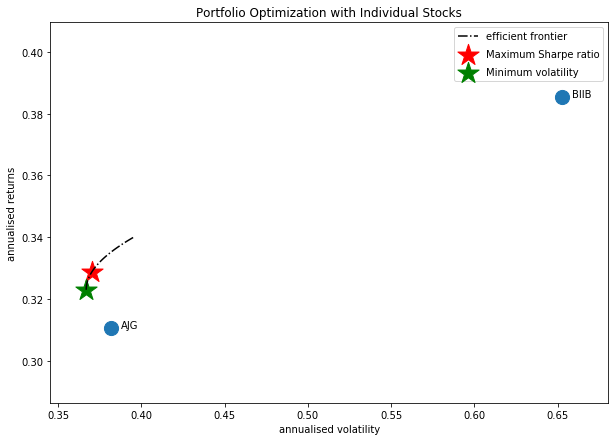

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'CBS', 'AON', 'DHI', 'CXO', 'NEM']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



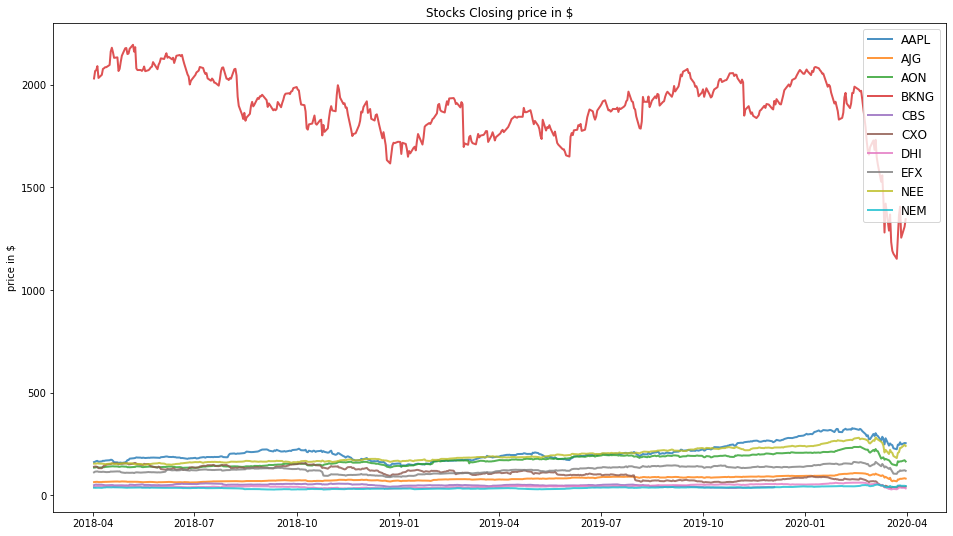

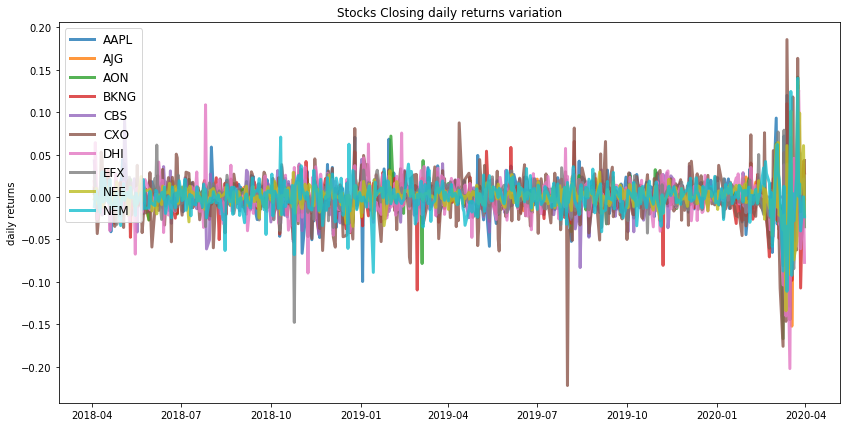

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.51
Annualised Volatility: 0.33


             AAPL  AJG  AON  BKNG  CBS  CXO  DHI  EFX    NEE    NEM
allocation  32.22  0.0  0.0  0.0   0.0  0.0  0.0  0.0  54.33  13.45
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.14
Annualised Volatility: 0.23


            AAPL  AJG    AON  BKNG    CBS  CXO  DHI  EFX    NEE    NEM
allocation  0.0   0.0  14.67  2.92  41.65  0.0  0.0  0.0  20.98  19.78


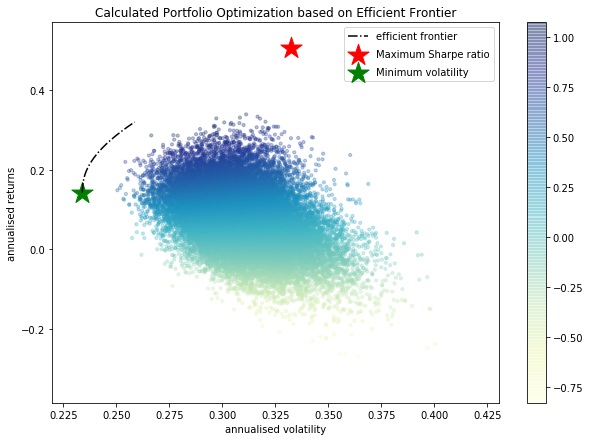

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CBS : annuaised return -0.14 , annualised volatility: 0.35
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
NEE : annuaised return 0.52 , annualised volatility: 0.38
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


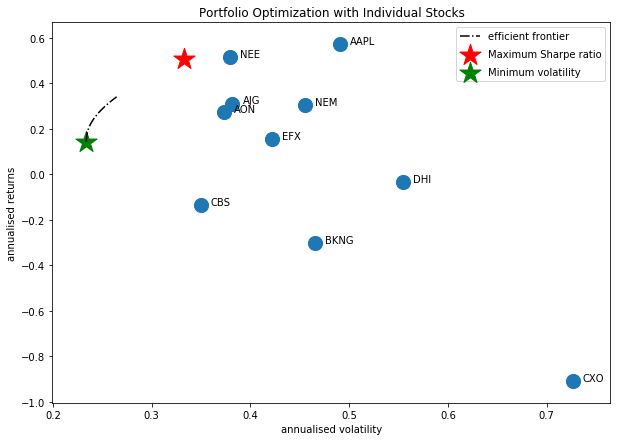

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMD', 'AJG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



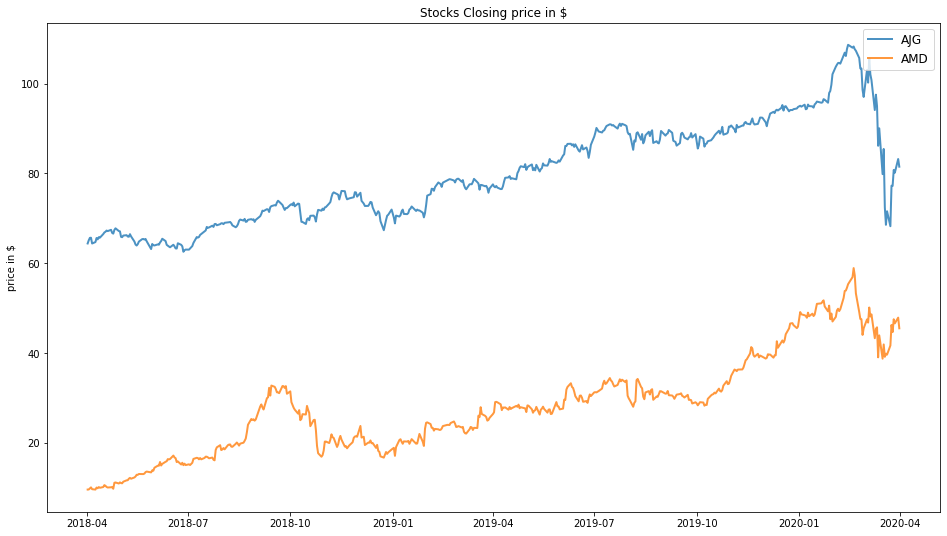

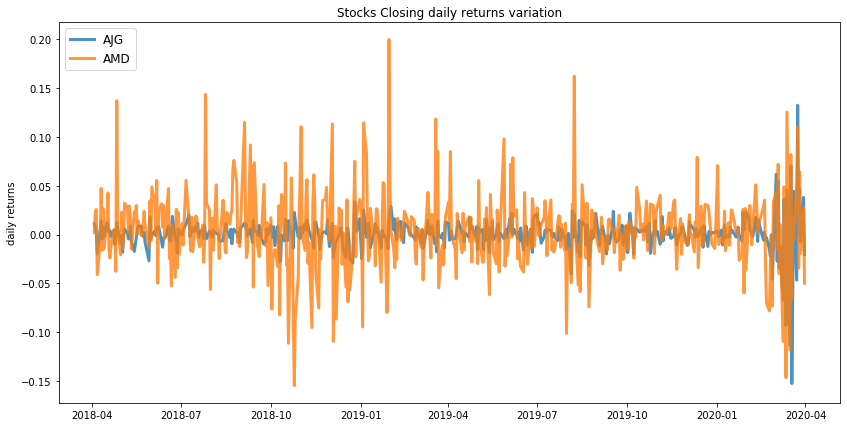

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 1.96
Annualised Volatility: 0.88


            AJG    AMD
allocation  0.0  100.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.32
Annualised Volatility: 0.38


              AJG   AMD
allocation  99.23  0.77


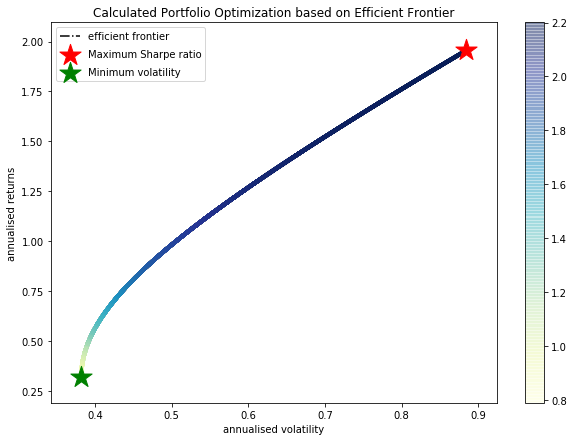

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AJG : annuaised return 0.31 , annualised volatility: 0.38
AMD : annuaised return 1.96 , annualised volatility: 0.88
--------------------------------------------------------------------------------


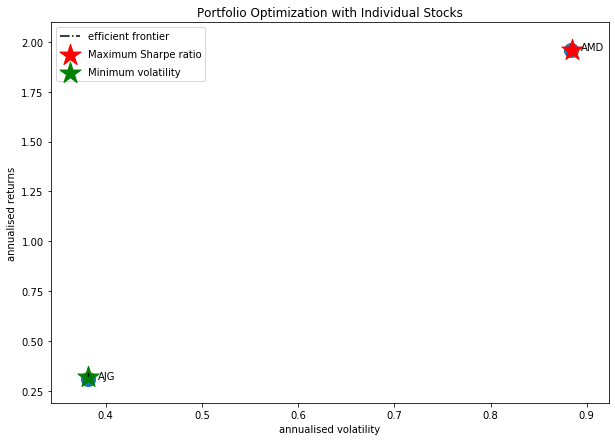

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'NEM']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



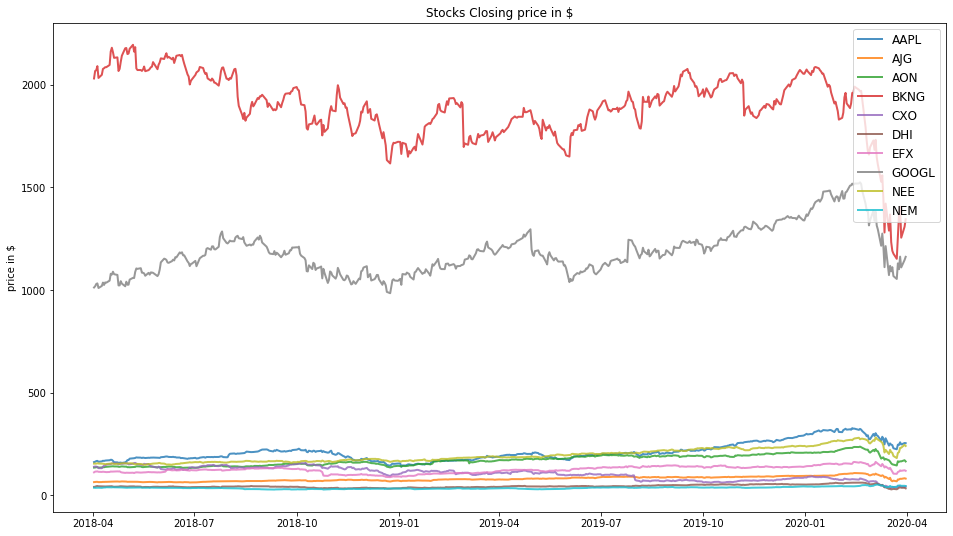

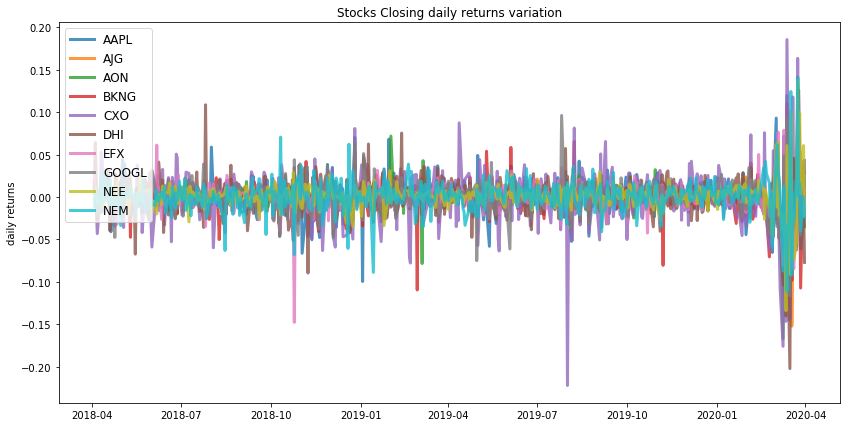

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.51
Annualised Volatility: 0.33


            AAPL  AJG  AON  BKNG  CXO  DHI  EFX  GOOGL    NEE    NEM
allocation  32.2  0.0  0.0  0.0   0.0  0.0  0.0  0.0    54.32  13.48
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.28
Annualised Volatility: 0.28


            AAPL  AJG    AON  BKNG  CXO  DHI   EFX  GOOGL    NEE    NEM
allocation  0.0   0.0  26.93  5.76  0.0  0.0  4.08  17.85  19.81  25.57


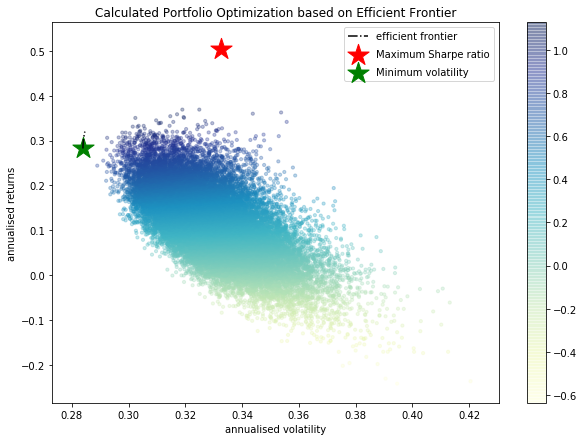

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
NEE : annuaised return 0.52 , annualised volatility: 0.38
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


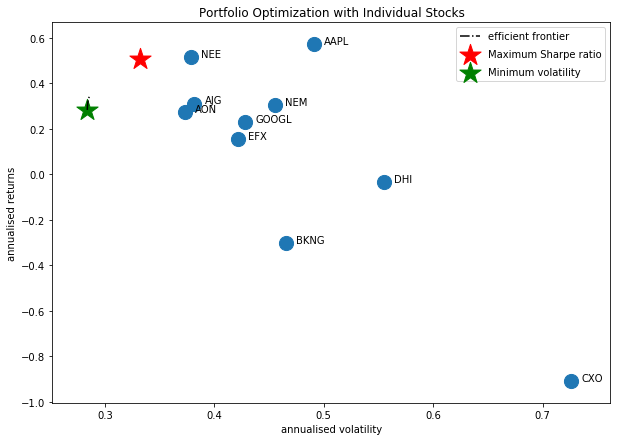

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['CMCSA', 'AJG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



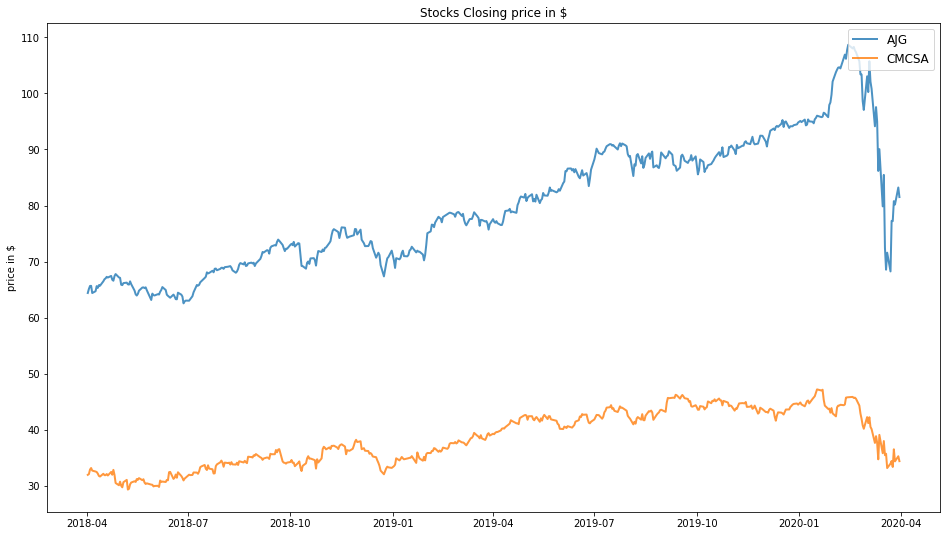

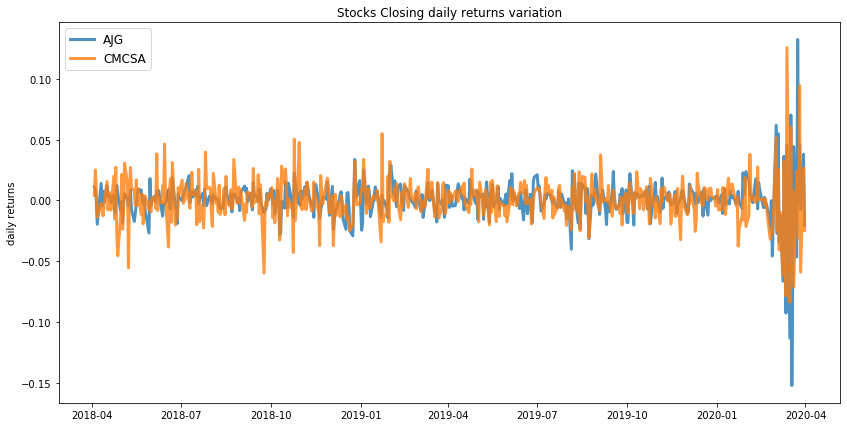

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.31
Annualised Volatility: 0.38


              AJG  CMCSA
allocation  100.0  0.0  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.25
Annualised Volatility: 0.34


              AJG  CMCSA
allocation  58.38  41.62


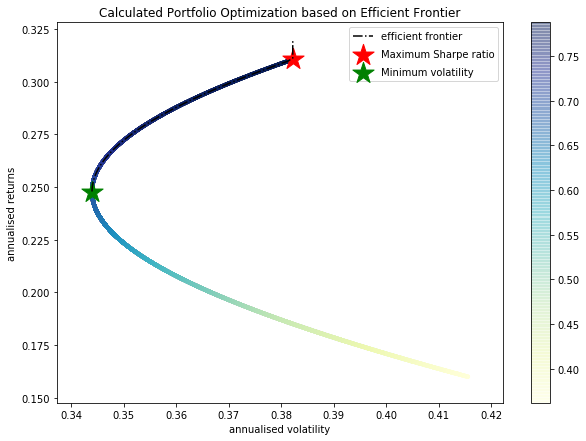

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AJG : annuaised return 0.31 , annualised volatility: 0.38
CMCSA : annuaised return 0.16 , annualised volatility: 0.42
--------------------------------------------------------------------------------


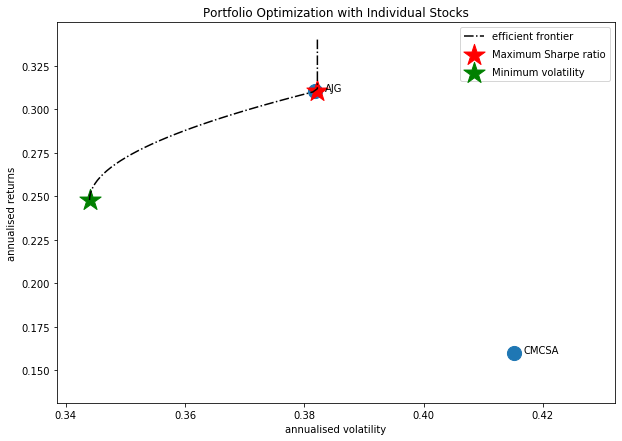

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['GOOGL', 'NEE', 'BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'BAC']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



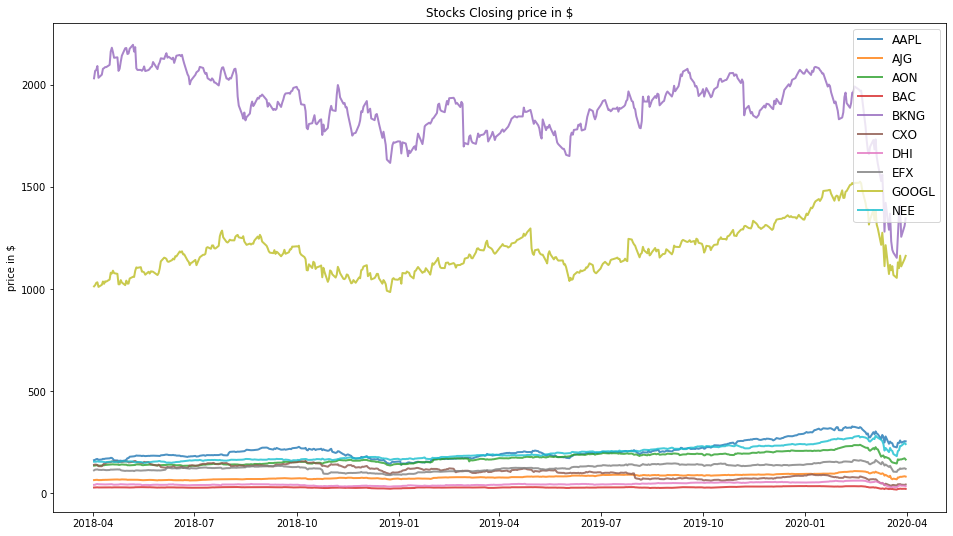

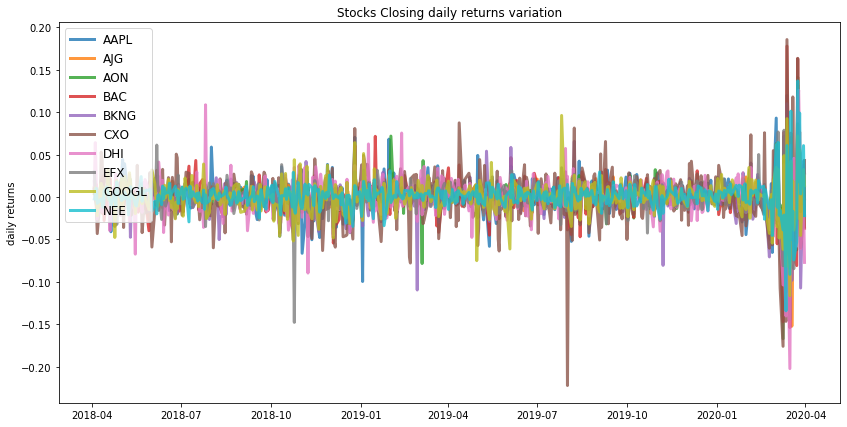

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.53
Annualised Volatility: 0.36


             AAPL  AJG  AON  BAC  BKNG  CXO  DHI  EFX  GOOGL    NEE
allocation  34.16  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0    65.84
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.3
Annualised Volatility: 0.31


            AAPL  AJG    AON  BAC  BKNG  CXO  DHI    EFX  GOOGL    NEE
allocation  0.0   0.0  33.57  0.0  5.99  0.0  0.0  10.82  16.54  33.09


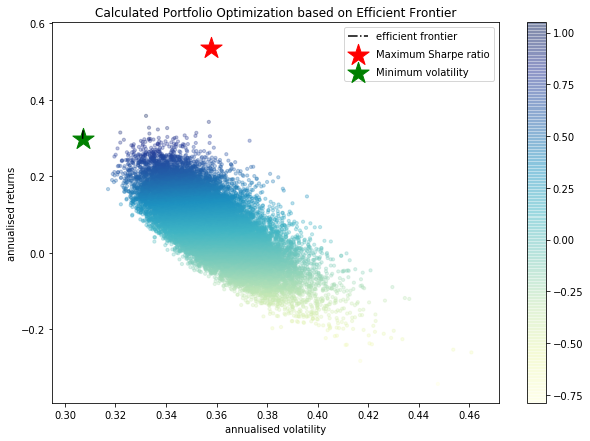

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
BAC : annuaised return -0.14 , annualised volatility: 0.52
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
GOOGL : annuaised return 0.23 , annualised volatility: 0.43
NEE : annuaised return 0.52 , annualised volatility: 0.38
--------------------------------------------------------------------------------


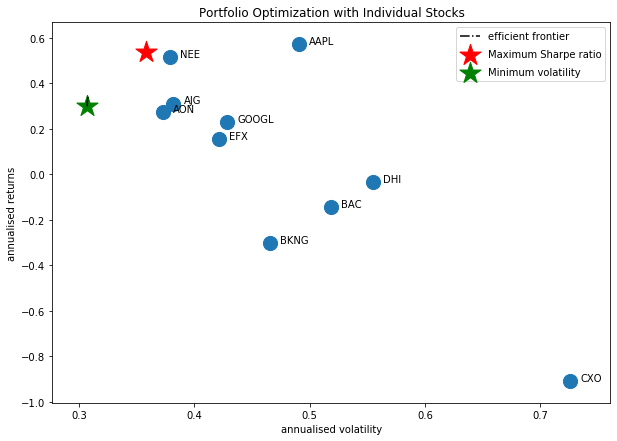

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BKNG', 'AJG', 'EFX', 'AAPL', 'AON', 'DHI', 'CXO', 'HP']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



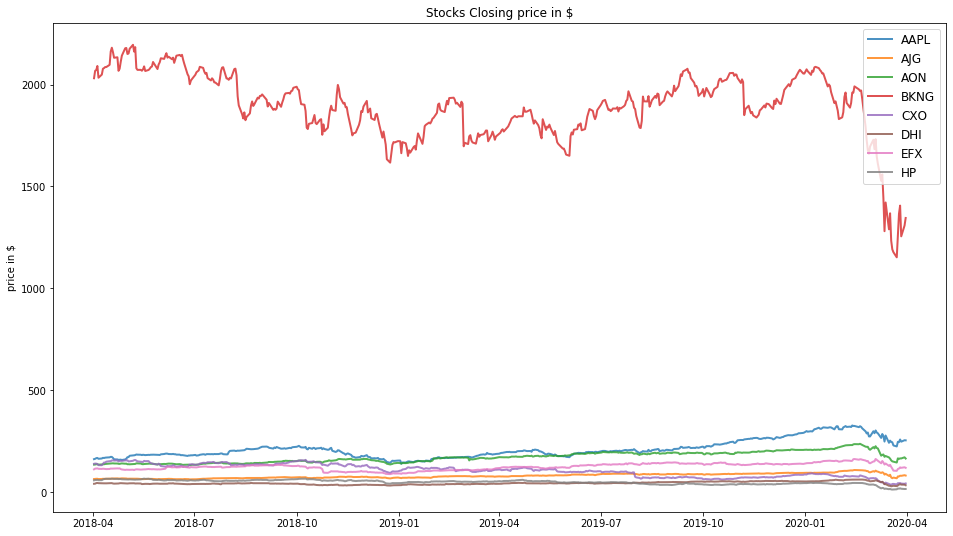

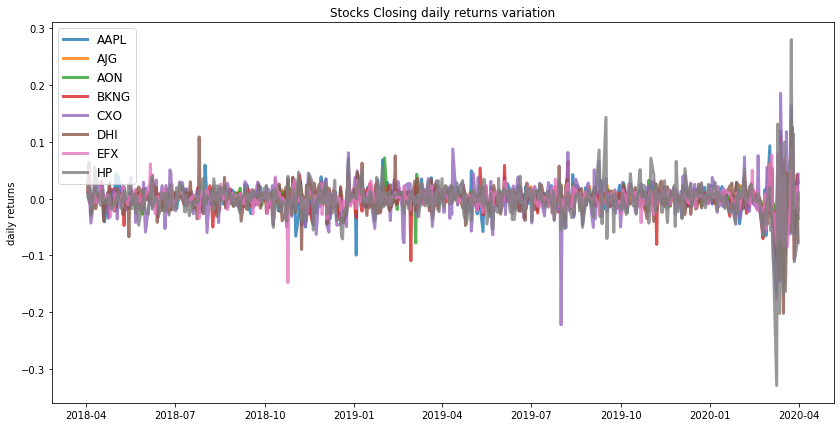

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.51
Annualised Volatility: 0.44


             AAPL    AJG   AON  BKNG  CXO  DHI  EFX   HP
allocation  78.62  16.02  5.36  0.0   0.0  0.0  0.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.14
Annualised Volatility: 0.33


            AAPL    AJG    AON   BKNG  CXO   DHI    EFX   HP
allocation  0.0   14.33  41.65  16.49  0.0  4.62  22.91  0.0


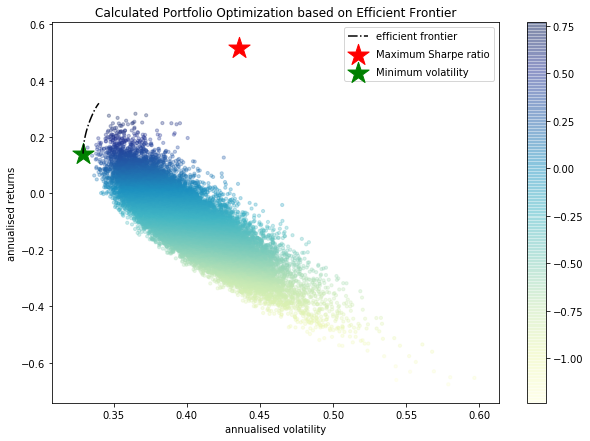

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
AON : annuaised return 0.27 , annualised volatility: 0.37
BKNG : annuaised return -0.3 , annualised volatility: 0.47
CXO : annuaised return -0.91 , annualised volatility: 0.73
DHI : annuaised return -0.03 , annualised volatility: 0.55
EFX : annuaised return 0.15 , annualised volatility: 0.42
HP : annuaised return -0.97 , annualised volatility: 0.81
--------------------------------------------------------------------------------


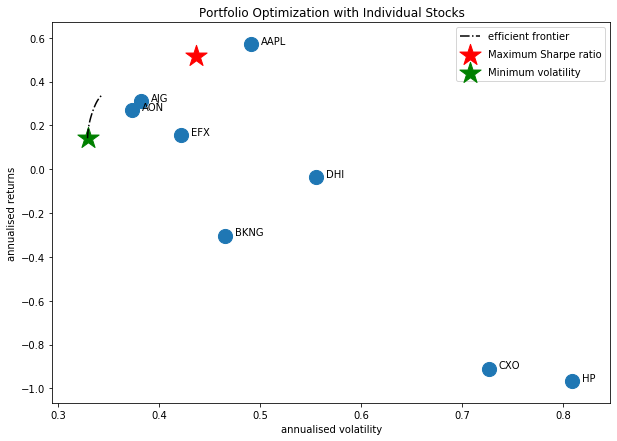

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['BMY', 'AJG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



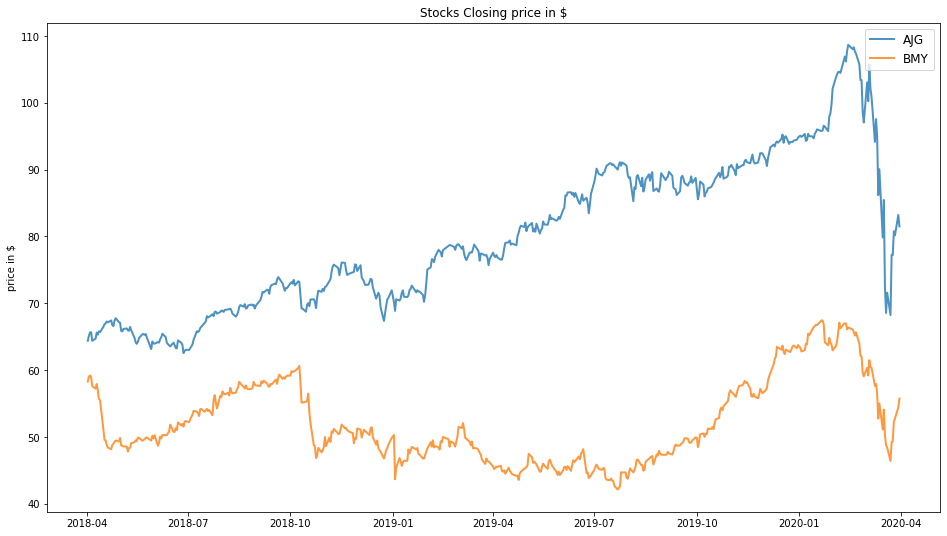

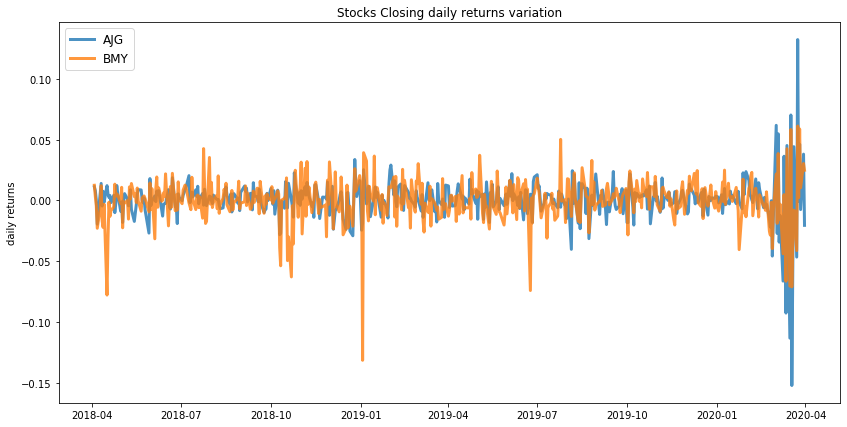

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.31
Annualised Volatility: 0.38


              AJG  BMY
allocation  100.0  0.0
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.19
Annualised Volatility: 0.34


              AJG    BMY
allocation  54.87  45.13


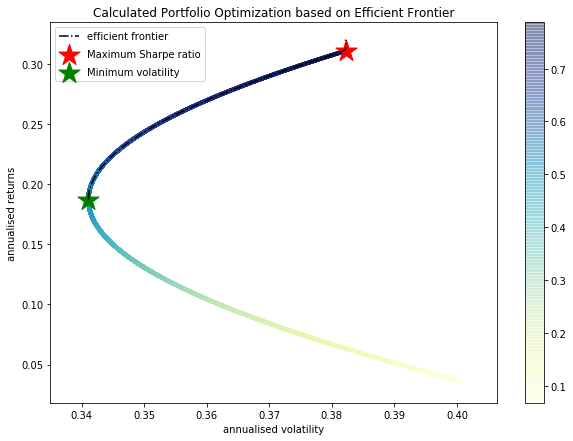

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AJG : annuaised return 0.31 , annualised volatility: 0.38
BMY : annuaised return 0.04 , annualised volatility: 0.4
--------------------------------------------------------------------------------


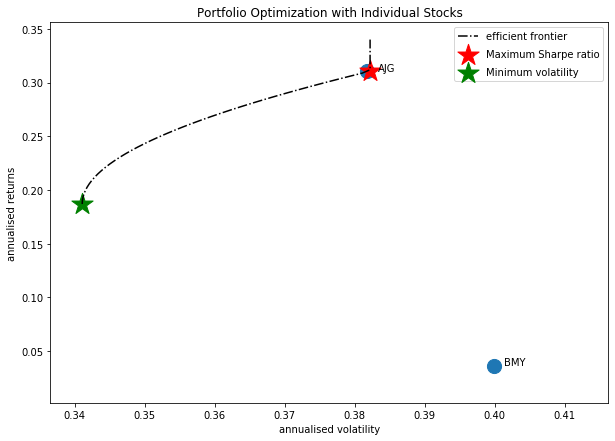

perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AJG', 'EFX', 'AAPL', 'CBS', 'CXO', 'NEM']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



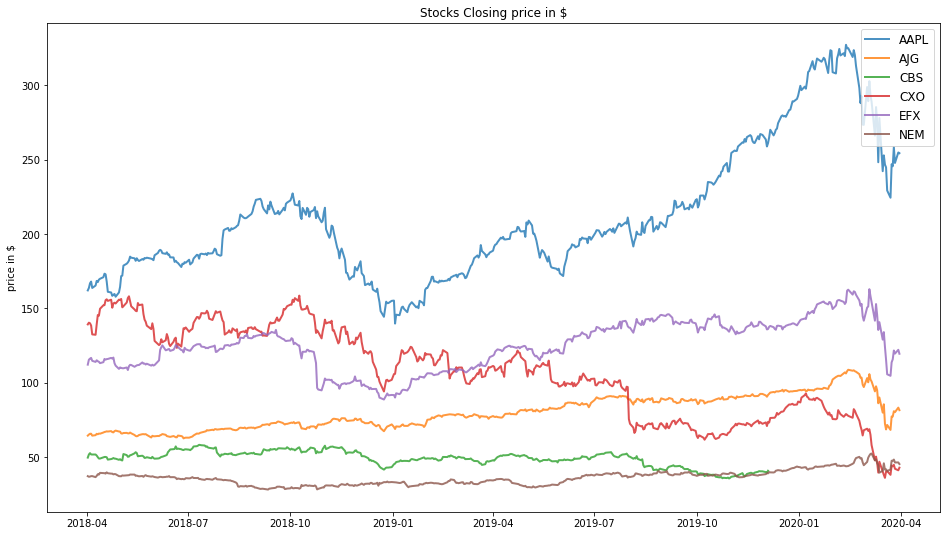

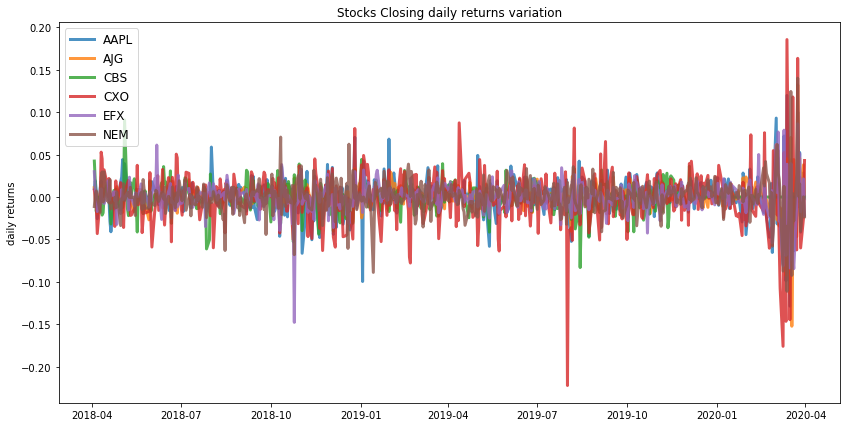

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.47
Annualised Volatility: 0.37


             AAPL   AJG  CBS  CXO  EFX    NEM
allocation  63.63  2.12  0.0  0.0  0.0  34.25
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.1
Annualised Volatility: 0.25


            AAPL    AJG    CBS  CXO   EFX    NEM
allocation  2.29  20.86  45.38  0.0  6.32  25.14


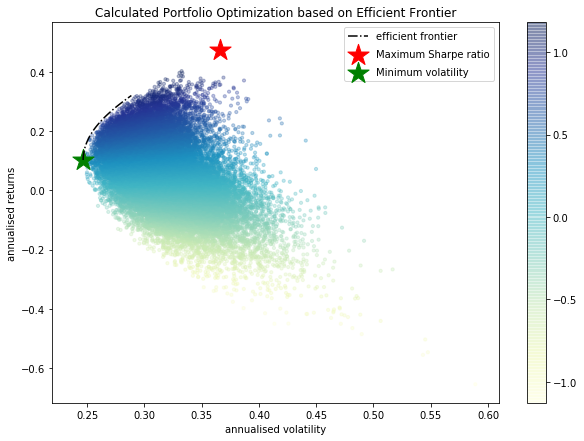

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AAPL : annuaised return 0.57 , annualised volatility: 0.49
AJG : annuaised return 0.31 , annualised volatility: 0.38
CBS : annuaised return -0.14 , annualised volatility: 0.35
CXO : annuaised return -0.91 , annualised volatility: 0.73
EFX : annuaised return 0.15 , annualised volatility: 0.42
NEM : annuaised return 0.3 , annualised volatility: 0.46
--------------------------------------------------------------------------------


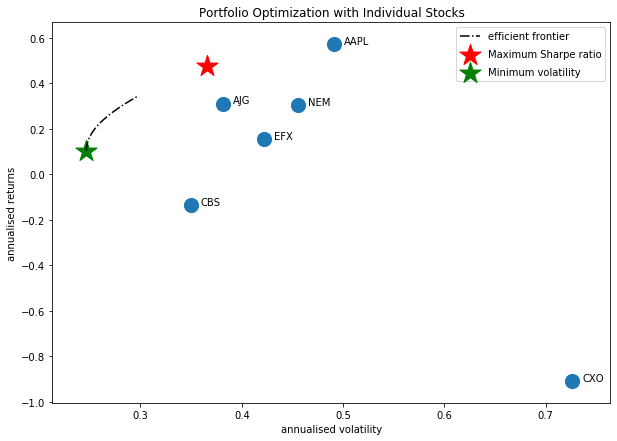

In [82]:
returns_sharpe_company_list = []
start_date = "2018-04-01"
end_date = "2020-04-01"
risk_free_rate = 0.0095
#generate the stocks pairs which are uncorrelated and having covariance less than mean covariance 
stocks_pair = get_portfolio_pairs(portfolio_list)
#print(stocks_pair)
for stock_list in stocks_pair:
    print("perform efficient_frontier_stock_portfolio Pairs of the companies we got {}".format(stock_list))
    pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = efficient_frontier_stock_portfolio(stock_list, len(stock_list), risk_free_rate, start_date, end_date)
    returns_sharpe_company_list.append([pos_sharpe, Annualised_Return, Annualised_Volatility, stock_list, allocation_weights])

In [83]:
shortlisted_portfolio_df = pd.DataFrame(returns_sharpe_company_list)

In [84]:
shortlisted_portfolio_df.columns = ["Sharpe Ratio", "Portfolio Annualised Return", "Portfolio Annualised_Volatility", "Stock Portfolio", "Stocks Weight Allocation"]

In [85]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation
0,1.294217,0.54,0.41,"[EQIX, KMI, AJG]","[[6.13, 93.87, 0.0]]"
1,1.292807,0.56,0.42,"[EQIX, AOS]","[[0.0, 100.0]]"
2,1.360744,0.55,0.40,"[EQIX, ADBE]","[[27.2, 72.8]]"
3,1.066107,0.40,0.36,"[AMZN, AJG]","[[41.0, 59.0]]"
4,0.980189,0.46,0.46,"[AMZN, AOS]","[[100.0, 0.0]]"
5,1.330660,0.46,0.34,"[GOOGL, AZO, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[47.95, 0.0, 0.1, 25.36, 0.0, 0.0, 0.0, 0.0, 0.0, 26.59]]"
6,1.496493,0.50,0.33,"[GOOGL, AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[29.66, 0.0, 0.0, 7.89, 0.0, 0.0, 0.0, 0.0, 0.0, 49.73, 12.72]]"
7,1.270199,0.47,0.36,"[GOOGL, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[63.22, 0.97, 1.72, 0.0, 0.0, 0.0, 0.0, 0.0, 34.09]]"
8,1.270123,0.47,0.37,"[GOOGL, BKNG, AJG, EFX, AAPL, DHI, CXO, NEM, BAC]","[[63.63, 2.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.27]]"
9,1.460374,0.52,0.35,"[GOOGL, CTXS]","[[100.0, 0.0]]"


In [86]:
# creating a blank series 
Portfolio_Tag = pd.Series([]) 

for row in range(len(shortlisted_portfolio_df)):
    if (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 3):
        Portfolio_Tag[row] = "Excellent"
    elif (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 2 and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 3)):
        Portfolio_Tag[row] = "Very Good"
    elif ((shortlisted_portfolio_df["Sharpe Ratio"][row] >= 1)  and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 2)):
        Portfolio_Tag[row] = "Good"
    else:
        Portfolio_Tag[row] = "Bad"
        
# inserting new column with values of list made above         
shortlisted_portfolio_df.insert(5, "Portfolio Tag", Portfolio_Tag) 

/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [87]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
0,1.294217,0.54,0.41,"[EQIX, KMI, AJG]","[[6.13, 93.87, 0.0]]",Good
1,1.292807,0.56,0.42,"[EQIX, AOS]","[[0.0, 100.0]]",Good
2,1.360744,0.55,0.40,"[EQIX, ADBE]","[[27.2, 72.8]]",Good
3,1.066107,0.40,0.36,"[AMZN, AJG]","[[41.0, 59.0]]",Good
4,0.980189,0.46,0.46,"[AMZN, AOS]","[[100.0, 0.0]]",Bad
5,1.330660,0.46,0.34,"[GOOGL, AZO, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[47.95, 0.0, 0.1, 25.36, 0.0, 0.0, 0.0, 0.0, 0.0, 26.59]]",Good
6,1.496493,0.50,0.33,"[GOOGL, AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[29.66, 0.0, 0.0, 7.89, 0.0, 0.0, 0.0, 0.0, 0.0, 49.73, 12.72]]",Good
7,1.270199,0.47,0.36,"[GOOGL, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[63.22, 0.97, 1.72, 0.0, 0.0, 0.0, 0.0, 0.0, 34.09]]",Good
8,1.270123,0.47,0.37,"[GOOGL, BKNG, AJG, EFX, AAPL, DHI, CXO, NEM, BAC]","[[63.63, 2.1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 34.27]]",Good
9,1.460374,0.52,0.35,"[GOOGL, CTXS]","[[100.0, 0.0]]",Good


In [88]:
shortlisted_portfolio = shortlisted_portfolio_df[(shortlisted_portfolio_df["Portfolio Tag"] == "Excellent") | (shortlisted_portfolio_df["Portfolio Tag"] == "Very Good") |
                                                    (shortlisted_portfolio_df["Portfolio Tag"] == "Good")]

In [89]:
shortlisted_portfolio = shortlisted_portfolio.sort_values(by="Sharpe Ratio", ascending=False)

In [90]:
shortlisted_portfolio

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
23,2.201053,1.96,0.88,"[AMD, AJG]","[[0.0, 100.0]]",Very Good
14,1.590443,0.48,0.30,"[AZO, NEE, BKNG, EFX, AAPL, AON, DHI, CXO, APC]","[[19.83, 0.0, 22.85, 7.76, 0.0, 0.0, 0.0, 0.0, 49.56]]",Good
19,1.496493,0.50,0.33,"[GOOGL, AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM, BAC]","[[29.67, 0.0, 0.0, 7.91, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 49.7, 12.71]]",Good
6,1.496493,0.50,0.33,"[GOOGL, AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[29.66, 0.0, 0.0, 7.89, 0.0, 0.0, 0.0, 0.0, 0.0, 49.73, 12.72]]",Good
10,1.496493,0.50,0.33,"[AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[29.68, 0.0, 0.0, 7.92, 0.0, 0.0, 0.0, 0.0, 49.71, 12.68]]",Good
24,1.490239,0.51,0.33,"[GOOGL, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[32.2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.32, 13.48]]",Good
22,1.490239,0.51,0.33,"[NEE, BKNG, AJG, EFX, AAPL, CBS, AON, DHI, CXO, NEM]","[[32.22, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 54.33, 13.45]]",Good
20,1.475590,0.52,0.35,"[AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, HP]","[[30.93, 0.0, 0.0, 9.63, 0.0, 0.0, 0.0, 0.0, 0.0, 59.44]]",Good
16,1.467556,0.53,0.36,"[NEE, AJG, EFX, AAPL, CBS, AON, DHI, CXO]","[[34.14, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.86]]",Good
15,1.467556,0.53,0.36,"[NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO]","[[34.16, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 65.84]]",Good


## Top 5 portfolios generated for the shortlisted companies for overall 2 yr period

In [91]:
pd.set_option('display.max_colwidth', -1)
shortlisted_portfolio[:5]


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.



,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
23,2.201053,1.96,0.88,"[AMD, AJG]","[[0.0, 100.0]]",Very Good
14,1.590443,0.48,0.30,"[AZO, NEE, BKNG, EFX, AAPL, AON, DHI, CXO, APC]","[[19.83, 0.0, 22.85, 7.76, 0.0, 0.0, 0.0, 0.0, 49.56]]",Good
19,1.496493,0.50,0.33,"[GOOGL, AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM, BAC]","[[29.67, 0.0, 0.0, 7.91, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 49.7, 12.71]]",Good
6,1.496493,0.50,0.33,"[GOOGL, AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[29.66, 0.0, 0.0, 7.89, 0.0, 0.0, 0.0, 0.0, 0.0, 49.73, 12.72]]",Good
10,1.496493,0.50,0.33,"[AZO, NEE, BKNG, AJG, EFX, AAPL, AON, DHI, CXO, NEM]","[[29.68, 0.0, 0.0, 7.92, 0.0, 0.0, 0.0, 0.0, 49.71, 12.68]]",Good


## Min - Max reduction technique to identify the portfolio's Goodness

In [93]:
new_df = new_df.drop(["Unnamed: 0"], axis=1)
new_df_group = new_df.groupby("symbol").count().reset_index()

In [94]:
portfolio_list=new_df["symbol"]

portfolio_count = portfolio_list.value_counts()

min_occurences = min(portfolio_count)

max_occurences = max(portfolio_count)

middle = (min_occurences + max_occurences)/2

#print all the companies whose no of occurences have been higher than the (min+max)/2 no. of times.
stock_portfolio_df = new_df_group[new_df_group["start_date"] > middle]

#make the list of the companies in this portfolio.
stock_portfolio_list = list(stock_portfolio_df["symbol"])

print("Reduced portfolio list for the period of 2 years:")
print(stock_portfolio_list)

Reduced portfolio list for the period of 2 years:
['AMZN', 'BKNG']


perform efficient_frontier_stock_portfolio Pairs of the companies we got ['AMZN', 'BKNG']


/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:184: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



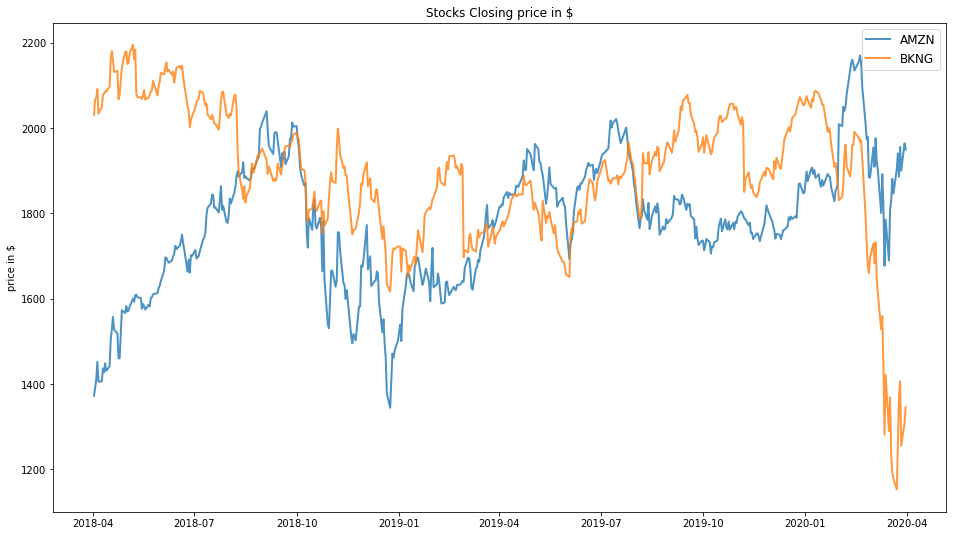

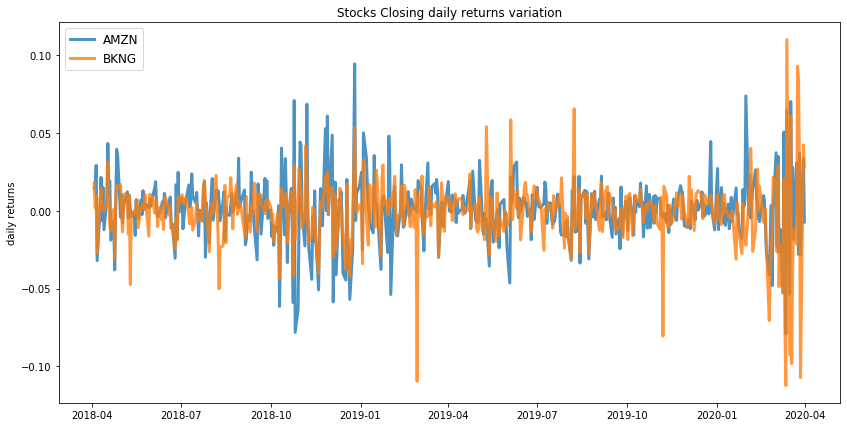

--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.46
Annualised Volatility: 0.46


             AMZN  BKNG
allocation  100.0  0.0 
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.09
Annualised Volatility: 0.4


             AMZN   BKNG
allocation  52.43  47.57


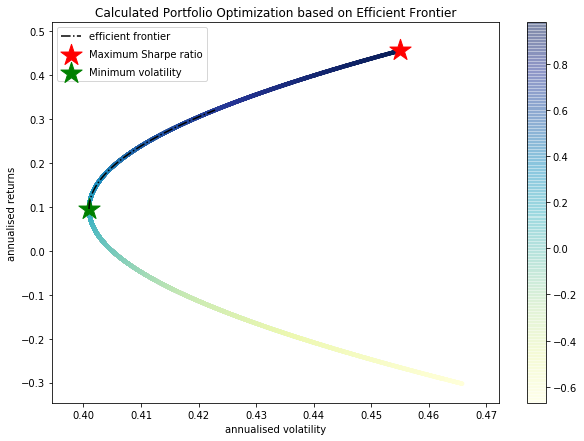

--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

AMZN : annuaised return 0.46 , annualised volatility: 0.45
BKNG : annuaised return -0.3 , annualised volatility: 0.47
--------------------------------------------------------------------------------


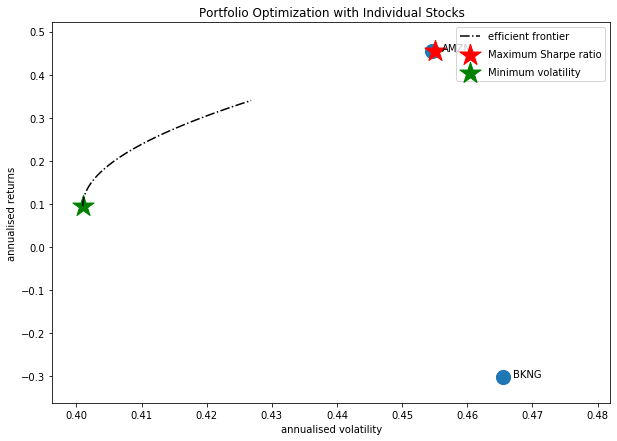

In [95]:
returns_sharpe_company_list = []
start_date = "2018-04-01"
end_date = "2020-04-01"
risk_free_rate = 0.0095
print("perform efficient_frontier_stock_portfolio Pairs of the companies we got {}".format(stock_portfolio_list))
pos_sharpe, Annualised_Return, Annualised_Volatility, allocation_weights = efficient_frontier_stock_portfolio(stock_portfolio_list, len(stock_portfolio_list), risk_free_rate, start_date, end_date)
returns_sharpe_company_list.append([pos_sharpe, Annualised_Return, Annualised_Volatility, stock_portfolio_list, allocation_weights])

In [96]:
shortlisted_portfolio_df = pd.DataFrame(returns_sharpe_company_list)

In [97]:
shortlisted_portfolio_df

,0,1,2,3,4
0,0.980189,0.46,0.46,"[AMZN, BKNG]","[[100.0, 0.0]]"


In [98]:
shortlisted_portfolio_df.columns = ["Sharpe Ratio", "Portfolio Annualised Return", "Portfolio Annualised_Volatility", "Stock Portfolio", "Stocks Weight Allocation"]

In [99]:
# creating a blank series 
Portfolio_Tag = pd.Series([]) 

for row in range(len(shortlisted_portfolio_df)):
    if (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 3):
        Portfolio_Tag[row] = "Excellent"
    elif (shortlisted_portfolio_df["Sharpe Ratio"][row] >= 2 and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 3)):
        Portfolio_Tag[row] = "Very Good"
    elif ((shortlisted_portfolio_df["Sharpe Ratio"][row] >= 1)  and (shortlisted_portfolio_df["Sharpe Ratio"][row] < 2)):
        Portfolio_Tag[row] = "Good"
    else:
        Portfolio_Tag[row] = "Bad"
        
# inserting new column with values of list made above         
shortlisted_portfolio_df.insert(5, "Portfolio Tag", Portfolio_Tag) 

/Users/amoghkallihal/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DeprecationWarning:

The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.



In [100]:
shortlisted_portfolio_df

,Sharpe Ratio,Portfolio Annualised Return,Portfolio Annualised_Volatility,Stock Portfolio,Stocks Weight Allocation,Portfolio Tag
0,0.980189,0.46,0.46,"[AMZN, BKNG]","[[100.0, 0.0]]",Bad
